# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Braun_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Braun_age.h5ad


AnnData object with n_obs × n_vars = 882450 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=0.1, 
    limit_val_batches=0.1,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "braun_age-continuous_4"
)

vae.save(
    dir_path,
    overwrite=True,
)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 80eh5o24
Name: good-flower-602
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/80eh5o24
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_224258-80eh5o24/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `training` set. Number of elements in each group: 50243,47608,17715,49393,102663,14129,31051,52243,25070,40485,68632,22675,71089,81945,31019
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `validation` set. Number of elements in each group: 12401,11994,4468,12498,25509,3473,7714,13170,6330,10091,17116,5757,17701,20470,7798
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [02:22<23:46:10, 142.86s/it]

Epoch 1/600:   0%|          | 1/600 [02:22<23:46:10, 142.86s/it, v_num=24_1, total_loss_train=524, kl_local_train=26.6]

Epoch 2/600:   0%|          | 1/600 [02:22<23:46:10, 142.86s/it, v_num=24_1, total_loss_train=524, kl_local_train=26.6]

Epoch 2/600:   0%|          | 2/600 [02:41<11:36:51, 69.92s/it, v_num=24_1, total_loss_train=524, kl_local_train=26.6] 

Epoch 2/600:   0%|          | 2/600 [02:41<11:36:51, 69.92s/it, v_num=24_1, total_loss_train=493, kl_local_train=32.6]

Epoch 3/600:   0%|          | 2/600 [02:41<11:36:51, 69.92s/it, v_num=24_1, total_loss_train=493, kl_local_train=32.6]

Epoch 3/600:   0%|          | 3/600 [03:00<7:43:46, 46.61s/it, v_num=24_1, total_loss_train=493, kl_local_train=32.6] 

Epoch 3/600:   0%|          | 3/600 [03:00<7:43:46, 46.61s/it, v_num=24_1, total_loss_train=461, kl_local_train=50.8]

Epoch 4/600:   0%|          | 3/600 [03:00<7:43:46, 46.61s/it, v_num=24_1, total_loss_train=461, kl_local_train=50.8]

Epoch 4/600:   1%|          | 4/600 [03:19<5:54:29, 35.69s/it, v_num=24_1, total_loss_train=461, kl_local_train=50.8]

Epoch 4/600:   1%|          | 4/600 [03:19<5:54:29, 35.69s/it, v_num=24_1, total_loss_train=450, kl_local_train=60.1]

Epoch 5/600:   1%|          | 4/600 [03:19<5:54:29, 35.69s/it, v_num=24_1, total_loss_train=450, kl_local_train=60.1]

Epoch 5/600:   1%|          | 5/600 [03:38<4:54:26, 29.69s/it, v_num=24_1, total_loss_train=450, kl_local_train=60.1]

Epoch 5/600:   1%|          | 5/600 [03:38<4:54:26, 29.69s/it, v_num=24_1, total_loss_train=442, kl_local_train=62.8]

Epoch 6/600:   1%|          | 5/600 [03:39<4:54:26, 29.69s/it, v_num=24_1, total_loss_train=442, kl_local_train=62.8]

Epoch 6/600:   1%|          | 6/600 [03:58<4:19:43, 26.23s/it, v_num=24_1, total_loss_train=442, kl_local_train=62.8]

Epoch 6/600:   1%|          | 6/600 [03:58<4:19:43, 26.23s/it, v_num=24_1, total_loss_train=437, kl_local_train=61.1, metric_mi|age_categorical_train=0.12]

Epoch 7/600:   1%|          | 6/600 [03:58<4:19:43, 26.23s/it, v_num=24_1, total_loss_train=437, kl_local_train=61.1, metric_mi|age_categorical_train=0.12]

Epoch 7/600:   1%|          | 7/600 [04:17<3:55:53, 23.87s/it, v_num=24_1, total_loss_train=437, kl_local_train=61.1, metric_mi|age_categorical_train=0.12]

Epoch 7/600:   1%|          | 7/600 [04:17<3:55:53, 23.87s/it, v_num=24_1, total_loss_train=434, kl_local_train=61, metric_mi|age_categorical_train=0.12]  

Epoch 8/600:   1%|          | 7/600 [04:17<3:55:53, 23.87s/it, v_num=24_1, total_loss_train=434, kl_local_train=61, metric_mi|age_categorical_train=0.12]

Epoch 8/600:   1%|▏         | 8/600 [04:36<3:40:14, 22.32s/it, v_num=24_1, total_loss_train=434, kl_local_train=61, metric_mi|age_categorical_train=0.12]

Epoch 8/600:   1%|▏         | 8/600 [04:36<3:40:14, 22.32s/it, v_num=24_1, total_loss_train=446, kl_local_train=83, metric_mi|age_categorical_train=0.12]

Epoch 9/600:   1%|▏         | 8/600 [04:36<3:40:14, 22.32s/it, v_num=24_1, total_loss_train=446, kl_local_train=83, metric_mi|age_categorical_train=0.12]

Epoch 9/600:   2%|▏         | 9/600 [04:55<3:29:49, 21.30s/it, v_num=24_1, total_loss_train=446, kl_local_train=83, metric_mi|age_categorical_train=0.12]

Epoch 9/600:   2%|▏         | 9/600 [04:55<3:29:49, 21.30s/it, v_num=24_1, total_loss_train=450, kl_local_train=76.9, metric_mi|age_categorical_train=0.12]

Epoch 10/600:   2%|▏         | 9/600 [04:55<3:29:49, 21.30s/it, v_num=24_1, total_loss_train=450, kl_local_train=76.9, metric_mi|age_categorical_train=0.12]

Epoch 10/600:   2%|▏         | 10/600 [05:14<3:23:42, 20.72s/it, v_num=24_1, total_loss_train=450, kl_local_train=76.9, metric_mi|age_categorical_train=0.12]

Epoch 10/600:   2%|▏         | 10/600 [05:14<3:23:42, 20.72s/it, v_num=24_1, total_loss_train=450, kl_local_train=91.6, metric_mi|age_categorical_train=0.12]

Epoch 11/600:   2%|▏         | 10/600 [05:15<3:23:42, 20.72s/it, v_num=24_1, total_loss_train=450, kl_local_train=91.6, metric_mi|age_categorical_train=0.12]

Epoch 11/600:   2%|▏         | 11/600 [05:34<3:19:54, 20.36s/it, v_num=24_1, total_loss_train=450, kl_local_train=91.6, metric_mi|age_categorical_train=0.12]

Epoch 11/600:   2%|▏         | 11/600 [05:34<3:19:54, 20.36s/it, v_num=24_1, total_loss_train=450, kl_local_train=120, metric_mi|age_categorical_train=0.151]

Epoch 12/600:   2%|▏         | 11/600 [05:34<3:19:54, 20.36s/it, v_num=24_1, total_loss_train=450, kl_local_train=120, metric_mi|age_categorical_train=0.151]

Epoch 12/600:   2%|▏         | 12/600 [05:53<3:15:39, 19.96s/it, v_num=24_1, total_loss_train=450, kl_local_train=120, metric_mi|age_categorical_train=0.151]

Epoch 12/600:   2%|▏         | 12/600 [05:53<3:15:39, 19.96s/it, v_num=24_1, total_loss_train=451, kl_local_train=144, metric_mi|age_categorical_train=0.151]

Epoch 13/600:   2%|▏         | 12/600 [05:53<3:15:39, 19.96s/it, v_num=24_1, total_loss_train=451, kl_local_train=144, metric_mi|age_categorical_train=0.151]

Epoch 13/600:   2%|▏         | 13/600 [06:12<3:12:25, 19.67s/it, v_num=24_1, total_loss_train=451, kl_local_train=144, metric_mi|age_categorical_train=0.151]

Epoch 13/600:   2%|▏         | 13/600 [06:12<3:12:25, 19.67s/it, v_num=24_1, total_loss_train=448, kl_local_train=154, metric_mi|age_categorical_train=0.151]

Epoch 14/600:   2%|▏         | 13/600 [06:12<3:12:25, 19.67s/it, v_num=24_1, total_loss_train=448, kl_local_train=154, metric_mi|age_categorical_train=0.151]

Epoch 14/600:   2%|▏         | 14/600 [06:31<3:10:34, 19.51s/it, v_num=24_1, total_loss_train=448, kl_local_train=154, metric_mi|age_categorical_train=0.151]

Epoch 14/600:   2%|▏         | 14/600 [06:31<3:10:34, 19.51s/it, v_num=24_1, total_loss_train=451, kl_local_train=164, metric_mi|age_categorical_train=0.151]

Epoch 15/600:   2%|▏         | 14/600 [06:31<3:10:34, 19.51s/it, v_num=24_1, total_loss_train=451, kl_local_train=164, metric_mi|age_categorical_train=0.151]

Epoch 15/600:   2%|▎         | 15/600 [06:50<3:09:11, 19.40s/it, v_num=24_1, total_loss_train=451, kl_local_train=164, metric_mi|age_categorical_train=0.151]

Epoch 15/600:   2%|▎         | 15/600 [06:50<3:09:11, 19.40s/it, v_num=24_1, total_loss_train=452, kl_local_train=177, metric_mi|age_categorical_train=0.151]

Epoch 16/600:   2%|▎         | 15/600 [06:50<3:09:11, 19.40s/it, v_num=24_1, total_loss_train=452, kl_local_train=177, metric_mi|age_categorical_train=0.151]

Epoch 16/600:   3%|▎         | 16/600 [07:10<3:09:14, 19.44s/it, v_num=24_1, total_loss_train=452, kl_local_train=177, metric_mi|age_categorical_train=0.151]

Epoch 16/600:   3%|▎         | 16/600 [07:10<3:09:14, 19.44s/it, v_num=24_1, total_loss_train=454, kl_local_train=184, metric_mi|age_categorical_train=0.224]

Epoch 17/600:   3%|▎         | 16/600 [07:10<3:09:14, 19.44s/it, v_num=24_1, total_loss_train=454, kl_local_train=184, metric_mi|age_categorical_train=0.224]

Epoch 17/600:   3%|▎         | 17/600 [07:29<3:08:07, 19.36s/it, v_num=24_1, total_loss_train=454, kl_local_train=184, metric_mi|age_categorical_train=0.224]

Epoch 17/600:   3%|▎         | 17/600 [07:29<3:08:07, 19.36s/it, v_num=24_1, total_loss_train=454, kl_local_train=194, metric_mi|age_categorical_train=0.224]

Epoch 18/600:   3%|▎         | 17/600 [07:29<3:08:07, 19.36s/it, v_num=24_1, total_loss_train=454, kl_local_train=194, metric_mi|age_categorical_train=0.224]

Epoch 18/600:   3%|▎         | 18/600 [07:48<3:06:55, 19.27s/it, v_num=24_1, total_loss_train=454, kl_local_train=194, metric_mi|age_categorical_train=0.224]

Epoch 18/600:   3%|▎         | 18/600 [07:48<3:06:55, 19.27s/it, v_num=24_1, total_loss_train=453, kl_local_train=204, metric_mi|age_categorical_train=0.224]

Epoch 19/600:   3%|▎         | 18/600 [07:48<3:06:55, 19.27s/it, v_num=24_1, total_loss_train=453, kl_local_train=204, metric_mi|age_categorical_train=0.224]

Epoch 19/600:   3%|▎         | 19/600 [08:07<3:05:56, 19.20s/it, v_num=24_1, total_loss_train=453, kl_local_train=204, metric_mi|age_categorical_train=0.224]

Epoch 19/600:   3%|▎         | 19/600 [08:07<3:05:56, 19.20s/it, v_num=24_1, total_loss_train=456, kl_local_train=208, metric_mi|age_categorical_train=0.224]

Epoch 20/600:   3%|▎         | 19/600 [08:07<3:05:56, 19.20s/it, v_num=24_1, total_loss_train=456, kl_local_train=208, metric_mi|age_categorical_train=0.224]

Epoch 20/600:   3%|▎         | 20/600 [08:26<3:05:45, 19.22s/it, v_num=24_1, total_loss_train=456, kl_local_train=208, metric_mi|age_categorical_train=0.224]

Epoch 20/600:   3%|▎         | 20/600 [08:26<3:05:45, 19.22s/it, v_num=24_1, total_loss_train=459, kl_local_train=215, metric_mi|age_categorical_train=0.224]

Epoch 21/600:   3%|▎         | 20/600 [08:26<3:05:45, 19.22s/it, v_num=24_1, total_loss_train=459, kl_local_train=215, metric_mi|age_categorical_train=0.224]

Epoch 21/600:   4%|▎         | 21/600 [08:46<3:06:12, 19.30s/it, v_num=24_1, total_loss_train=459, kl_local_train=215, metric_mi|age_categorical_train=0.224]

Epoch 21/600:   4%|▎         | 21/600 [08:46<3:06:12, 19.30s/it, v_num=24_1, total_loss_train=461, kl_local_train=221, metric_mi|age_categorical_train=0.269]

Epoch 22/600:   4%|▎         | 21/600 [08:46<3:06:12, 19.30s/it, v_num=24_1, total_loss_train=461, kl_local_train=221, metric_mi|age_categorical_train=0.269]

Epoch 22/600:   4%|▎         | 22/600 [09:05<3:05:04, 19.21s/it, v_num=24_1, total_loss_train=461, kl_local_train=221, metric_mi|age_categorical_train=0.269]

Epoch 22/600:   4%|▎         | 22/600 [09:05<3:05:04, 19.21s/it, v_num=24_1, total_loss_train=460, kl_local_train=224, metric_mi|age_categorical_train=0.269]

Epoch 23/600:   4%|▎         | 22/600 [09:05<3:05:04, 19.21s/it, v_num=24_1, total_loss_train=460, kl_local_train=224, metric_mi|age_categorical_train=0.269]

Epoch 23/600:   4%|▍         | 23/600 [09:24<3:04:10, 19.15s/it, v_num=24_1, total_loss_train=460, kl_local_train=224, metric_mi|age_categorical_train=0.269]

Epoch 23/600:   4%|▍         | 23/600 [09:24<3:04:10, 19.15s/it, v_num=24_1, total_loss_train=463, kl_local_train=225, metric_mi|age_categorical_train=0.269]

Epoch 24/600:   4%|▍         | 23/600 [09:24<3:04:10, 19.15s/it, v_num=24_1, total_loss_train=463, kl_local_train=225, metric_mi|age_categorical_train=0.269]

Epoch 24/600:   4%|▍         | 24/600 [09:43<3:03:49, 19.15s/it, v_num=24_1, total_loss_train=463, kl_local_train=225, metric_mi|age_categorical_train=0.269]

Epoch 24/600:   4%|▍         | 24/600 [09:43<3:03:49, 19.15s/it, v_num=24_1, total_loss_train=467, kl_local_train=228, metric_mi|age_categorical_train=0.269]

Epoch 25/600:   4%|▍         | 24/600 [09:43<3:03:49, 19.15s/it, v_num=24_1, total_loss_train=467, kl_local_train=228, metric_mi|age_categorical_train=0.269]

Epoch 25/600:   4%|▍         | 25/600 [10:02<3:03:57, 19.19s/it, v_num=24_1, total_loss_train=467, kl_local_train=228, metric_mi|age_categorical_train=0.269]

Epoch 25/600:   4%|▍         | 25/600 [10:02<3:03:57, 19.19s/it, v_num=24_1, total_loss_train=468, kl_local_train=231, metric_mi|age_categorical_train=0.269]

Epoch 26/600:   4%|▍         | 25/600 [10:02<3:03:57, 19.19s/it, v_num=24_1, total_loss_train=468, kl_local_train=231, metric_mi|age_categorical_train=0.269]

Epoch 26/600:   4%|▍         | 26/600 [10:22<3:05:01, 19.34s/it, v_num=24_1, total_loss_train=468, kl_local_train=231, metric_mi|age_categorical_train=0.269]

Epoch 26/600:   4%|▍         | 26/600 [10:22<3:05:01, 19.34s/it, v_num=24_1, total_loss_train=470, kl_local_train=236, metric_mi|age_categorical_train=0.284]

Epoch 27/600:   4%|▍         | 26/600 [10:22<3:05:01, 19.34s/it, v_num=24_1, total_loss_train=470, kl_local_train=236, metric_mi|age_categorical_train=0.284]

Epoch 27/600:   4%|▍         | 27/600 [10:41<3:03:56, 19.26s/it, v_num=24_1, total_loss_train=470, kl_local_train=236, metric_mi|age_categorical_train=0.284]

Epoch 27/600:   4%|▍         | 27/600 [10:41<3:03:56, 19.26s/it, v_num=24_1, total_loss_train=471, kl_local_train=238, metric_mi|age_categorical_train=0.284]

Epoch 28/600:   4%|▍         | 27/600 [10:41<3:03:56, 19.26s/it, v_num=24_1, total_loss_train=471, kl_local_train=238, metric_mi|age_categorical_train=0.284]

Epoch 28/600:   5%|▍         | 28/600 [11:00<3:02:51, 19.18s/it, v_num=24_1, total_loss_train=471, kl_local_train=238, metric_mi|age_categorical_train=0.284]

Epoch 28/600:   5%|▍         | 28/600 [11:00<3:02:51, 19.18s/it, v_num=24_1, total_loss_train=475, kl_local_train=247, metric_mi|age_categorical_train=0.284]

Epoch 29/600:   5%|▍         | 28/600 [11:00<3:02:51, 19.18s/it, v_num=24_1, total_loss_train=475, kl_local_train=247, metric_mi|age_categorical_train=0.284]

Epoch 29/600:   5%|▍         | 29/600 [11:19<3:02:24, 19.17s/it, v_num=24_1, total_loss_train=475, kl_local_train=247, metric_mi|age_categorical_train=0.284]

Epoch 29/600:   5%|▍         | 29/600 [11:19<3:02:24, 19.17s/it, v_num=24_1, total_loss_train=475, kl_local_train=245, metric_mi|age_categorical_train=0.284]

Epoch 30/600:   5%|▍         | 29/600 [11:19<3:02:24, 19.17s/it, v_num=24_1, total_loss_train=475, kl_local_train=245, metric_mi|age_categorical_train=0.284]

Epoch 30/600:   5%|▌         | 30/600 [11:38<3:02:10, 19.18s/it, v_num=24_1, total_loss_train=475, kl_local_train=245, metric_mi|age_categorical_train=0.284]

Epoch 30/600:   5%|▌         | 30/600 [11:38<3:02:10, 19.18s/it, v_num=24_1, total_loss_train=478, kl_local_train=250, metric_mi|age_categorical_train=0.284]

Epoch 31/600:   5%|▌         | 30/600 [11:39<3:02:10, 19.18s/it, v_num=24_1, total_loss_train=478, kl_local_train=250, metric_mi|age_categorical_train=0.284]

Epoch 31/600:   5%|▌         | 31/600 [11:58<3:02:47, 19.27s/it, v_num=24_1, total_loss_train=478, kl_local_train=250, metric_mi|age_categorical_train=0.284]

Epoch 31/600:   5%|▌         | 31/600 [11:58<3:02:47, 19.27s/it, v_num=24_1, total_loss_train=479, kl_local_train=253, metric_mi|age_categorical_train=0.298]

Epoch 32/600:   5%|▌         | 31/600 [11:58<3:02:47, 19.27s/it, v_num=24_1, total_loss_train=479, kl_local_train=253, metric_mi|age_categorical_train=0.298]

Epoch 32/600:   5%|▌         | 32/600 [12:17<3:01:43, 19.20s/it, v_num=24_1, total_loss_train=479, kl_local_train=253, metric_mi|age_categorical_train=0.298]

Epoch 32/600:   5%|▌         | 32/600 [12:17<3:01:43, 19.20s/it, v_num=24_1, total_loss_train=482, kl_local_train=254, metric_mi|age_categorical_train=0.298]

Epoch 33/600:   5%|▌         | 32/600 [12:17<3:01:43, 19.20s/it, v_num=24_1, total_loss_train=482, kl_local_train=254, metric_mi|age_categorical_train=0.298]

Epoch 33/600:   6%|▌         | 33/600 [12:36<3:01:04, 19.16s/it, v_num=24_1, total_loss_train=482, kl_local_train=254, metric_mi|age_categorical_train=0.298]

Epoch 33/600:   6%|▌         | 33/600 [12:36<3:01:04, 19.16s/it, v_num=24_1, total_loss_train=483, kl_local_train=257, metric_mi|age_categorical_train=0.298]

Epoch 34/600:   6%|▌         | 33/600 [12:36<3:01:04, 19.16s/it, v_num=24_1, total_loss_train=483, kl_local_train=257, metric_mi|age_categorical_train=0.298]

Epoch 34/600:   6%|▌         | 34/600 [12:55<3:00:04, 19.09s/it, v_num=24_1, total_loss_train=483, kl_local_train=257, metric_mi|age_categorical_train=0.298]

Epoch 34/600:   6%|▌         | 34/600 [12:55<3:00:04, 19.09s/it, v_num=24_1, total_loss_train=483, kl_local_train=260, metric_mi|age_categorical_train=0.298]

Epoch 35/600:   6%|▌         | 34/600 [12:55<3:00:04, 19.09s/it, v_num=24_1, total_loss_train=483, kl_local_train=260, metric_mi|age_categorical_train=0.298]

Epoch 35/600:   6%|▌         | 35/600 [13:14<2:59:27, 19.06s/it, v_num=24_1, total_loss_train=483, kl_local_train=260, metric_mi|age_categorical_train=0.298]

Epoch 35/600:   6%|▌         | 35/600 [13:14<2:59:27, 19.06s/it, v_num=24_1, total_loss_train=486, kl_local_train=266, metric_mi|age_categorical_train=0.298]

Epoch 36/600:   6%|▌         | 35/600 [13:14<2:59:27, 19.06s/it, v_num=24_1, total_loss_train=486, kl_local_train=266, metric_mi|age_categorical_train=0.298]

Epoch 36/600:   6%|▌         | 36/600 [13:33<3:00:51, 19.24s/it, v_num=24_1, total_loss_train=486, kl_local_train=266, metric_mi|age_categorical_train=0.298]

Epoch 36/600:   6%|▌         | 36/600 [13:33<3:00:51, 19.24s/it, v_num=24_1, total_loss_train=492, kl_local_train=268, metric_mi|age_categorical_train=0.317]

Epoch 37/600:   6%|▌         | 36/600 [13:33<3:00:51, 19.24s/it, v_num=24_1, total_loss_train=492, kl_local_train=268, metric_mi|age_categorical_train=0.317]

Epoch 37/600:   6%|▌         | 37/600 [13:52<2:59:23, 19.12s/it, v_num=24_1, total_loss_train=492, kl_local_train=268, metric_mi|age_categorical_train=0.317]

Epoch 37/600:   6%|▌         | 37/600 [13:52<2:59:23, 19.12s/it, v_num=24_1, total_loss_train=491, kl_local_train=267, metric_mi|age_categorical_train=0.317]

Epoch 38/600:   6%|▌         | 37/600 [13:52<2:59:23, 19.12s/it, v_num=24_1, total_loss_train=491, kl_local_train=267, metric_mi|age_categorical_train=0.317]

Epoch 38/600:   6%|▋         | 38/600 [14:11<2:58:52, 19.10s/it, v_num=24_1, total_loss_train=491, kl_local_train=267, metric_mi|age_categorical_train=0.317]

Epoch 38/600:   6%|▋         | 38/600 [14:11<2:58:52, 19.10s/it, v_num=24_1, total_loss_train=494, kl_local_train=270, metric_mi|age_categorical_train=0.317]

Epoch 39/600:   6%|▋         | 38/600 [14:11<2:58:52, 19.10s/it, v_num=24_1, total_loss_train=494, kl_local_train=270, metric_mi|age_categorical_train=0.317]

Epoch 39/600:   6%|▋         | 39/600 [14:30<2:58:03, 19.04s/it, v_num=24_1, total_loss_train=494, kl_local_train=270, metric_mi|age_categorical_train=0.317]

Epoch 39/600:   6%|▋         | 39/600 [14:30<2:58:03, 19.04s/it, v_num=24_1, total_loss_train=496, kl_local_train=270, metric_mi|age_categorical_train=0.317]

Epoch 40/600:   6%|▋         | 39/600 [14:30<2:58:03, 19.04s/it, v_num=24_1, total_loss_train=496, kl_local_train=270, metric_mi|age_categorical_train=0.317]

Epoch 40/600:   7%|▋         | 40/600 [14:49<2:57:50, 19.05s/it, v_num=24_1, total_loss_train=496, kl_local_train=270, metric_mi|age_categorical_train=0.317]

Epoch 40/600:   7%|▋         | 40/600 [14:49<2:57:50, 19.05s/it, v_num=24_1, total_loss_train=496, kl_local_train=268, metric_mi|age_categorical_train=0.317]

Epoch 41/600:   7%|▋         | 40/600 [14:50<2:57:50, 19.05s/it, v_num=24_1, total_loss_train=496, kl_local_train=268, metric_mi|age_categorical_train=0.317]

Epoch 41/600:   7%|▋         | 41/600 [15:09<2:58:39, 19.18s/it, v_num=24_1, total_loss_train=496, kl_local_train=268, metric_mi|age_categorical_train=0.317]

Epoch 41/600:   7%|▋         | 41/600 [15:09<2:58:39, 19.18s/it, v_num=24_1, total_loss_train=500, kl_local_train=269, metric_mi|age_categorical_train=0.325]

Epoch 42/600:   7%|▋         | 41/600 [15:09<2:58:39, 19.18s/it, v_num=24_1, total_loss_train=500, kl_local_train=269, metric_mi|age_categorical_train=0.325]

Epoch 42/600:   7%|▋         | 42/600 [15:28<2:57:45, 19.11s/it, v_num=24_1, total_loss_train=500, kl_local_train=269, metric_mi|age_categorical_train=0.325]

Epoch 42/600:   7%|▋         | 42/600 [15:28<2:57:45, 19.11s/it, v_num=24_1, total_loss_train=500, kl_local_train=268, metric_mi|age_categorical_train=0.325]

Epoch 43/600:   7%|▋         | 42/600 [15:28<2:57:45, 19.11s/it, v_num=24_1, total_loss_train=500, kl_local_train=268, metric_mi|age_categorical_train=0.325]

Epoch 43/600:   7%|▋         | 43/600 [15:47<2:57:19, 19.10s/it, v_num=24_1, total_loss_train=500, kl_local_train=268, metric_mi|age_categorical_train=0.325]

Epoch 43/600:   7%|▋         | 43/600 [15:47<2:57:19, 19.10s/it, v_num=24_1, total_loss_train=503, kl_local_train=263, metric_mi|age_categorical_train=0.325]

Epoch 44/600:   7%|▋         | 43/600 [15:47<2:57:19, 19.10s/it, v_num=24_1, total_loss_train=503, kl_local_train=263, metric_mi|age_categorical_train=0.325]

Epoch 44/600:   7%|▋         | 44/600 [16:06<2:56:45, 19.07s/it, v_num=24_1, total_loss_train=503, kl_local_train=263, metric_mi|age_categorical_train=0.325]

Epoch 44/600:   7%|▋         | 44/600 [16:06<2:56:45, 19.07s/it, v_num=24_1, total_loss_train=507, kl_local_train=269, metric_mi|age_categorical_train=0.325]

Epoch 45/600:   7%|▋         | 44/600 [16:06<2:56:45, 19.07s/it, v_num=24_1, total_loss_train=507, kl_local_train=269, metric_mi|age_categorical_train=0.325]

Epoch 45/600:   8%|▊         | 45/600 [16:25<2:56:23, 19.07s/it, v_num=24_1, total_loss_train=507, kl_local_train=269, metric_mi|age_categorical_train=0.325]

Epoch 45/600:   8%|▊         | 45/600 [16:25<2:56:23, 19.07s/it, v_num=24_1, total_loss_train=508, kl_local_train=271, metric_mi|age_categorical_train=0.325]

Epoch 46/600:   8%|▊         | 45/600 [16:25<2:56:23, 19.07s/it, v_num=24_1, total_loss_train=508, kl_local_train=271, metric_mi|age_categorical_train=0.325]

Epoch 46/600:   8%|▊         | 46/600 [16:44<2:57:01, 19.17s/it, v_num=24_1, total_loss_train=508, kl_local_train=271, metric_mi|age_categorical_train=0.325]

Epoch 46/600:   8%|▊         | 46/600 [16:44<2:57:01, 19.17s/it, v_num=24_1, total_loss_train=508, kl_local_train=260, metric_mi|age_categorical_train=0.342]

Epoch 47/600:   8%|▊         | 46/600 [16:44<2:57:01, 19.17s/it, v_num=24_1, total_loss_train=508, kl_local_train=260, metric_mi|age_categorical_train=0.342]

Epoch 47/600:   8%|▊         | 47/600 [17:03<2:56:13, 19.12s/it, v_num=24_1, total_loss_train=508, kl_local_train=260, metric_mi|age_categorical_train=0.342]

Epoch 47/600:   8%|▊         | 47/600 [17:03<2:56:13, 19.12s/it, v_num=24_1, total_loss_train=510, kl_local_train=267, metric_mi|age_categorical_train=0.342]

Epoch 48/600:   8%|▊         | 47/600 [17:03<2:56:13, 19.12s/it, v_num=24_1, total_loss_train=510, kl_local_train=267, metric_mi|age_categorical_train=0.342]

Epoch 48/600:   8%|▊         | 48/600 [17:22<2:55:42, 19.10s/it, v_num=24_1, total_loss_train=510, kl_local_train=267, metric_mi|age_categorical_train=0.342]

Epoch 48/600:   8%|▊         | 48/600 [17:22<2:55:42, 19.10s/it, v_num=24_1, total_loss_train=514, kl_local_train=260, metric_mi|age_categorical_train=0.342]

Epoch 49/600:   8%|▊         | 48/600 [17:22<2:55:42, 19.10s/it, v_num=24_1, total_loss_train=514, kl_local_train=260, metric_mi|age_categorical_train=0.342]

Epoch 49/600:   8%|▊         | 49/600 [17:41<2:54:57, 19.05s/it, v_num=24_1, total_loss_train=514, kl_local_train=260, metric_mi|age_categorical_train=0.342]

Epoch 49/600:   8%|▊         | 49/600 [17:41<2:54:57, 19.05s/it, v_num=24_1, total_loss_train=516, kl_local_train=262, metric_mi|age_categorical_train=0.342]

Epoch 50/600:   8%|▊         | 49/600 [17:41<2:54:57, 19.05s/it, v_num=24_1, total_loss_train=516, kl_local_train=262, metric_mi|age_categorical_train=0.342]

Epoch 50/600:   8%|▊         | 50/600 [18:00<2:54:52, 19.08s/it, v_num=24_1, total_loss_train=516, kl_local_train=262, metric_mi|age_categorical_train=0.342]

Epoch 50/600:   8%|▊         | 50/600 [18:00<2:54:52, 19.08s/it, v_num=24_1, total_loss_train=519, kl_local_train=263, metric_mi|age_categorical_train=0.342]

Epoch 51/600:   8%|▊         | 50/600 [18:01<2:54:52, 19.08s/it, v_num=24_1, total_loss_train=519, kl_local_train=263, metric_mi|age_categorical_train=0.342]

Epoch 51/600:   8%|▊         | 51/600 [18:20<2:55:20, 19.16s/it, v_num=24_1, total_loss_train=519, kl_local_train=263, metric_mi|age_categorical_train=0.342]

Epoch 51/600:   8%|▊         | 51/600 [18:20<2:55:20, 19.16s/it, v_num=24_1, total_loss_train=517, kl_local_train=258, metric_mi|age_categorical_train=0.328]

Epoch 52/600:   8%|▊         | 51/600 [18:20<2:55:20, 19.16s/it, v_num=24_1, total_loss_train=517, kl_local_train=258, metric_mi|age_categorical_train=0.328]

Epoch 52/600:   9%|▊         | 52/600 [18:39<2:54:58, 19.16s/it, v_num=24_1, total_loss_train=517, kl_local_train=258, metric_mi|age_categorical_train=0.328]

Epoch 52/600:   9%|▊         | 52/600 [18:39<2:54:58, 19.16s/it, v_num=24_1, total_loss_train=519, kl_local_train=256, metric_mi|age_categorical_train=0.328]

Epoch 53/600:   9%|▊         | 52/600 [18:39<2:54:58, 19.16s/it, v_num=24_1, total_loss_train=519, kl_local_train=256, metric_mi|age_categorical_train=0.328]

Epoch 53/600:   9%|▉         | 53/600 [18:58<2:54:24, 19.13s/it, v_num=24_1, total_loss_train=519, kl_local_train=256, metric_mi|age_categorical_train=0.328]

Epoch 53/600:   9%|▉         | 53/600 [18:58<2:54:24, 19.13s/it, v_num=24_1, total_loss_train=518, kl_local_train=255, metric_mi|age_categorical_train=0.328]

Epoch 54/600:   9%|▉         | 53/600 [18:58<2:54:24, 19.13s/it, v_num=24_1, total_loss_train=518, kl_local_train=255, metric_mi|age_categorical_train=0.328]

Epoch 54/600:   9%|▉         | 54/600 [19:17<2:53:39, 19.08s/it, v_num=24_1, total_loss_train=518, kl_local_train=255, metric_mi|age_categorical_train=0.328]

Epoch 54/600:   9%|▉         | 54/600 [19:17<2:53:39, 19.08s/it, v_num=24_1, total_loss_train=518, kl_local_train=251, metric_mi|age_categorical_train=0.328]

Epoch 55/600:   9%|▉         | 54/600 [19:17<2:53:39, 19.08s/it, v_num=24_1, total_loss_train=518, kl_local_train=251, metric_mi|age_categorical_train=0.328]

Epoch 55/600:   9%|▉         | 55/600 [19:36<2:53:30, 19.10s/it, v_num=24_1, total_loss_train=518, kl_local_train=251, metric_mi|age_categorical_train=0.328]

Epoch 55/600:   9%|▉         | 55/600 [19:36<2:53:30, 19.10s/it, v_num=24_1, total_loss_train=519, kl_local_train=245, metric_mi|age_categorical_train=0.328]

Epoch 56/600:   9%|▉         | 55/600 [19:36<2:53:30, 19.10s/it, v_num=24_1, total_loss_train=519, kl_local_train=245, metric_mi|age_categorical_train=0.328]

Epoch 56/600:   9%|▉         | 56/600 [19:56<2:54:34, 19.25s/it, v_num=24_1, total_loss_train=519, kl_local_train=245, metric_mi|age_categorical_train=0.328]

Epoch 56/600:   9%|▉         | 56/600 [19:56<2:54:34, 19.25s/it, v_num=24_1, total_loss_train=517, kl_local_train=242, metric_mi|age_categorical_train=0.31] 

Epoch 57/600:   9%|▉         | 56/600 [19:56<2:54:34, 19.25s/it, v_num=24_1, total_loss_train=517, kl_local_train=242, metric_mi|age_categorical_train=0.31]

Epoch 57/600:  10%|▉         | 57/600 [20:15<2:53:44, 19.20s/it, v_num=24_1, total_loss_train=517, kl_local_train=242, metric_mi|age_categorical_train=0.31]

Epoch 57/600:  10%|▉         | 57/600 [20:15<2:53:44, 19.20s/it, v_num=24_1, total_loss_train=518, kl_local_train=242, metric_mi|age_categorical_train=0.31]

Epoch 58/600:  10%|▉         | 57/600 [20:15<2:53:44, 19.20s/it, v_num=24_1, total_loss_train=518, kl_local_train=242, metric_mi|age_categorical_train=0.31]

Epoch 58/600:  10%|▉         | 58/600 [20:34<2:52:57, 19.15s/it, v_num=24_1, total_loss_train=518, kl_local_train=242, metric_mi|age_categorical_train=0.31]

Epoch 58/600:  10%|▉         | 58/600 [20:34<2:52:57, 19.15s/it, v_num=24_1, total_loss_train=518, kl_local_train=238, metric_mi|age_categorical_train=0.31]

Epoch 59/600:  10%|▉         | 58/600 [20:34<2:52:57, 19.15s/it, v_num=24_1, total_loss_train=518, kl_local_train=238, metric_mi|age_categorical_train=0.31]

Epoch 59/600:  10%|▉         | 59/600 [20:52<2:51:44, 19.05s/it, v_num=24_1, total_loss_train=518, kl_local_train=238, metric_mi|age_categorical_train=0.31]

Epoch 59/600:  10%|▉         | 59/600 [20:52<2:51:44, 19.05s/it, v_num=24_1, total_loss_train=518, kl_local_train=234, metric_mi|age_categorical_train=0.31]

Epoch 60/600:  10%|▉         | 59/600 [20:52<2:51:44, 19.05s/it, v_num=24_1, total_loss_train=518, kl_local_train=234, metric_mi|age_categorical_train=0.31]

Epoch 60/600:  10%|█         | 60/600 [21:11<2:51:05, 19.01s/it, v_num=24_1, total_loss_train=518, kl_local_train=234, metric_mi|age_categorical_train=0.31]

Epoch 60/600:  10%|█         | 60/600 [21:11<2:51:05, 19.01s/it, v_num=24_1, total_loss_train=519, kl_local_train=233, metric_mi|age_categorical_train=0.31]

Epoch 61/600:  10%|█         | 60/600 [21:12<2:51:05, 19.01s/it, v_num=24_1, total_loss_train=519, kl_local_train=233, metric_mi|age_categorical_train=0.31]

Epoch 61/600:  10%|█         | 61/600 [21:31<2:51:44, 19.12s/it, v_num=24_1, total_loss_train=519, kl_local_train=233, metric_mi|age_categorical_train=0.31]

Epoch 61/600:  10%|█         | 61/600 [21:31<2:51:44, 19.12s/it, v_num=24_1, total_loss_train=517, kl_local_train=231, metric_mi|age_categorical_train=0.311]

Epoch 62/600:  10%|█         | 61/600 [21:31<2:51:44, 19.12s/it, v_num=24_1, total_loss_train=517, kl_local_train=231, metric_mi|age_categorical_train=0.311]

Epoch 62/600:  10%|█         | 62/600 [21:50<2:50:35, 19.03s/it, v_num=24_1, total_loss_train=517, kl_local_train=231, metric_mi|age_categorical_train=0.311]

Epoch 62/600:  10%|█         | 62/600 [21:50<2:50:35, 19.03s/it, v_num=24_1, total_loss_train=518, kl_local_train=229, metric_mi|age_categorical_train=0.311]

Epoch 63/600:  10%|█         | 62/600 [21:50<2:50:35, 19.03s/it, v_num=24_1, total_loss_train=518, kl_local_train=229, metric_mi|age_categorical_train=0.311]

Epoch 63/600:  10%|█         | 63/600 [22:08<2:49:37, 18.95s/it, v_num=24_1, total_loss_train=518, kl_local_train=229, metric_mi|age_categorical_train=0.311]

Epoch 63/600:  10%|█         | 63/600 [22:08<2:49:37, 18.95s/it, v_num=24_1, total_loss_train=516, kl_local_train=226, metric_mi|age_categorical_train=0.311]

Epoch 64/600:  10%|█         | 63/600 [22:08<2:49:37, 18.95s/it, v_num=24_1, total_loss_train=516, kl_local_train=226, metric_mi|age_categorical_train=0.311]

Epoch 64/600:  11%|█         | 64/600 [22:27<2:49:03, 18.92s/it, v_num=24_1, total_loss_train=516, kl_local_train=226, metric_mi|age_categorical_train=0.311]

Epoch 64/600:  11%|█         | 64/600 [22:27<2:49:03, 18.92s/it, v_num=24_1, total_loss_train=518, kl_local_train=225, metric_mi|age_categorical_train=0.311]

Epoch 65/600:  11%|█         | 64/600 [22:27<2:49:03, 18.92s/it, v_num=24_1, total_loss_train=518, kl_local_train=225, metric_mi|age_categorical_train=0.311]

Epoch 65/600:  11%|█         | 65/600 [22:46<2:48:48, 18.93s/it, v_num=24_1, total_loss_train=518, kl_local_train=225, metric_mi|age_categorical_train=0.311]

Epoch 65/600:  11%|█         | 65/600 [22:46<2:48:48, 18.93s/it, v_num=24_1, total_loss_train=518, kl_local_train=225, metric_mi|age_categorical_train=0.311]

Epoch 66/600:  11%|█         | 65/600 [22:47<2:48:48, 18.93s/it, v_num=24_1, total_loss_train=518, kl_local_train=225, metric_mi|age_categorical_train=0.311]

Epoch 66/600:  11%|█         | 66/600 [23:05<2:49:08, 19.01s/it, v_num=24_1, total_loss_train=518, kl_local_train=225, metric_mi|age_categorical_train=0.311]

Epoch 66/600:  11%|█         | 66/600 [23:05<2:49:08, 19.01s/it, v_num=24_1, total_loss_train=517, kl_local_train=223, metric_mi|age_categorical_train=0.312]

Epoch 67/600:  11%|█         | 66/600 [23:05<2:49:08, 19.01s/it, v_num=24_1, total_loss_train=517, kl_local_train=223, metric_mi|age_categorical_train=0.312]

Epoch 67/600:  11%|█         | 67/600 [23:24<2:48:12, 18.94s/it, v_num=24_1, total_loss_train=517, kl_local_train=223, metric_mi|age_categorical_train=0.312]

Epoch 67/600:  11%|█         | 67/600 [23:24<2:48:12, 18.94s/it, v_num=24_1, total_loss_train=516, kl_local_train=223, metric_mi|age_categorical_train=0.312]

Epoch 68/600:  11%|█         | 67/600 [23:24<2:48:12, 18.94s/it, v_num=24_1, total_loss_train=516, kl_local_train=223, metric_mi|age_categorical_train=0.312]

Epoch 68/600:  11%|█▏        | 68/600 [23:43<2:47:26, 18.88s/it, v_num=24_1, total_loss_train=516, kl_local_train=223, metric_mi|age_categorical_train=0.312]

Epoch 68/600:  11%|█▏        | 68/600 [23:43<2:47:26, 18.88s/it, v_num=24_1, total_loss_train=518, kl_local_train=217, metric_mi|age_categorical_train=0.312]

Epoch 69/600:  11%|█▏        | 68/600 [23:43<2:47:26, 18.88s/it, v_num=24_1, total_loss_train=518, kl_local_train=217, metric_mi|age_categorical_train=0.312]

Epoch 69/600:  12%|█▏        | 69/600 [24:02<2:46:29, 18.81s/it, v_num=24_1, total_loss_train=518, kl_local_train=217, metric_mi|age_categorical_train=0.312]

Epoch 69/600:  12%|█▏        | 69/600 [24:02<2:46:29, 18.81s/it, v_num=24_1, total_loss_train=516, kl_local_train=220, metric_mi|age_categorical_train=0.312]

Epoch 70/600:  12%|█▏        | 69/600 [24:02<2:46:29, 18.81s/it, v_num=24_1, total_loss_train=516, kl_local_train=220, metric_mi|age_categorical_train=0.312]

Epoch 70/600:  12%|█▏        | 70/600 [24:20<2:46:14, 18.82s/it, v_num=24_1, total_loss_train=516, kl_local_train=220, metric_mi|age_categorical_train=0.312]

Epoch 70/600:  12%|█▏        | 70/600 [24:20<2:46:14, 18.82s/it, v_num=24_1, total_loss_train=518, kl_local_train=218, metric_mi|age_categorical_train=0.312]

Epoch 71/600:  12%|█▏        | 70/600 [24:21<2:46:14, 18.82s/it, v_num=24_1, total_loss_train=518, kl_local_train=218, metric_mi|age_categorical_train=0.312]

Epoch 71/600:  12%|█▏        | 71/600 [24:40<2:46:59, 18.94s/it, v_num=24_1, total_loss_train=518, kl_local_train=218, metric_mi|age_categorical_train=0.312]

Epoch 71/600:  12%|█▏        | 71/600 [24:40<2:46:59, 18.94s/it, v_num=24_1, total_loss_train=517, kl_local_train=217, metric_mi|age_categorical_train=0.32] 

Epoch 72/600:  12%|█▏        | 71/600 [24:40<2:46:59, 18.94s/it, v_num=24_1, total_loss_train=517, kl_local_train=217, metric_mi|age_categorical_train=0.32]

Epoch 72/600:  12%|█▏        | 72/600 [24:58<2:46:18, 18.90s/it, v_num=24_1, total_loss_train=517, kl_local_train=217, metric_mi|age_categorical_train=0.32]

Epoch 72/600:  12%|█▏        | 72/600 [24:58<2:46:18, 18.90s/it, v_num=24_1, total_loss_train=518, kl_local_train=214, metric_mi|age_categorical_train=0.32]

Epoch 73/600:  12%|█▏        | 72/600 [24:58<2:46:18, 18.90s/it, v_num=24_1, total_loss_train=518, kl_local_train=214, metric_mi|age_categorical_train=0.32]

Epoch 73/600:  12%|█▏        | 73/600 [25:17<2:45:50, 18.88s/it, v_num=24_1, total_loss_train=518, kl_local_train=214, metric_mi|age_categorical_train=0.32]

Epoch 73/600:  12%|█▏        | 73/600 [25:17<2:45:50, 18.88s/it, v_num=24_1, total_loss_train=516, kl_local_train=213, metric_mi|age_categorical_train=0.32]

Epoch 74/600:  12%|█▏        | 73/600 [25:17<2:45:50, 18.88s/it, v_num=24_1, total_loss_train=516, kl_local_train=213, metric_mi|age_categorical_train=0.32]

Epoch 74/600:  12%|█▏        | 74/600 [25:36<2:45:08, 18.84s/it, v_num=24_1, total_loss_train=516, kl_local_train=213, metric_mi|age_categorical_train=0.32]

Epoch 74/600:  12%|█▏        | 74/600 [25:36<2:45:08, 18.84s/it, v_num=24_1, total_loss_train=517, kl_local_train=210, metric_mi|age_categorical_train=0.32]

Epoch 75/600:  12%|█▏        | 74/600 [25:36<2:45:08, 18.84s/it, v_num=24_1, total_loss_train=517, kl_local_train=210, metric_mi|age_categorical_train=0.32]

Epoch 75/600:  12%|█▎        | 75/600 [25:55<2:44:49, 18.84s/it, v_num=24_1, total_loss_train=517, kl_local_train=210, metric_mi|age_categorical_train=0.32]

Epoch 75/600:  12%|█▎        | 75/600 [25:55<2:44:49, 18.84s/it, v_num=24_1, total_loss_train=518, kl_local_train=212, metric_mi|age_categorical_train=0.32]

Epoch 76/600:  12%|█▎        | 75/600 [25:55<2:44:49, 18.84s/it, v_num=24_1, total_loss_train=518, kl_local_train=212, metric_mi|age_categorical_train=0.32]

Epoch 76/600:  13%|█▎        | 76/600 [26:14<2:45:08, 18.91s/it, v_num=24_1, total_loss_train=518, kl_local_train=212, metric_mi|age_categorical_train=0.32]

Epoch 76/600:  13%|█▎        | 76/600 [26:14<2:45:08, 18.91s/it, v_num=24_1, total_loss_train=517, kl_local_train=210, metric_mi|age_categorical_train=0.314]

Epoch 77/600:  13%|█▎        | 76/600 [26:14<2:45:08, 18.91s/it, v_num=24_1, total_loss_train=517, kl_local_train=210, metric_mi|age_categorical_train=0.314]

Epoch 77/600:  13%|█▎        | 77/600 [26:33<2:44:22, 18.86s/it, v_num=24_1, total_loss_train=517, kl_local_train=210, metric_mi|age_categorical_train=0.314]

Epoch 77/600:  13%|█▎        | 77/600 [26:33<2:44:22, 18.86s/it, v_num=24_1, total_loss_train=518, kl_local_train=209, metric_mi|age_categorical_train=0.314]

Epoch 78/600:  13%|█▎        | 77/600 [26:33<2:44:22, 18.86s/it, v_num=24_1, total_loss_train=518, kl_local_train=209, metric_mi|age_categorical_train=0.314]

Epoch 78/600:  13%|█▎        | 78/600 [26:51<2:43:26, 18.79s/it, v_num=24_1, total_loss_train=518, kl_local_train=209, metric_mi|age_categorical_train=0.314]

Epoch 78/600:  13%|█▎        | 78/600 [26:51<2:43:26, 18.79s/it, v_num=24_1, total_loss_train=519, kl_local_train=209, metric_mi|age_categorical_train=0.314]

Epoch 79/600:  13%|█▎        | 78/600 [26:51<2:43:26, 18.79s/it, v_num=24_1, total_loss_train=519, kl_local_train=209, metric_mi|age_categorical_train=0.314]

Epoch 79/600:  13%|█▎        | 79/600 [27:10<2:42:41, 18.74s/it, v_num=24_1, total_loss_train=519, kl_local_train=209, metric_mi|age_categorical_train=0.314]

Epoch 79/600:  13%|█▎        | 79/600 [27:10<2:42:41, 18.74s/it, v_num=24_1, total_loss_train=519, kl_local_train=208, metric_mi|age_categorical_train=0.314]

Epoch 80/600:  13%|█▎        | 79/600 [27:10<2:42:41, 18.74s/it, v_num=24_1, total_loss_train=519, kl_local_train=208, metric_mi|age_categorical_train=0.314]

Epoch 80/600:  13%|█▎        | 80/600 [27:29<2:42:28, 18.75s/it, v_num=24_1, total_loss_train=519, kl_local_train=208, metric_mi|age_categorical_train=0.314]

Epoch 80/600:  13%|█▎        | 80/600 [27:29<2:42:28, 18.75s/it, v_num=24_1, total_loss_train=517, kl_local_train=208, metric_mi|age_categorical_train=0.314]

Epoch 81/600:  13%|█▎        | 80/600 [27:29<2:42:28, 18.75s/it, v_num=24_1, total_loss_train=517, kl_local_train=208, metric_mi|age_categorical_train=0.314]

Epoch 81/600:  14%|█▎        | 81/600 [27:48<2:42:57, 18.84s/it, v_num=24_1, total_loss_train=517, kl_local_train=208, metric_mi|age_categorical_train=0.314]

Epoch 81/600:  14%|█▎        | 81/600 [27:48<2:42:57, 18.84s/it, v_num=24_1, total_loss_train=518, kl_local_train=209, metric_mi|age_categorical_train=0.316]

Epoch 82/600:  14%|█▎        | 81/600 [27:48<2:42:57, 18.84s/it, v_num=24_1, total_loss_train=518, kl_local_train=209, metric_mi|age_categorical_train=0.316]

Epoch 82/600:  14%|█▎        | 82/600 [28:06<2:42:13, 18.79s/it, v_num=24_1, total_loss_train=518, kl_local_train=209, metric_mi|age_categorical_train=0.316]

Epoch 82/600:  14%|█▎        | 82/600 [28:06<2:42:13, 18.79s/it, v_num=24_1, total_loss_train=518, kl_local_train=206, metric_mi|age_categorical_train=0.316]

Epoch 83/600:  14%|█▎        | 82/600 [28:06<2:42:13, 18.79s/it, v_num=24_1, total_loss_train=518, kl_local_train=206, metric_mi|age_categorical_train=0.316]

Epoch 83/600:  14%|█▍        | 83/600 [28:25<2:41:33, 18.75s/it, v_num=24_1, total_loss_train=518, kl_local_train=206, metric_mi|age_categorical_train=0.316]

Epoch 83/600:  14%|█▍        | 83/600 [28:25<2:41:33, 18.75s/it, v_num=24_1, total_loss_train=517, kl_local_train=206, metric_mi|age_categorical_train=0.316]

Epoch 84/600:  14%|█▍        | 83/600 [28:25<2:41:33, 18.75s/it, v_num=24_1, total_loss_train=517, kl_local_train=206, metric_mi|age_categorical_train=0.316]

Epoch 84/600:  14%|█▍        | 84/600 [28:44<2:41:22, 18.76s/it, v_num=24_1, total_loss_train=517, kl_local_train=206, metric_mi|age_categorical_train=0.316]

Epoch 84/600:  14%|█▍        | 84/600 [28:44<2:41:22, 18.76s/it, v_num=24_1, total_loss_train=518, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 85/600:  14%|█▍        | 84/600 [28:44<2:41:22, 18.76s/it, v_num=24_1, total_loss_train=518, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 85/600:  14%|█▍        | 85/600 [29:03<2:41:06, 18.77s/it, v_num=24_1, total_loss_train=518, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 85/600:  14%|█▍        | 85/600 [29:03<2:41:06, 18.77s/it, v_num=24_1, total_loss_train=516, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 86/600:  14%|█▍        | 85/600 [29:03<2:41:06, 18.77s/it, v_num=24_1, total_loss_train=516, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 86/600:  14%|█▍        | 86/600 [29:22<2:41:34, 18.86s/it, v_num=24_1, total_loss_train=516, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 86/600:  14%|█▍        | 86/600 [29:22<2:41:34, 18.86s/it, v_num=24_1, total_loss_train=516, kl_local_train=203, metric_mi|age_categorical_train=0.316]

Epoch 87/600:  14%|█▍        | 86/600 [29:22<2:41:34, 18.86s/it, v_num=24_1, total_loss_train=516, kl_local_train=203, metric_mi|age_categorical_train=0.316]

Epoch 87/600:  14%|█▍        | 87/600 [29:40<2:40:41, 18.80s/it, v_num=24_1, total_loss_train=516, kl_local_train=203, metric_mi|age_categorical_train=0.316]

Epoch 87/600:  14%|█▍        | 87/600 [29:40<2:40:41, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 88/600:  14%|█▍        | 87/600 [29:40<2:40:41, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 88/600:  15%|█▍        | 88/600 [29:59<2:40:29, 18.81s/it, v_num=24_1, total_loss_train=520, kl_local_train=205, metric_mi|age_categorical_train=0.316]

Epoch 88/600:  15%|█▍        | 88/600 [29:59<2:40:29, 18.81s/it, v_num=24_1, total_loss_train=517, kl_local_train=201, metric_mi|age_categorical_train=0.316]

Epoch 89/600:  15%|█▍        | 88/600 [29:59<2:40:29, 18.81s/it, v_num=24_1, total_loss_train=517, kl_local_train=201, metric_mi|age_categorical_train=0.316]

Epoch 89/600:  15%|█▍        | 89/600 [30:18<2:39:42, 18.75s/it, v_num=24_1, total_loss_train=517, kl_local_train=201, metric_mi|age_categorical_train=0.316]

Epoch 89/600:  15%|█▍        | 89/600 [30:18<2:39:42, 18.75s/it, v_num=24_1, total_loss_train=520, kl_local_train=201, metric_mi|age_categorical_train=0.316]

Epoch 90/600:  15%|█▍        | 89/600 [30:18<2:39:42, 18.75s/it, v_num=24_1, total_loss_train=520, kl_local_train=201, metric_mi|age_categorical_train=0.316]

Epoch 90/600:  15%|█▌        | 90/600 [30:37<2:39:34, 18.77s/it, v_num=24_1, total_loss_train=520, kl_local_train=201, metric_mi|age_categorical_train=0.316]

Epoch 90/600:  15%|█▌        | 90/600 [30:37<2:39:34, 18.77s/it, v_num=24_1, total_loss_train=518, kl_local_train=197, metric_mi|age_categorical_train=0.316]

Epoch 91/600:  15%|█▌        | 90/600 [30:37<2:39:34, 18.77s/it, v_num=24_1, total_loss_train=518, kl_local_train=197, metric_mi|age_categorical_train=0.316]

Epoch 91/600:  15%|█▌        | 91/600 [30:56<2:40:20, 18.90s/it, v_num=24_1, total_loss_train=518, kl_local_train=197, metric_mi|age_categorical_train=0.316]

Epoch 91/600:  15%|█▌        | 91/600 [30:56<2:40:20, 18.90s/it, v_num=24_1, total_loss_train=518, kl_local_train=198, metric_mi|age_categorical_train=0.314]

Epoch 92/600:  15%|█▌        | 91/600 [30:56<2:40:20, 18.90s/it, v_num=24_1, total_loss_train=518, kl_local_train=198, metric_mi|age_categorical_train=0.314]

Epoch 92/600:  15%|█▌        | 92/600 [31:14<2:39:23, 18.83s/it, v_num=24_1, total_loss_train=518, kl_local_train=198, metric_mi|age_categorical_train=0.314]

Epoch 92/600:  15%|█▌        | 92/600 [31:14<2:39:23, 18.83s/it, v_num=24_1, total_loss_train=521, kl_local_train=195, metric_mi|age_categorical_train=0.314]

Epoch 93/600:  15%|█▌        | 92/600 [31:14<2:39:23, 18.83s/it, v_num=24_1, total_loss_train=521, kl_local_train=195, metric_mi|age_categorical_train=0.314]

Epoch 93/600:  16%|█▌        | 93/600 [31:33<2:38:38, 18.77s/it, v_num=24_1, total_loss_train=521, kl_local_train=195, metric_mi|age_categorical_train=0.314]

Epoch 93/600:  16%|█▌        | 93/600 [31:33<2:38:38, 18.77s/it, v_num=24_1, total_loss_train=519, kl_local_train=194, metric_mi|age_categorical_train=0.314]

Epoch 94/600:  16%|█▌        | 93/600 [31:33<2:38:38, 18.77s/it, v_num=24_1, total_loss_train=519, kl_local_train=194, metric_mi|age_categorical_train=0.314]

Epoch 94/600:  16%|█▌        | 94/600 [31:52<2:37:58, 18.73s/it, v_num=24_1, total_loss_train=519, kl_local_train=194, metric_mi|age_categorical_train=0.314]

Epoch 94/600:  16%|█▌        | 94/600 [31:52<2:37:58, 18.73s/it, v_num=24_1, total_loss_train=519, kl_local_train=191, metric_mi|age_categorical_train=0.314]

Epoch 95/600:  16%|█▌        | 94/600 [31:52<2:37:58, 18.73s/it, v_num=24_1, total_loss_train=519, kl_local_train=191, metric_mi|age_categorical_train=0.314]

Epoch 95/600:  16%|█▌        | 95/600 [32:11<2:38:00, 18.77s/it, v_num=24_1, total_loss_train=519, kl_local_train=191, metric_mi|age_categorical_train=0.314]

Epoch 95/600:  16%|█▌        | 95/600 [32:11<2:38:00, 18.77s/it, v_num=24_1, total_loss_train=519, kl_local_train=191, metric_mi|age_categorical_train=0.314]

Epoch 96/600:  16%|█▌        | 95/600 [32:11<2:38:00, 18.77s/it, v_num=24_1, total_loss_train=519, kl_local_train=191, metric_mi|age_categorical_train=0.314]

Epoch 96/600:  16%|█▌        | 96/600 [32:30<2:38:31, 18.87s/it, v_num=24_1, total_loss_train=519, kl_local_train=191, metric_mi|age_categorical_train=0.314]

Epoch 96/600:  16%|█▌        | 96/600 [32:30<2:38:31, 18.87s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.312]

Epoch 97/600:  16%|█▌        | 96/600 [32:30<2:38:31, 18.87s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.312]

Epoch 97/600:  16%|█▌        | 97/600 [32:48<2:37:42, 18.81s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.312]

Epoch 97/600:  16%|█▌        | 97/600 [32:48<2:37:42, 18.81s/it, v_num=24_1, total_loss_train=519, kl_local_train=194, metric_mi|age_categorical_train=0.312]

Epoch 98/600:  16%|█▌        | 97/600 [32:48<2:37:42, 18.81s/it, v_num=24_1, total_loss_train=519, kl_local_train=194, metric_mi|age_categorical_train=0.312]

Epoch 98/600:  16%|█▋        | 98/600 [33:07<2:37:06, 18.78s/it, v_num=24_1, total_loss_train=519, kl_local_train=194, metric_mi|age_categorical_train=0.312]

Epoch 98/600:  16%|█▋        | 98/600 [33:07<2:37:06, 18.78s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.312]

Epoch 99/600:  16%|█▋        | 98/600 [33:07<2:37:06, 18.78s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.312]

Epoch 99/600:  16%|█▋        | 99/600 [33:26<2:36:26, 18.74s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.312]

Epoch 99/600:  16%|█▋        | 99/600 [33:26<2:36:26, 18.74s/it, v_num=24_1, total_loss_train=519, kl_local_train=192, metric_mi|age_categorical_train=0.312]

Epoch 100/600:  16%|█▋        | 99/600 [33:26<2:36:26, 18.74s/it, v_num=24_1, total_loss_train=519, kl_local_train=192, metric_mi|age_categorical_train=0.312]

Epoch 100/600:  17%|█▋        | 100/600 [33:45<2:36:55, 18.83s/it, v_num=24_1, total_loss_train=519, kl_local_train=192, metric_mi|age_categorical_train=0.312]

Epoch 100/600:  17%|█▋        | 100/600 [33:45<2:36:55, 18.83s/it, v_num=24_1, total_loss_train=520, kl_local_train=190, metric_mi|age_categorical_train=0.312]

Epoch 101/600:  17%|█▋        | 100/600 [33:45<2:36:55, 18.83s/it, v_num=24_1, total_loss_train=520, kl_local_train=190, metric_mi|age_categorical_train=0.312]

Epoch 101/600:  17%|█▋        | 101/600 [34:04<2:37:12, 18.90s/it, v_num=24_1, total_loss_train=520, kl_local_train=190, metric_mi|age_categorical_train=0.312]

Epoch 101/600:  17%|█▋        | 101/600 [34:04<2:37:12, 18.90s/it, v_num=24_1, total_loss_train=521, kl_local_train=191, metric_mi|age_categorical_train=0.31] 

Epoch 102/600:  17%|█▋        | 101/600 [34:04<2:37:12, 18.90s/it, v_num=24_1, total_loss_train=521, kl_local_train=191, metric_mi|age_categorical_train=0.31]

Epoch 102/600:  17%|█▋        | 102/600 [34:23<2:36:25, 18.85s/it, v_num=24_1, total_loss_train=521, kl_local_train=191, metric_mi|age_categorical_train=0.31]

Epoch 102/600:  17%|█▋        | 102/600 [34:23<2:36:25, 18.85s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.31]

Epoch 103/600:  17%|█▋        | 102/600 [34:23<2:36:25, 18.85s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.31]

Epoch 103/600:  17%|█▋        | 103/600 [34:41<2:36:00, 18.83s/it, v_num=24_1, total_loss_train=520, kl_local_train=191, metric_mi|age_categorical_train=0.31]

Epoch 103/600:  17%|█▋        | 103/600 [34:41<2:36:00, 18.83s/it, v_num=24_1, total_loss_train=520, kl_local_train=190, metric_mi|age_categorical_train=0.31]

Epoch 104/600:  17%|█▋        | 103/600 [34:41<2:36:00, 18.83s/it, v_num=24_1, total_loss_train=520, kl_local_train=190, metric_mi|age_categorical_train=0.31]

Epoch 104/600:  17%|█▋        | 104/600 [35:00<2:35:15, 18.78s/it, v_num=24_1, total_loss_train=520, kl_local_train=190, metric_mi|age_categorical_train=0.31]

Epoch 104/600:  17%|█▋        | 104/600 [35:00<2:35:15, 18.78s/it, v_num=24_1, total_loss_train=520, kl_local_train=187, metric_mi|age_categorical_train=0.31]

Epoch 105/600:  17%|█▋        | 104/600 [35:00<2:35:15, 18.78s/it, v_num=24_1, total_loss_train=520, kl_local_train=187, metric_mi|age_categorical_train=0.31]

Epoch 105/600:  18%|█▊        | 105/600 [35:19<2:34:40, 18.75s/it, v_num=24_1, total_loss_train=520, kl_local_train=187, metric_mi|age_categorical_train=0.31]

Epoch 105/600:  18%|█▊        | 105/600 [35:19<2:34:40, 18.75s/it, v_num=24_1, total_loss_train=521, kl_local_train=187, metric_mi|age_categorical_train=0.31]

Epoch 106/600:  18%|█▊        | 105/600 [35:19<2:34:40, 18.75s/it, v_num=24_1, total_loss_train=521, kl_local_train=187, metric_mi|age_categorical_train=0.31]

Epoch 106/600:  18%|█▊        | 106/600 [35:38<2:35:15, 18.86s/it, v_num=24_1, total_loss_train=521, kl_local_train=187, metric_mi|age_categorical_train=0.31]

Epoch 106/600:  18%|█▊        | 106/600 [35:38<2:35:15, 18.86s/it, v_num=24_1, total_loss_train=519, kl_local_train=185, metric_mi|age_categorical_train=0.316]

Epoch 107/600:  18%|█▊        | 106/600 [35:38<2:35:15, 18.86s/it, v_num=24_1, total_loss_train=519, kl_local_train=185, metric_mi|age_categorical_train=0.316]

Epoch 107/600:  18%|█▊        | 107/600 [35:57<2:34:49, 18.84s/it, v_num=24_1, total_loss_train=519, kl_local_train=185, metric_mi|age_categorical_train=0.316]

Epoch 107/600:  18%|█▊        | 107/600 [35:57<2:34:49, 18.84s/it, v_num=24_1, total_loss_train=520, kl_local_train=183, metric_mi|age_categorical_train=0.316]

Epoch 108/600:  18%|█▊        | 107/600 [35:57<2:34:49, 18.84s/it, v_num=24_1, total_loss_train=520, kl_local_train=183, metric_mi|age_categorical_train=0.316]

Epoch 108/600:  18%|█▊        | 108/600 [36:15<2:34:34, 18.85s/it, v_num=24_1, total_loss_train=520, kl_local_train=183, metric_mi|age_categorical_train=0.316]

Epoch 108/600:  18%|█▊        | 108/600 [36:15<2:34:34, 18.85s/it, v_num=24_1, total_loss_train=520, kl_local_train=185, metric_mi|age_categorical_train=0.316]

Epoch 109/600:  18%|█▊        | 108/600 [36:15<2:34:34, 18.85s/it, v_num=24_1, total_loss_train=520, kl_local_train=185, metric_mi|age_categorical_train=0.316]

Epoch 109/600:  18%|█▊        | 109/600 [36:34<2:33:51, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=185, metric_mi|age_categorical_train=0.316]

Epoch 109/600:  18%|█▊        | 109/600 [36:34<2:33:51, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=184, metric_mi|age_categorical_train=0.316]

Epoch 110/600:  18%|█▊        | 109/600 [36:34<2:33:51, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=184, metric_mi|age_categorical_train=0.316]

Epoch 110/600:  18%|█▊        | 110/600 [36:53<2:33:33, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=184, metric_mi|age_categorical_train=0.316]

Epoch 110/600:  18%|█▊        | 110/600 [36:53<2:33:33, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=182, metric_mi|age_categorical_train=0.316]

Epoch 111/600:  18%|█▊        | 110/600 [36:53<2:33:33, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=182, metric_mi|age_categorical_train=0.316]

Epoch 111/600:  18%|█▊        | 111/600 [37:12<2:34:10, 18.92s/it, v_num=24_1, total_loss_train=520, kl_local_train=182, metric_mi|age_categorical_train=0.316]

Epoch 111/600:  18%|█▊        | 111/600 [37:12<2:34:10, 18.92s/it, v_num=24_1, total_loss_train=519, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 112/600:  18%|█▊        | 111/600 [37:12<2:34:10, 18.92s/it, v_num=24_1, total_loss_train=519, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 112/600:  19%|█▊        | 112/600 [37:31<2:33:23, 18.86s/it, v_num=24_1, total_loss_train=519, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 112/600:  19%|█▊        | 112/600 [37:31<2:33:23, 18.86s/it, v_num=24_1, total_loss_train=521, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 113/600:  19%|█▊        | 112/600 [37:31<2:33:23, 18.86s/it, v_num=24_1, total_loss_train=521, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 113/600:  19%|█▉        | 113/600 [37:50<2:32:41, 18.81s/it, v_num=24_1, total_loss_train=521, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 113/600:  19%|█▉        | 113/600 [37:50<2:32:41, 18.81s/it, v_num=24_1, total_loss_train=521, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 114/600:  19%|█▉        | 113/600 [37:50<2:32:41, 18.81s/it, v_num=24_1, total_loss_train=521, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 114/600:  19%|█▉        | 114/600 [38:08<2:32:20, 18.81s/it, v_num=24_1, total_loss_train=521, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 114/600:  19%|█▉        | 114/600 [38:08<2:32:20, 18.81s/it, v_num=24_1, total_loss_train=520, kl_local_train=180, metric_mi|age_categorical_train=0.316]

Epoch 115/600:  19%|█▉        | 114/600 [38:08<2:32:20, 18.81s/it, v_num=24_1, total_loss_train=520, kl_local_train=180, metric_mi|age_categorical_train=0.316]

Epoch 115/600:  19%|█▉        | 115/600 [38:27<2:32:26, 18.86s/it, v_num=24_1, total_loss_train=520, kl_local_train=180, metric_mi|age_categorical_train=0.316]

Epoch 115/600:  19%|█▉        | 115/600 [38:27<2:32:26, 18.86s/it, v_num=24_1, total_loss_train=520, kl_local_train=179, metric_mi|age_categorical_train=0.316]

Epoch 116/600:  19%|█▉        | 115/600 [38:28<2:32:26, 18.86s/it, v_num=24_1, total_loss_train=520, kl_local_train=179, metric_mi|age_categorical_train=0.316]

Epoch 116/600:  19%|█▉        | 116/600 [38:47<2:33:09, 18.99s/it, v_num=24_1, total_loss_train=520, kl_local_train=179, metric_mi|age_categorical_train=0.316]

Epoch 116/600:  19%|█▉        | 116/600 [38:47<2:33:09, 18.99s/it, v_num=24_1, total_loss_train=522, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 117/600:  19%|█▉        | 116/600 [38:47<2:33:09, 18.99s/it, v_num=24_1, total_loss_train=522, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 117/600:  20%|█▉        | 117/600 [39:05<2:32:11, 18.91s/it, v_num=24_1, total_loss_train=522, kl_local_train=181, metric_mi|age_categorical_train=0.316]

Epoch 117/600:  20%|█▉        | 117/600 [39:05<2:32:11, 18.91s/it, v_num=24_1, total_loss_train=522, kl_local_train=180, metric_mi|age_categorical_train=0.316]

Epoch 118/600:  20%|█▉        | 117/600 [39:05<2:32:11, 18.91s/it, v_num=24_1, total_loss_train=522, kl_local_train=180, metric_mi|age_categorical_train=0.316]

Epoch 118/600:  20%|█▉        | 118/600 [39:24<2:31:18, 18.84s/it, v_num=24_1, total_loss_train=522, kl_local_train=180, metric_mi|age_categorical_train=0.316]

Epoch 118/600:  20%|█▉        | 118/600 [39:24<2:31:18, 18.84s/it, v_num=24_1, total_loss_train=522, kl_local_train=178, metric_mi|age_categorical_train=0.316]

Epoch 119/600:  20%|█▉        | 118/600 [39:24<2:31:18, 18.84s/it, v_num=24_1, total_loss_train=522, kl_local_train=178, metric_mi|age_categorical_train=0.316]

Epoch 119/600:  20%|█▉        | 119/600 [39:43<2:30:40, 18.80s/it, v_num=24_1, total_loss_train=522, kl_local_train=178, metric_mi|age_categorical_train=0.316]

Epoch 119/600:  20%|█▉        | 119/600 [39:43<2:30:40, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=179, metric_mi|age_categorical_train=0.316]

Epoch 120/600:  20%|█▉        | 119/600 [39:43<2:30:40, 18.80s/it, v_num=24_1, total_loss_train=520, kl_local_train=179, metric_mi|age_categorical_train=0.316]

Epoch 120/600:  20%|██        | 120/600 [40:02<2:30:28, 18.81s/it, v_num=24_1, total_loss_train=520, kl_local_train=179, metric_mi|age_categorical_train=0.316]

Epoch 120/600:  20%|██        | 120/600 [40:02<2:30:28, 18.81s/it, v_num=24_1, total_loss_train=521, kl_local_train=177, metric_mi|age_categorical_train=0.316]

Epoch 121/600:  20%|██        | 120/600 [40:02<2:30:28, 18.81s/it, v_num=24_1, total_loss_train=521, kl_local_train=177, metric_mi|age_categorical_train=0.316]

Epoch 121/600:  20%|██        | 121/600 [40:21<2:31:09, 18.93s/it, v_num=24_1, total_loss_train=521, kl_local_train=177, metric_mi|age_categorical_train=0.316]

Epoch 121/600:  20%|██        | 121/600 [40:21<2:31:09, 18.93s/it, v_num=24_1, total_loss_train=522, kl_local_train=177, metric_mi|age_categorical_train=0.317]

Epoch 122/600:  20%|██        | 121/600 [40:21<2:31:09, 18.93s/it, v_num=24_1, total_loss_train=522, kl_local_train=177, metric_mi|age_categorical_train=0.317]

Epoch 122/600:  20%|██        | 122/600 [40:39<2:30:18, 18.87s/it, v_num=24_1, total_loss_train=522, kl_local_train=177, metric_mi|age_categorical_train=0.317]

Epoch 122/600:  20%|██        | 122/600 [40:39<2:30:18, 18.87s/it, v_num=24_1, total_loss_train=522, kl_local_train=177, metric_mi|age_categorical_train=0.317]

Epoch 123/600:  20%|██        | 122/600 [40:39<2:30:18, 18.87s/it, v_num=24_1, total_loss_train=522, kl_local_train=177, metric_mi|age_categorical_train=0.317]

Epoch 123/600:  20%|██        | 123/600 [40:58<2:29:38, 18.82s/it, v_num=24_1, total_loss_train=522, kl_local_train=177, metric_mi|age_categorical_train=0.317]

Epoch 123/600:  20%|██        | 123/600 [40:58<2:29:38, 18.82s/it, v_num=24_1, total_loss_train=521, kl_local_train=178, metric_mi|age_categorical_train=0.317]

Epoch 124/600:  20%|██        | 123/600 [40:58<2:29:38, 18.82s/it, v_num=24_1, total_loss_train=521, kl_local_train=178, metric_mi|age_categorical_train=0.317]

Epoch 124/600:  21%|██        | 124/600 [41:17<2:28:51, 18.76s/it, v_num=24_1, total_loss_train=521, kl_local_train=178, metric_mi|age_categorical_train=0.317]

Epoch 124/600:  21%|██        | 124/600 [41:17<2:28:51, 18.76s/it, v_num=24_1, total_loss_train=524, kl_local_train=176, metric_mi|age_categorical_train=0.317]

Epoch 125/600:  21%|██        | 124/600 [41:17<2:28:51, 18.76s/it, v_num=24_1, total_loss_train=524, kl_local_train=176, metric_mi|age_categorical_train=0.317]

Epoch 125/600:  21%|██        | 125/600 [41:36<2:28:39, 18.78s/it, v_num=24_1, total_loss_train=524, kl_local_train=176, metric_mi|age_categorical_train=0.317]

Epoch 125/600:  21%|██        | 125/600 [41:36<2:28:39, 18.78s/it, v_num=24_1, total_loss_train=524, kl_local_train=173, metric_mi|age_categorical_train=0.317]

Epoch 126/600:  21%|██        | 125/600 [41:36<2:28:39, 18.78s/it, v_num=24_1, total_loss_train=524, kl_local_train=173, metric_mi|age_categorical_train=0.317]

Epoch 126/600:  21%|██        | 126/600 [41:55<2:29:17, 18.90s/it, v_num=24_1, total_loss_train=524, kl_local_train=173, metric_mi|age_categorical_train=0.317]

Epoch 126/600:  21%|██        | 126/600 [41:55<2:29:17, 18.90s/it, v_num=24_1, total_loss_train=522, kl_local_train=173, metric_mi|age_categorical_train=0.314]

Epoch 127/600:  21%|██        | 126/600 [41:55<2:29:17, 18.90s/it, v_num=24_1, total_loss_train=522, kl_local_train=173, metric_mi|age_categorical_train=0.314]

Epoch 127/600:  21%|██        | 127/600 [42:13<2:28:17, 18.81s/it, v_num=24_1, total_loss_train=522, kl_local_train=173, metric_mi|age_categorical_train=0.314]

Epoch 127/600:  21%|██        | 127/600 [42:13<2:28:17, 18.81s/it, v_num=24_1, total_loss_train=524, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 128/600:  21%|██        | 127/600 [42:13<2:28:17, 18.81s/it, v_num=24_1, total_loss_train=524, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 128/600:  21%|██▏       | 128/600 [42:32<2:27:37, 18.77s/it, v_num=24_1, total_loss_train=524, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 128/600:  21%|██▏       | 128/600 [42:32<2:27:37, 18.77s/it, v_num=24_1, total_loss_train=522, kl_local_train=173, metric_mi|age_categorical_train=0.314]

Epoch 129/600:  21%|██▏       | 128/600 [42:32<2:27:37, 18.77s/it, v_num=24_1, total_loss_train=522, kl_local_train=173, metric_mi|age_categorical_train=0.314]

Epoch 129/600:  22%|██▏       | 129/600 [42:51<2:26:50, 18.71s/it, v_num=24_1, total_loss_train=522, kl_local_train=173, metric_mi|age_categorical_train=0.314]

Epoch 129/600:  22%|██▏       | 129/600 [42:51<2:26:50, 18.71s/it, v_num=24_1, total_loss_train=523, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 130/600:  22%|██▏       | 129/600 [42:51<2:26:50, 18.71s/it, v_num=24_1, total_loss_train=523, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 130/600:  22%|██▏       | 130/600 [43:09<2:26:41, 18.73s/it, v_num=24_1, total_loss_train=523, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 130/600:  22%|██▏       | 130/600 [43:09<2:26:41, 18.73s/it, v_num=24_1, total_loss_train=523, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 131/600:  22%|██▏       | 130/600 [43:10<2:26:41, 18.73s/it, v_num=24_1, total_loss_train=523, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 131/600:  22%|██▏       | 131/600 [43:29<2:27:17, 18.84s/it, v_num=24_1, total_loss_train=523, kl_local_train=172, metric_mi|age_categorical_train=0.314]

Epoch 131/600:  22%|██▏       | 131/600 [43:29<2:27:17, 18.84s/it, v_num=24_1, total_loss_train=522, kl_local_train=171, metric_mi|age_categorical_train=0.32] 

Epoch 132/600:  22%|██▏       | 131/600 [43:29<2:27:17, 18.84s/it, v_num=24_1, total_loss_train=522, kl_local_train=171, metric_mi|age_categorical_train=0.32]

Epoch 132/600:  22%|██▏       | 132/600 [43:47<2:27:06, 18.86s/it, v_num=24_1, total_loss_train=522, kl_local_train=171, metric_mi|age_categorical_train=0.32]

Epoch 132/600:  22%|██▏       | 132/600 [43:47<2:27:06, 18.86s/it, v_num=24_1, total_loss_train=522, kl_local_train=170, metric_mi|age_categorical_train=0.32]

Epoch 133/600:  22%|██▏       | 132/600 [43:47<2:27:06, 18.86s/it, v_num=24_1, total_loss_train=522, kl_local_train=170, metric_mi|age_categorical_train=0.32]

Epoch 133/600:  22%|██▏       | 133/600 [44:06<2:26:14, 18.79s/it, v_num=24_1, total_loss_train=522, kl_local_train=170, metric_mi|age_categorical_train=0.32]

Epoch 133/600:  22%|██▏       | 133/600 [44:06<2:26:14, 18.79s/it, v_num=24_1, total_loss_train=524, kl_local_train=169, metric_mi|age_categorical_train=0.32]

Epoch 134/600:  22%|██▏       | 133/600 [44:06<2:26:14, 18.79s/it, v_num=24_1, total_loss_train=524, kl_local_train=169, metric_mi|age_categorical_train=0.32]

Epoch 134/600:  22%|██▏       | 134/600 [44:25<2:25:30, 18.74s/it, v_num=24_1, total_loss_train=524, kl_local_train=169, metric_mi|age_categorical_train=0.32]

Epoch 134/600:  22%|██▏       | 134/600 [44:25<2:25:30, 18.74s/it, v_num=24_1, total_loss_train=523, kl_local_train=168, metric_mi|age_categorical_train=0.32]

Epoch 135/600:  22%|██▏       | 134/600 [44:25<2:25:30, 18.74s/it, v_num=24_1, total_loss_train=523, kl_local_train=168, metric_mi|age_categorical_train=0.32]

Epoch 135/600:  22%|██▎       | 135/600 [44:43<2:25:11, 18.73s/it, v_num=24_1, total_loss_train=523, kl_local_train=168, metric_mi|age_categorical_train=0.32]

Epoch 135/600:  22%|██▎       | 135/600 [44:43<2:25:11, 18.73s/it, v_num=24_1, total_loss_train=525, kl_local_train=169, metric_mi|age_categorical_train=0.32]

Epoch 136/600:  22%|██▎       | 135/600 [44:44<2:25:11, 18.73s/it, v_num=24_1, total_loss_train=525, kl_local_train=169, metric_mi|age_categorical_train=0.32]

Epoch 136/600:  23%|██▎       | 136/600 [45:02<2:25:33, 18.82s/it, v_num=24_1, total_loss_train=525, kl_local_train=169, metric_mi|age_categorical_train=0.32]

Epoch 136/600:  23%|██▎       | 136/600 [45:02<2:25:33, 18.82s/it, v_num=24_1, total_loss_train=523, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 137/600:  23%|██▎       | 136/600 [45:02<2:25:33, 18.82s/it, v_num=24_1, total_loss_train=523, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 137/600:  23%|██▎       | 137/600 [45:21<2:24:57, 18.78s/it, v_num=24_1, total_loss_train=523, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 137/600:  23%|██▎       | 137/600 [45:21<2:24:57, 18.78s/it, v_num=24_1, total_loss_train=524, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 138/600:  23%|██▎       | 137/600 [45:21<2:24:57, 18.78s/it, v_num=24_1, total_loss_train=524, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 138/600:  23%|██▎       | 138/600 [45:40<2:24:19, 18.74s/it, v_num=24_1, total_loss_train=524, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 138/600:  23%|██▎       | 138/600 [45:40<2:24:19, 18.74s/it, v_num=24_1, total_loss_train=524, kl_local_train=168, metric_mi|age_categorical_train=0.313]

Epoch 139/600:  23%|██▎       | 138/600 [45:40<2:24:19, 18.74s/it, v_num=24_1, total_loss_train=524, kl_local_train=168, metric_mi|age_categorical_train=0.313]

Epoch 139/600:  23%|██▎       | 139/600 [45:58<2:23:45, 18.71s/it, v_num=24_1, total_loss_train=524, kl_local_train=168, metric_mi|age_categorical_train=0.313]

Epoch 139/600:  23%|██▎       | 139/600 [45:58<2:23:45, 18.71s/it, v_num=24_1, total_loss_train=523, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 140/600:  23%|██▎       | 139/600 [45:58<2:23:45, 18.71s/it, v_num=24_1, total_loss_train=523, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 140/600:  23%|██▎       | 140/600 [46:17<2:23:55, 18.77s/it, v_num=24_1, total_loss_train=523, kl_local_train=167, metric_mi|age_categorical_train=0.313]

Epoch 140/600:  23%|██▎       | 140/600 [46:17<2:23:55, 18.77s/it, v_num=24_1, total_loss_train=524, kl_local_train=166, metric_mi|age_categorical_train=0.313]

Epoch 141/600:  23%|██▎       | 140/600 [46:18<2:23:55, 18.77s/it, v_num=24_1, total_loss_train=524, kl_local_train=166, metric_mi|age_categorical_train=0.313]

Epoch 141/600:  24%|██▎       | 141/600 [46:37<2:24:31, 18.89s/it, v_num=24_1, total_loss_train=524, kl_local_train=166, metric_mi|age_categorical_train=0.313]

Epoch 141/600:  24%|██▎       | 141/600 [46:37<2:24:31, 18.89s/it, v_num=24_1, total_loss_train=523, kl_local_train=165, metric_mi|age_categorical_train=0.316]

Epoch 142/600:  24%|██▎       | 141/600 [46:37<2:24:31, 18.89s/it, v_num=24_1, total_loss_train=523, kl_local_train=165, metric_mi|age_categorical_train=0.316]

Epoch 142/600:  24%|██▎       | 142/600 [46:55<2:23:37, 18.81s/it, v_num=24_1, total_loss_train=523, kl_local_train=165, metric_mi|age_categorical_train=0.316]

Epoch 142/600:  24%|██▎       | 142/600 [46:55<2:23:37, 18.81s/it, v_num=24_1, total_loss_train=526, kl_local_train=165, metric_mi|age_categorical_train=0.316]

Epoch 143/600:  24%|██▎       | 142/600 [46:55<2:23:37, 18.81s/it, v_num=24_1, total_loss_train=526, kl_local_train=165, metric_mi|age_categorical_train=0.316]

Epoch 143/600:  24%|██▍       | 143/600 [47:14<2:23:03, 18.78s/it, v_num=24_1, total_loss_train=526, kl_local_train=165, metric_mi|age_categorical_train=0.316]

Epoch 143/600:  24%|██▍       | 143/600 [47:14<2:23:03, 18.78s/it, v_num=24_1, total_loss_train=526, kl_local_train=164, metric_mi|age_categorical_train=0.316]

Epoch 144/600:  24%|██▍       | 143/600 [47:14<2:23:03, 18.78s/it, v_num=24_1, total_loss_train=526, kl_local_train=164, metric_mi|age_categorical_train=0.316]

Epoch 144/600:  24%|██▍       | 144/600 [47:32<2:22:20, 18.73s/it, v_num=24_1, total_loss_train=526, kl_local_train=164, metric_mi|age_categorical_train=0.316]

Epoch 144/600:  24%|██▍       | 144/600 [47:32<2:22:20, 18.73s/it, v_num=24_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.316]

Epoch 145/600:  24%|██▍       | 144/600 [47:32<2:22:20, 18.73s/it, v_num=24_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.316]

Epoch 145/600:  24%|██▍       | 145/600 [47:51<2:22:11, 18.75s/it, v_num=24_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.316]

Epoch 145/600:  24%|██▍       | 145/600 [47:51<2:22:11, 18.75s/it, v_num=24_1, total_loss_train=525, kl_local_train=163, metric_mi|age_categorical_train=0.316]

Epoch 146/600:  24%|██▍       | 145/600 [47:52<2:22:11, 18.75s/it, v_num=24_1, total_loss_train=525, kl_local_train=163, metric_mi|age_categorical_train=0.316]

Epoch 146/600:  24%|██▍       | 146/600 [48:10<2:22:40, 18.86s/it, v_num=24_1, total_loss_train=525, kl_local_train=163, metric_mi|age_categorical_train=0.316]

Epoch 146/600:  24%|██▍       | 146/600 [48:10<2:22:40, 18.86s/it, v_num=24_1, total_loss_train=525, kl_local_train=162, metric_mi|age_categorical_train=0.307]

Epoch 147/600:  24%|██▍       | 146/600 [48:10<2:22:40, 18.86s/it, v_num=24_1, total_loss_train=525, kl_local_train=162, metric_mi|age_categorical_train=0.307]

Epoch 147/600:  24%|██▍       | 147/600 [48:29<2:22:03, 18.81s/it, v_num=24_1, total_loss_train=525, kl_local_train=162, metric_mi|age_categorical_train=0.307]

Epoch 147/600:  24%|██▍       | 147/600 [48:29<2:22:03, 18.81s/it, v_num=24_1, total_loss_train=526, kl_local_train=162, metric_mi|age_categorical_train=0.307]

Epoch 148/600:  24%|██▍       | 147/600 [48:29<2:22:03, 18.81s/it, v_num=24_1, total_loss_train=526, kl_local_train=162, metric_mi|age_categorical_train=0.307]

Epoch 148/600:  25%|██▍       | 148/600 [48:48<2:21:10, 18.74s/it, v_num=24_1, total_loss_train=526, kl_local_train=162, metric_mi|age_categorical_train=0.307]

Epoch 148/600:  25%|██▍       | 148/600 [48:48<2:21:10, 18.74s/it, v_num=24_1, total_loss_train=526, kl_local_train=161, metric_mi|age_categorical_train=0.307]

Epoch 149/600:  25%|██▍       | 148/600 [48:48<2:21:10, 18.74s/it, v_num=24_1, total_loss_train=526, kl_local_train=161, metric_mi|age_categorical_train=0.307]

Epoch 149/600:  25%|██▍       | 149/600 [49:06<2:21:02, 18.76s/it, v_num=24_1, total_loss_train=526, kl_local_train=161, metric_mi|age_categorical_train=0.307]

Epoch 149/600:  25%|██▍       | 149/600 [49:06<2:21:02, 18.76s/it, v_num=24_1, total_loss_train=525, kl_local_train=160, metric_mi|age_categorical_train=0.307]

Epoch 150/600:  25%|██▍       | 149/600 [49:06<2:21:02, 18.76s/it, v_num=24_1, total_loss_train=525, kl_local_train=160, metric_mi|age_categorical_train=0.307]

Epoch 150/600:  25%|██▌       | 150/600 [49:25<2:20:38, 18.75s/it, v_num=24_1, total_loss_train=525, kl_local_train=160, metric_mi|age_categorical_train=0.307]

Epoch 150/600:  25%|██▌       | 150/600 [49:25<2:20:38, 18.75s/it, v_num=24_1, total_loss_train=526, kl_local_train=159, metric_mi|age_categorical_train=0.307]

Epoch 151/600:  25%|██▌       | 150/600 [49:26<2:20:38, 18.75s/it, v_num=24_1, total_loss_train=526, kl_local_train=159, metric_mi|age_categorical_train=0.307]

Epoch 151/600:  25%|██▌       | 151/600 [49:44<2:20:57, 18.84s/it, v_num=24_1, total_loss_train=526, kl_local_train=159, metric_mi|age_categorical_train=0.307]

Epoch 151/600:  25%|██▌       | 151/600 [49:44<2:20:57, 18.84s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31] 

Epoch 152/600:  25%|██▌       | 151/600 [49:44<2:20:57, 18.84s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 152/600:  25%|██▌       | 152/600 [50:03<2:20:18, 18.79s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 152/600:  25%|██▌       | 152/600 [50:03<2:20:18, 18.79s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 153/600:  25%|██▌       | 152/600 [50:03<2:20:18, 18.79s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 153/600:  26%|██▌       | 153/600 [50:22<2:19:47, 18.76s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 153/600:  26%|██▌       | 153/600 [50:22<2:19:47, 18.76s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 154/600:  26%|██▌       | 153/600 [50:22<2:19:47, 18.76s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 154/600:  26%|██▌       | 154/600 [50:40<2:19:12, 18.73s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 154/600:  26%|██▌       | 154/600 [50:40<2:19:12, 18.73s/it, v_num=24_1, total_loss_train=526, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 155/600:  26%|██▌       | 154/600 [50:40<2:19:12, 18.73s/it, v_num=24_1, total_loss_train=526, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 155/600:  26%|██▌       | 155/600 [50:59<2:18:59, 18.74s/it, v_num=24_1, total_loss_train=526, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 155/600:  26%|██▌       | 155/600 [50:59<2:18:59, 18.74s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 156/600:  26%|██▌       | 155/600 [50:59<2:18:59, 18.74s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 156/600:  26%|██▌       | 156/600 [51:18<2:19:24, 18.84s/it, v_num=24_1, total_loss_train=525, kl_local_train=159, metric_mi|age_categorical_train=0.31]

Epoch 156/600:  26%|██▌       | 156/600 [51:18<2:19:24, 18.84s/it, v_num=24_1, total_loss_train=526, kl_local_train=157, metric_mi|age_categorical_train=0.318]

Epoch 157/600:  26%|██▌       | 156/600 [51:18<2:19:24, 18.84s/it, v_num=24_1, total_loss_train=526, kl_local_train=157, metric_mi|age_categorical_train=0.318]

Epoch 157/600:  26%|██▌       | 157/600 [51:37<2:18:38, 18.78s/it, v_num=24_1, total_loss_train=526, kl_local_train=157, metric_mi|age_categorical_train=0.318]

Epoch 157/600:  26%|██▌       | 157/600 [51:37<2:18:38, 18.78s/it, v_num=24_1, total_loss_train=525, kl_local_train=158, metric_mi|age_categorical_train=0.318]

Epoch 158/600:  26%|██▌       | 157/600 [51:37<2:18:38, 18.78s/it, v_num=24_1, total_loss_train=525, kl_local_train=158, metric_mi|age_categorical_train=0.318]

Epoch 158/600:  26%|██▋       | 158/600 [51:55<2:17:57, 18.73s/it, v_num=24_1, total_loss_train=525, kl_local_train=158, metric_mi|age_categorical_train=0.318]

Epoch 158/600:  26%|██▋       | 158/600 [51:55<2:17:57, 18.73s/it, v_num=24_1, total_loss_train=527, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 159/600:  26%|██▋       | 158/600 [51:55<2:17:57, 18.73s/it, v_num=24_1, total_loss_train=527, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 159/600:  26%|██▋       | 159/600 [52:14<2:17:32, 18.71s/it, v_num=24_1, total_loss_train=527, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 159/600:  26%|██▋       | 159/600 [52:14<2:17:32, 18.71s/it, v_num=24_1, total_loss_train=524, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 160/600:  26%|██▋       | 159/600 [52:14<2:17:32, 18.71s/it, v_num=24_1, total_loss_train=524, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 160/600:  27%|██▋       | 160/600 [52:33<2:17:27, 18.74s/it, v_num=24_1, total_loss_train=524, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 160/600:  27%|██▋       | 160/600 [52:33<2:17:27, 18.74s/it, v_num=24_1, total_loss_train=528, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 161/600:  27%|██▋       | 160/600 [52:33<2:17:27, 18.74s/it, v_num=24_1, total_loss_train=528, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 161/600:  27%|██▋       | 161/600 [52:52<2:17:48, 18.83s/it, v_num=24_1, total_loss_train=528, kl_local_train=156, metric_mi|age_categorical_train=0.318]

Epoch 161/600:  27%|██▋       | 161/600 [52:52<2:17:48, 18.83s/it, v_num=24_1, total_loss_train=527, kl_local_train=155, metric_mi|age_categorical_train=0.313]

Epoch 162/600:  27%|██▋       | 161/600 [52:52<2:17:48, 18.83s/it, v_num=24_1, total_loss_train=527, kl_local_train=155, metric_mi|age_categorical_train=0.313]

Epoch 162/600:  27%|██▋       | 162/600 [53:10<2:16:59, 18.77s/it, v_num=24_1, total_loss_train=527, kl_local_train=155, metric_mi|age_categorical_train=0.313]

Epoch 162/600:  27%|██▋       | 162/600 [53:10<2:16:59, 18.77s/it, v_num=24_1, total_loss_train=526, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 163/600:  27%|██▋       | 162/600 [53:10<2:16:59, 18.77s/it, v_num=24_1, total_loss_train=526, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 163/600:  27%|██▋       | 163/600 [53:29<2:16:23, 18.73s/it, v_num=24_1, total_loss_train=526, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 163/600:  27%|██▋       | 163/600 [53:29<2:16:23, 18.73s/it, v_num=24_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 164/600:  27%|██▋       | 163/600 [53:29<2:16:23, 18.73s/it, v_num=24_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 164/600:  27%|██▋       | 164/600 [53:48<2:15:47, 18.69s/it, v_num=24_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 164/600:  27%|██▋       | 164/600 [53:48<2:15:47, 18.69s/it, v_num=24_1, total_loss_train=528, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 165/600:  27%|██▋       | 164/600 [53:48<2:15:47, 18.69s/it, v_num=24_1, total_loss_train=528, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 165/600:  28%|██▊       | 165/600 [54:07<2:16:10, 18.78s/it, v_num=24_1, total_loss_train=528, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 165/600:  28%|██▊       | 165/600 [54:07<2:16:10, 18.78s/it, v_num=24_1, total_loss_train=528, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 166/600:  28%|██▊       | 165/600 [54:07<2:16:10, 18.78s/it, v_num=24_1, total_loss_train=528, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 166/600:  28%|██▊       | 166/600 [54:26<2:16:41, 18.90s/it, v_num=24_1, total_loss_train=528, kl_local_train=154, metric_mi|age_categorical_train=0.313]

Epoch 166/600:  28%|██▊       | 166/600 [54:26<2:16:41, 18.90s/it, v_num=24_1, total_loss_train=527, kl_local_train=155, metric_mi|age_categorical_train=0.303]

Epoch 167/600:  28%|██▊       | 166/600 [54:26<2:16:41, 18.90s/it, v_num=24_1, total_loss_train=527, kl_local_train=155, metric_mi|age_categorical_train=0.303]

Epoch 167/600:  28%|██▊       | 167/600 [54:45<2:15:47, 18.82s/it, v_num=24_1, total_loss_train=527, kl_local_train=155, metric_mi|age_categorical_train=0.303]

Epoch 167/600:  28%|██▊       | 167/600 [54:45<2:15:47, 18.82s/it, v_num=24_1, total_loss_train=530, kl_local_train=154, metric_mi|age_categorical_train=0.303]

Epoch 168/600:  28%|██▊       | 167/600 [54:45<2:15:47, 18.82s/it, v_num=24_1, total_loss_train=530, kl_local_train=154, metric_mi|age_categorical_train=0.303]

Epoch 168/600:  28%|██▊       | 168/600 [55:03<2:15:14, 18.78s/it, v_num=24_1, total_loss_train=530, kl_local_train=154, metric_mi|age_categorical_train=0.303]

Epoch 168/600:  28%|██▊       | 168/600 [55:03<2:15:14, 18.78s/it, v_num=24_1, total_loss_train=528, kl_local_train=153, metric_mi|age_categorical_train=0.303]

Epoch 169/600:  28%|██▊       | 168/600 [55:03<2:15:14, 18.78s/it, v_num=24_1, total_loss_train=528, kl_local_train=153, metric_mi|age_categorical_train=0.303]

Epoch 169/600:  28%|██▊       | 169/600 [55:22<2:14:35, 18.74s/it, v_num=24_1, total_loss_train=528, kl_local_train=153, metric_mi|age_categorical_train=0.303]

Epoch 169/600:  28%|██▊       | 169/600 [55:22<2:14:35, 18.74s/it, v_num=24_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.303]

Epoch 170/600:  28%|██▊       | 169/600 [55:22<2:14:35, 18.74s/it, v_num=24_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.303]

Epoch 170/600:  28%|██▊       | 170/600 [55:41<2:14:38, 18.79s/it, v_num=24_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.303]

Epoch 170/600:  28%|██▊       | 170/600 [55:41<2:14:38, 18.79s/it, v_num=24_1, total_loss_train=527, kl_local_train=151, metric_mi|age_categorical_train=0.303]

Epoch 171/600:  28%|██▊       | 170/600 [55:41<2:14:38, 18.79s/it, v_num=24_1, total_loss_train=527, kl_local_train=151, metric_mi|age_categorical_train=0.303]

Epoch 171/600:  28%|██▊       | 171/600 [56:00<2:15:08, 18.90s/it, v_num=24_1, total_loss_train=527, kl_local_train=151, metric_mi|age_categorical_train=0.303]

Epoch 171/600:  28%|██▊       | 171/600 [56:00<2:15:08, 18.90s/it, v_num=24_1, total_loss_train=527, kl_local_train=152, metric_mi|age_categorical_train=0.308]

Epoch 172/600:  28%|██▊       | 171/600 [56:00<2:15:08, 18.90s/it, v_num=24_1, total_loss_train=527, kl_local_train=152, metric_mi|age_categorical_train=0.308]

Epoch 172/600:  29%|██▊       | 172/600 [56:19<2:14:19, 18.83s/it, v_num=24_1, total_loss_train=527, kl_local_train=152, metric_mi|age_categorical_train=0.308]

Epoch 172/600:  29%|██▊       | 172/600 [56:19<2:14:19, 18.83s/it, v_num=24_1, total_loss_train=528, kl_local_train=153, metric_mi|age_categorical_train=0.308]

Epoch 173/600:  29%|██▊       | 172/600 [56:19<2:14:19, 18.83s/it, v_num=24_1, total_loss_train=528, kl_local_train=153, metric_mi|age_categorical_train=0.308]

Epoch 173/600:  29%|██▉       | 173/600 [56:37<2:13:43, 18.79s/it, v_num=24_1, total_loss_train=528, kl_local_train=153, metric_mi|age_categorical_train=0.308]

Epoch 173/600:  29%|██▉       | 173/600 [56:37<2:13:43, 18.79s/it, v_num=24_1, total_loss_train=529, kl_local_train=152, metric_mi|age_categorical_train=0.308]

Epoch 174/600:  29%|██▉       | 173/600 [56:37<2:13:43, 18.79s/it, v_num=24_1, total_loss_train=529, kl_local_train=152, metric_mi|age_categorical_train=0.308]

Epoch 174/600:  29%|██▉       | 174/600 [56:56<2:13:07, 18.75s/it, v_num=24_1, total_loss_train=529, kl_local_train=152, metric_mi|age_categorical_train=0.308]

Epoch 174/600:  29%|██▉       | 174/600 [56:56<2:13:07, 18.75s/it, v_num=24_1, total_loss_train=528, kl_local_train=151, metric_mi|age_categorical_train=0.308]

Epoch 175/600:  29%|██▉       | 174/600 [56:56<2:13:07, 18.75s/it, v_num=24_1, total_loss_train=528, kl_local_train=151, metric_mi|age_categorical_train=0.308]

Epoch 175/600:  29%|██▉       | 175/600 [57:15<2:13:10, 18.80s/it, v_num=24_1, total_loss_train=528, kl_local_train=151, metric_mi|age_categorical_train=0.308]

Epoch 175/600:  29%|██▉       | 175/600 [57:15<2:13:10, 18.80s/it, v_num=24_1, total_loss_train=528, kl_local_train=151, metric_mi|age_categorical_train=0.308]

Epoch 176/600:  29%|██▉       | 175/600 [57:15<2:13:10, 18.80s/it, v_num=24_1, total_loss_train=528, kl_local_train=151, metric_mi|age_categorical_train=0.308]

Epoch 176/600:  29%|██▉       | 176/600 [57:34<2:13:10, 18.85s/it, v_num=24_1, total_loss_train=528, kl_local_train=151, metric_mi|age_categorical_train=0.308]

Epoch 176/600:  29%|██▉       | 176/600 [57:34<2:13:10, 18.85s/it, v_num=24_1, total_loss_train=529, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 177/600:  29%|██▉       | 176/600 [57:34<2:13:10, 18.85s/it, v_num=24_1, total_loss_train=529, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 177/600:  30%|██▉       | 177/600 [57:53<2:12:33, 18.80s/it, v_num=24_1, total_loss_train=529, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 177/600:  30%|██▉       | 177/600 [57:53<2:12:33, 18.80s/it, v_num=24_1, total_loss_train=530, kl_local_train=149, metric_mi|age_categorical_train=0.314]

Epoch 178/600:  30%|██▉       | 177/600 [57:53<2:12:33, 18.80s/it, v_num=24_1, total_loss_train=530, kl_local_train=149, metric_mi|age_categorical_train=0.314]

Epoch 178/600:  30%|██▉       | 178/600 [58:11<2:11:53, 18.75s/it, v_num=24_1, total_loss_train=530, kl_local_train=149, metric_mi|age_categorical_train=0.314]

Epoch 178/600:  30%|██▉       | 178/600 [58:11<2:11:53, 18.75s/it, v_num=24_1, total_loss_train=528, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 179/600:  30%|██▉       | 178/600 [58:11<2:11:53, 18.75s/it, v_num=24_1, total_loss_train=528, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 179/600:  30%|██▉       | 179/600 [58:30<2:11:18, 18.71s/it, v_num=24_1, total_loss_train=528, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 179/600:  30%|██▉       | 179/600 [58:30<2:11:18, 18.71s/it, v_num=24_1, total_loss_train=528, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 180/600:  30%|██▉       | 179/600 [58:30<2:11:18, 18.71s/it, v_num=24_1, total_loss_train=528, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 180/600:  30%|███       | 180/600 [58:49<2:11:07, 18.73s/it, v_num=24_1, total_loss_train=528, kl_local_train=150, metric_mi|age_categorical_train=0.314]

Epoch 180/600:  30%|███       | 180/600 [58:49<2:11:07, 18.73s/it, v_num=24_1, total_loss_train=530, kl_local_train=148, metric_mi|age_categorical_train=0.314]

Epoch 181/600:  30%|███       | 180/600 [58:49<2:11:07, 18.73s/it, v_num=24_1, total_loss_train=530, kl_local_train=148, metric_mi|age_categorical_train=0.314]

Epoch 181/600:  30%|███       | 181/600 [59:08<2:11:42, 18.86s/it, v_num=24_1, total_loss_train=530, kl_local_train=148, metric_mi|age_categorical_train=0.314]

Epoch 181/600:  30%|███       | 181/600 [59:08<2:11:42, 18.86s/it, v_num=24_1, total_loss_train=531, kl_local_train=147, metric_mi|age_categorical_train=0.33] 

Epoch 182/600:  30%|███       | 181/600 [59:08<2:11:42, 18.86s/it, v_num=24_1, total_loss_train=531, kl_local_train=147, metric_mi|age_categorical_train=0.33]

Epoch 182/600:  30%|███       | 182/600 [59:26<2:11:08, 18.82s/it, v_num=24_1, total_loss_train=531, kl_local_train=147, metric_mi|age_categorical_train=0.33]

Epoch 182/600:  30%|███       | 182/600 [59:26<2:11:08, 18.82s/it, v_num=24_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 183/600:  30%|███       | 182/600 [59:26<2:11:08, 18.82s/it, v_num=24_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 183/600:  30%|███       | 183/600 [59:45<2:10:24, 18.76s/it, v_num=24_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 183/600:  30%|███       | 183/600 [59:45<2:10:24, 18.76s/it, v_num=24_1, total_loss_train=530, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 184/600:  30%|███       | 183/600 [59:45<2:10:24, 18.76s/it, v_num=24_1, total_loss_train=530, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 184/600:  31%|███       | 184/600 [1:00:04<2:09:39, 18.70s/it, v_num=24_1, total_loss_train=530, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 184/600:  31%|███       | 184/600 [1:00:04<2:09:39, 18.70s/it, v_num=24_1, total_loss_train=531, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 185/600:  31%|███       | 184/600 [1:00:04<2:09:39, 18.70s/it, v_num=24_1, total_loss_train=531, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 185/600:  31%|███       | 185/600 [1:00:22<2:09:32, 18.73s/it, v_num=24_1, total_loss_train=531, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 185/600:  31%|███       | 185/600 [1:00:22<2:09:32, 18.73s/it, v_num=24_1, total_loss_train=530, kl_local_train=147, metric_mi|age_categorical_train=0.33]

Epoch 186/600:  31%|███       | 185/600 [1:00:23<2:09:32, 18.73s/it, v_num=24_1, total_loss_train=530, kl_local_train=147, metric_mi|age_categorical_train=0.33]

Epoch 186/600:  31%|███       | 186/600 [1:00:42<2:10:21, 18.89s/it, v_num=24_1, total_loss_train=530, kl_local_train=147, metric_mi|age_categorical_train=0.33]

Epoch 186/600:  31%|███       | 186/600 [1:00:42<2:10:21, 18.89s/it, v_num=24_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 187/600:  31%|███       | 186/600 [1:00:42<2:10:21, 18.89s/it, v_num=24_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 187/600:  31%|███       | 187/600 [1:01:00<2:09:34, 18.83s/it, v_num=24_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 187/600:  31%|███       | 187/600 [1:01:00<2:09:34, 18.83s/it, v_num=24_1, total_loss_train=531, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 188/600:  31%|███       | 187/600 [1:01:00<2:09:34, 18.83s/it, v_num=24_1, total_loss_train=531, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 188/600:  31%|███▏      | 188/600 [1:01:19<2:08:59, 18.78s/it, v_num=24_1, total_loss_train=531, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 188/600:  31%|███▏      | 188/600 [1:01:19<2:08:59, 18.78s/it, v_num=24_1, total_loss_train=530, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 189/600:  31%|███▏      | 188/600 [1:01:19<2:08:59, 18.78s/it, v_num=24_1, total_loss_train=530, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 189/600:  32%|███▏      | 189/600 [1:01:38<2:08:23, 18.74s/it, v_num=24_1, total_loss_train=530, kl_local_train=146, metric_mi|age_categorical_train=0.324]

Epoch 189/600:  32%|███▏      | 189/600 [1:01:38<2:08:23, 18.74s/it, v_num=24_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.324]

Epoch 190/600:  32%|███▏      | 189/600 [1:01:38<2:08:23, 18.74s/it, v_num=24_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.324]

Epoch 190/600:  32%|███▏      | 190/600 [1:01:56<2:08:04, 18.74s/it, v_num=24_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.324]

Epoch 190/600:  32%|███▏      | 190/600 [1:01:56<2:08:04, 18.74s/it, v_num=24_1, total_loss_train=533, kl_local_train=145, metric_mi|age_categorical_train=0.324]

Epoch 191/600:  32%|███▏      | 190/600 [1:01:57<2:08:04, 18.74s/it, v_num=24_1, total_loss_train=533, kl_local_train=145, metric_mi|age_categorical_train=0.324]

Epoch 191/600:  32%|███▏      | 191/600 [1:02:15<2:08:15, 18.82s/it, v_num=24_1, total_loss_train=533, kl_local_train=145, metric_mi|age_categorical_train=0.324]

Epoch 191/600:  32%|███▏      | 191/600 [1:02:15<2:08:15, 18.82s/it, v_num=24_1, total_loss_train=530, kl_local_train=145, metric_mi|age_categorical_train=0.306]

Epoch 192/600:  32%|███▏      | 191/600 [1:02:15<2:08:15, 18.82s/it, v_num=24_1, total_loss_train=530, kl_local_train=145, metric_mi|age_categorical_train=0.306]

Epoch 192/600:  32%|███▏      | 192/600 [1:02:34<2:07:32, 18.76s/it, v_num=24_1, total_loss_train=530, kl_local_train=145, metric_mi|age_categorical_train=0.306]

Epoch 192/600:  32%|███▏      | 192/600 [1:02:34<2:07:32, 18.76s/it, v_num=24_1, total_loss_train=529, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 193/600:  32%|███▏      | 192/600 [1:02:34<2:07:32, 18.76s/it, v_num=24_1, total_loss_train=529, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 193/600:  32%|███▏      | 193/600 [1:02:53<2:06:57, 18.72s/it, v_num=24_1, total_loss_train=529, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 193/600:  32%|███▏      | 193/600 [1:02:53<2:06:57, 18.72s/it, v_num=24_1, total_loss_train=531, kl_local_train=144, metric_mi|age_categorical_train=0.306]

Epoch 194/600:  32%|███▏      | 193/600 [1:02:53<2:06:57, 18.72s/it, v_num=24_1, total_loss_train=531, kl_local_train=144, metric_mi|age_categorical_train=0.306]

Epoch 194/600:  32%|███▏      | 194/600 [1:03:11<2:06:15, 18.66s/it, v_num=24_1, total_loss_train=531, kl_local_train=144, metric_mi|age_categorical_train=0.306]

Epoch 194/600:  32%|███▏      | 194/600 [1:03:11<2:06:15, 18.66s/it, v_num=24_1, total_loss_train=529, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 195/600:  32%|███▏      | 194/600 [1:03:11<2:06:15, 18.66s/it, v_num=24_1, total_loss_train=529, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 195/600:  32%|███▎      | 195/600 [1:03:30<2:06:08, 18.69s/it, v_num=24_1, total_loss_train=529, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 195/600:  32%|███▎      | 195/600 [1:03:30<2:06:08, 18.69s/it, v_num=24_1, total_loss_train=531, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 196/600:  32%|███▎      | 195/600 [1:03:30<2:06:08, 18.69s/it, v_num=24_1, total_loss_train=531, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 196/600:  33%|███▎      | 196/600 [1:03:49<2:06:37, 18.81s/it, v_num=24_1, total_loss_train=531, kl_local_train=143, metric_mi|age_categorical_train=0.306]

Epoch 196/600:  33%|███▎      | 196/600 [1:03:49<2:06:37, 18.81s/it, v_num=24_1, total_loss_train=531, kl_local_train=143, metric_mi|age_categorical_train=0.308]

Epoch 197/600:  33%|███▎      | 196/600 [1:03:49<2:06:37, 18.81s/it, v_num=24_1, total_loss_train=531, kl_local_train=143, metric_mi|age_categorical_train=0.308]

Epoch 197/600:  33%|███▎      | 197/600 [1:04:08<2:06:10, 18.79s/it, v_num=24_1, total_loss_train=531, kl_local_train=143, metric_mi|age_categorical_train=0.308]

Epoch 197/600:  33%|███▎      | 197/600 [1:04:08<2:06:10, 18.79s/it, v_num=24_1, total_loss_train=533, kl_local_train=142, metric_mi|age_categorical_train=0.308]

Epoch 198/600:  33%|███▎      | 197/600 [1:04:08<2:06:10, 18.79s/it, v_num=24_1, total_loss_train=533, kl_local_train=142, metric_mi|age_categorical_train=0.308]

Epoch 198/600:  33%|███▎      | 198/600 [1:04:26<2:05:31, 18.73s/it, v_num=24_1, total_loss_train=533, kl_local_train=142, metric_mi|age_categorical_train=0.308]

Epoch 198/600:  33%|███▎      | 198/600 [1:04:26<2:05:31, 18.73s/it, v_num=24_1, total_loss_train=530, kl_local_train=142, metric_mi|age_categorical_train=0.308]

Epoch 199/600:  33%|███▎      | 198/600 [1:04:26<2:05:31, 18.73s/it, v_num=24_1, total_loss_train=530, kl_local_train=142, metric_mi|age_categorical_train=0.308]

Epoch 199/600:  33%|███▎      | 199/600 [1:04:45<2:04:53, 18.69s/it, v_num=24_1, total_loss_train=530, kl_local_train=142, metric_mi|age_categorical_train=0.308]

Epoch 199/600:  33%|███▎      | 199/600 [1:04:45<2:04:53, 18.69s/it, v_num=24_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.308]

Epoch 200/600:  33%|███▎      | 199/600 [1:04:45<2:04:53, 18.69s/it, v_num=24_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.308]

Epoch 200/600:  33%|███▎      | 200/600 [1:05:04<2:04:43, 18.71s/it, v_num=24_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.308]

Epoch 200/600:  33%|███▎      | 200/600 [1:05:04<2:04:43, 18.71s/it, v_num=24_1, total_loss_train=532, kl_local_train=141, metric_mi|age_categorical_train=0.308]

Epoch 201/600:  33%|███▎      | 200/600 [1:05:04<2:04:43, 18.71s/it, v_num=24_1, total_loss_train=532, kl_local_train=141, metric_mi|age_categorical_train=0.308]

Epoch 201/600:  34%|███▎      | 201/600 [1:05:23<2:05:18, 18.84s/it, v_num=24_1, total_loss_train=532, kl_local_train=141, metric_mi|age_categorical_train=0.308]

Epoch 201/600:  34%|███▎      | 201/600 [1:05:23<2:05:18, 18.84s/it, v_num=24_1, total_loss_train=533, kl_local_train=141, metric_mi|age_categorical_train=0.31] 

Epoch 202/600:  34%|███▎      | 201/600 [1:05:23<2:05:18, 18.84s/it, v_num=24_1, total_loss_train=533, kl_local_train=141, metric_mi|age_categorical_train=0.31]

Epoch 202/600:  34%|███▎      | 202/600 [1:05:41<2:04:29, 18.77s/it, v_num=24_1, total_loss_train=533, kl_local_train=141, metric_mi|age_categorical_train=0.31]

Epoch 202/600:  34%|███▎      | 202/600 [1:05:41<2:04:29, 18.77s/it, v_num=24_1, total_loss_train=533, kl_local_train=141, metric_mi|age_categorical_train=0.31]

Epoch 203/600:  34%|███▎      | 202/600 [1:05:41<2:04:29, 18.77s/it, v_num=24_1, total_loss_train=533, kl_local_train=141, metric_mi|age_categorical_train=0.31]

Epoch 203/600:  34%|███▍      | 203/600 [1:06:00<2:03:51, 18.72s/it, v_num=24_1, total_loss_train=533, kl_local_train=141, metric_mi|age_categorical_train=0.31]

Epoch 203/600:  34%|███▍      | 203/600 [1:06:00<2:03:51, 18.72s/it, v_num=24_1, total_loss_train=532, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 204/600:  34%|███▍      | 203/600 [1:06:00<2:03:51, 18.72s/it, v_num=24_1, total_loss_train=532, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 204/600:  34%|███▍      | 204/600 [1:06:19<2:03:31, 18.72s/it, v_num=24_1, total_loss_train=532, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 204/600:  34%|███▍      | 204/600 [1:06:19<2:03:31, 18.72s/it, v_num=24_1, total_loss_train=528, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 205/600:  34%|███▍      | 204/600 [1:06:19<2:03:31, 18.72s/it, v_num=24_1, total_loss_train=528, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 205/600:  34%|███▍      | 205/600 [1:06:38<2:03:22, 18.74s/it, v_num=24_1, total_loss_train=528, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 205/600:  34%|███▍      | 205/600 [1:06:38<2:03:22, 18.74s/it, v_num=24_1, total_loss_train=531, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 206/600:  34%|███▍      | 205/600 [1:06:38<2:03:22, 18.74s/it, v_num=24_1, total_loss_train=531, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 206/600:  34%|███▍      | 206/600 [1:06:57<2:03:54, 18.87s/it, v_num=24_1, total_loss_train=531, kl_local_train=139, metric_mi|age_categorical_train=0.31]

Epoch 206/600:  34%|███▍      | 206/600 [1:06:57<2:03:54, 18.87s/it, v_num=24_1, total_loss_train=531, kl_local_train=138, metric_mi|age_categorical_train=0.3] 

Epoch 207/600:  34%|███▍      | 206/600 [1:06:57<2:03:54, 18.87s/it, v_num=24_1, total_loss_train=531, kl_local_train=138, metric_mi|age_categorical_train=0.3]

Epoch 207/600:  34%|███▍      | 207/600 [1:07:15<2:03:20, 18.83s/it, v_num=24_1, total_loss_train=531, kl_local_train=138, metric_mi|age_categorical_train=0.3]

Epoch 207/600:  34%|███▍      | 207/600 [1:07:15<2:03:20, 18.83s/it, v_num=24_1, total_loss_train=533, kl_local_train=138, metric_mi|age_categorical_train=0.3]

Epoch 208/600:  34%|███▍      | 207/600 [1:07:15<2:03:20, 18.83s/it, v_num=24_1, total_loss_train=533, kl_local_train=138, metric_mi|age_categorical_train=0.3]

Epoch 208/600:  35%|███▍      | 208/600 [1:07:34<2:02:51, 18.80s/it, v_num=24_1, total_loss_train=533, kl_local_train=138, metric_mi|age_categorical_train=0.3]

Epoch 208/600:  35%|███▍      | 208/600 [1:07:34<2:02:51, 18.80s/it, v_num=24_1, total_loss_train=534, kl_local_train=138, metric_mi|age_categorical_train=0.3]

Epoch 209/600:  35%|███▍      | 208/600 [1:07:34<2:02:51, 18.80s/it, v_num=24_1, total_loss_train=534, kl_local_train=138, metric_mi|age_categorical_train=0.3]

Epoch 209/600:  35%|███▍      | 209/600 [1:07:53<2:02:15, 18.76s/it, v_num=24_1, total_loss_train=534, kl_local_train=138, metric_mi|age_categorical_train=0.3]

Epoch 209/600:  35%|███▍      | 209/600 [1:07:53<2:02:15, 18.76s/it, v_num=24_1, total_loss_train=534, kl_local_train=137, metric_mi|age_categorical_train=0.3]

Epoch 210/600:  35%|███▍      | 209/600 [1:07:53<2:02:15, 18.76s/it, v_num=24_1, total_loss_train=534, kl_local_train=137, metric_mi|age_categorical_train=0.3]

Epoch 210/600:  35%|███▌      | 210/600 [1:08:12<2:02:58, 18.92s/it, v_num=24_1, total_loss_train=534, kl_local_train=137, metric_mi|age_categorical_train=0.3]

Epoch 210/600:  35%|███▌      | 210/600 [1:08:12<2:02:58, 18.92s/it, v_num=24_1, total_loss_train=533, kl_local_train=137, metric_mi|age_categorical_train=0.3]

Epoch 211/600:  35%|███▌      | 210/600 [1:08:13<2:02:58, 18.92s/it, v_num=24_1, total_loss_train=533, kl_local_train=137, metric_mi|age_categorical_train=0.3]

Epoch 211/600:  35%|███▌      | 211/600 [1:08:31<2:02:55, 18.96s/it, v_num=24_1, total_loss_train=533, kl_local_train=137, metric_mi|age_categorical_train=0.3]

Epoch 211/600:  35%|███▌      | 211/600 [1:08:31<2:02:55, 18.96s/it, v_num=24_1, total_loss_train=533, kl_local_train=137, metric_mi|age_categorical_train=0.299]

Epoch 212/600:  35%|███▌      | 211/600 [1:08:31<2:02:55, 18.96s/it, v_num=24_1, total_loss_train=533, kl_local_train=137, metric_mi|age_categorical_train=0.299]

Epoch 212/600:  35%|███▌      | 212/600 [1:08:50<2:02:18, 18.91s/it, v_num=24_1, total_loss_train=533, kl_local_train=137, metric_mi|age_categorical_train=0.299]

Epoch 212/600:  35%|███▌      | 212/600 [1:08:50<2:02:18, 18.91s/it, v_num=24_1, total_loss_train=532, kl_local_train=137, metric_mi|age_categorical_train=0.299]

Epoch 213/600:  35%|███▌      | 212/600 [1:08:50<2:02:18, 18.91s/it, v_num=24_1, total_loss_train=532, kl_local_train=137, metric_mi|age_categorical_train=0.299]

Epoch 213/600:  36%|███▌      | 213/600 [1:09:09<2:01:28, 18.83s/it, v_num=24_1, total_loss_train=532, kl_local_train=137, metric_mi|age_categorical_train=0.299]

Epoch 213/600:  36%|███▌      | 213/600 [1:09:09<2:01:28, 18.83s/it, v_num=24_1, total_loss_train=533, kl_local_train=136, metric_mi|age_categorical_train=0.299]

Epoch 214/600:  36%|███▌      | 213/600 [1:09:09<2:01:28, 18.83s/it, v_num=24_1, total_loss_train=533, kl_local_train=136, metric_mi|age_categorical_train=0.299]

Epoch 214/600:  36%|███▌      | 214/600 [1:09:28<2:01:11, 18.84s/it, v_num=24_1, total_loss_train=533, kl_local_train=136, metric_mi|age_categorical_train=0.299]

Epoch 214/600:  36%|███▌      | 214/600 [1:09:28<2:01:11, 18.84s/it, v_num=24_1, total_loss_train=534, kl_local_train=135, metric_mi|age_categorical_train=0.299]

Epoch 215/600:  36%|███▌      | 214/600 [1:09:28<2:01:11, 18.84s/it, v_num=24_1, total_loss_train=534, kl_local_train=135, metric_mi|age_categorical_train=0.299]

Epoch 215/600:  36%|███▌      | 215/600 [1:09:46<2:00:44, 18.82s/it, v_num=24_1, total_loss_train=534, kl_local_train=135, metric_mi|age_categorical_train=0.299]

Epoch 215/600:  36%|███▌      | 215/600 [1:09:46<2:00:44, 18.82s/it, v_num=24_1, total_loss_train=531, kl_local_train=135, metric_mi|age_categorical_train=0.299]

Epoch 216/600:  36%|███▌      | 215/600 [1:09:47<2:00:44, 18.82s/it, v_num=24_1, total_loss_train=531, kl_local_train=135, metric_mi|age_categorical_train=0.299]

Epoch 216/600:  36%|███▌      | 216/600 [1:10:05<2:01:05, 18.92s/it, v_num=24_1, total_loss_train=531, kl_local_train=135, metric_mi|age_categorical_train=0.299]

Epoch 216/600:  36%|███▌      | 216/600 [1:10:05<2:01:05, 18.92s/it, v_num=24_1, total_loss_train=533, kl_local_train=136, metric_mi|age_categorical_train=0.315]

Epoch 217/600:  36%|███▌      | 216/600 [1:10:05<2:01:05, 18.92s/it, v_num=24_1, total_loss_train=533, kl_local_train=136, metric_mi|age_categorical_train=0.315]

Epoch 217/600:  36%|███▌      | 217/600 [1:10:24<2:00:13, 18.83s/it, v_num=24_1, total_loss_train=533, kl_local_train=136, metric_mi|age_categorical_train=0.315]

Epoch 217/600:  36%|███▌      | 217/600 [1:10:24<2:00:13, 18.83s/it, v_num=24_1, total_loss_train=532, kl_local_train=135, metric_mi|age_categorical_train=0.315]

Epoch 218/600:  36%|███▌      | 217/600 [1:10:24<2:00:13, 18.83s/it, v_num=24_1, total_loss_train=532, kl_local_train=135, metric_mi|age_categorical_train=0.315]

Epoch 218/600:  36%|███▋      | 218/600 [1:10:43<1:59:55, 18.84s/it, v_num=24_1, total_loss_train=532, kl_local_train=135, metric_mi|age_categorical_train=0.315]

Epoch 218/600:  36%|███▋      | 218/600 [1:10:43<1:59:55, 18.84s/it, v_num=24_1, total_loss_train=534, kl_local_train=135, metric_mi|age_categorical_train=0.315]

Epoch 219/600:  36%|███▋      | 218/600 [1:10:43<1:59:55, 18.84s/it, v_num=24_1, total_loss_train=534, kl_local_train=135, metric_mi|age_categorical_train=0.315]

Epoch 219/600:  36%|███▋      | 219/600 [1:11:02<1:59:28, 18.81s/it, v_num=24_1, total_loss_train=534, kl_local_train=135, metric_mi|age_categorical_train=0.315]

Epoch 219/600:  36%|███▋      | 219/600 [1:11:02<1:59:28, 18.81s/it, v_num=24_1, total_loss_train=535, kl_local_train=134, metric_mi|age_categorical_train=0.315]

Epoch 220/600:  36%|███▋      | 219/600 [1:11:02<1:59:28, 18.81s/it, v_num=24_1, total_loss_train=535, kl_local_train=134, metric_mi|age_categorical_train=0.315]

Epoch 220/600:  37%|███▋      | 220/600 [1:11:21<1:59:08, 18.81s/it, v_num=24_1, total_loss_train=535, kl_local_train=134, metric_mi|age_categorical_train=0.315]

Epoch 220/600:  37%|███▋      | 220/600 [1:11:21<1:59:08, 18.81s/it, v_num=24_1, total_loss_train=534, kl_local_train=134, metric_mi|age_categorical_train=0.315]

Epoch 221/600:  37%|███▋      | 220/600 [1:11:21<1:59:08, 18.81s/it, v_num=24_1, total_loss_train=534, kl_local_train=134, metric_mi|age_categorical_train=0.315]

Epoch 221/600:  37%|███▋      | 221/600 [1:11:39<1:59:08, 18.86s/it, v_num=24_1, total_loss_train=534, kl_local_train=134, metric_mi|age_categorical_train=0.315]

Epoch 221/600:  37%|███▋      | 221/600 [1:11:39<1:59:08, 18.86s/it, v_num=24_1, total_loss_train=534, kl_local_train=134, metric_mi|age_categorical_train=0.31] 

Epoch 222/600:  37%|███▋      | 221/600 [1:11:39<1:59:08, 18.86s/it, v_num=24_1, total_loss_train=534, kl_local_train=134, metric_mi|age_categorical_train=0.31]

Epoch 222/600:  37%|███▋      | 222/600 [1:11:58<1:58:27, 18.80s/it, v_num=24_1, total_loss_train=534, kl_local_train=134, metric_mi|age_categorical_train=0.31]

Epoch 222/600:  37%|███▋      | 222/600 [1:11:58<1:58:27, 18.80s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 223/600:  37%|███▋      | 222/600 [1:11:58<1:58:27, 18.80s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 223/600:  37%|███▋      | 223/600 [1:12:17<1:57:42, 18.73s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 223/600:  37%|███▋      | 223/600 [1:12:17<1:57:42, 18.73s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 224/600:  37%|███▋      | 223/600 [1:12:17<1:57:42, 18.73s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 224/600:  37%|███▋      | 224/600 [1:12:35<1:57:22, 18.73s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 224/600:  37%|███▋      | 224/600 [1:12:35<1:57:22, 18.73s/it, v_num=24_1, total_loss_train=537, kl_local_train=134, metric_mi|age_categorical_train=0.31]

Epoch 225/600:  37%|███▋      | 224/600 [1:12:35<1:57:22, 18.73s/it, v_num=24_1, total_loss_train=537, kl_local_train=134, metric_mi|age_categorical_train=0.31]

Epoch 225/600:  38%|███▊      | 225/600 [1:12:54<1:57:07, 18.74s/it, v_num=24_1, total_loss_train=537, kl_local_train=134, metric_mi|age_categorical_train=0.31]

Epoch 225/600:  38%|███▊      | 225/600 [1:12:54<1:57:07, 18.74s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 226/600:  38%|███▊      | 225/600 [1:12:55<1:57:07, 18.74s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 226/600:  38%|███▊      | 226/600 [1:13:13<1:57:44, 18.89s/it, v_num=24_1, total_loss_train=534, kl_local_train=133, metric_mi|age_categorical_train=0.31]

Epoch 226/600:  38%|███▊      | 226/600 [1:13:13<1:57:44, 18.89s/it, v_num=24_1, total_loss_train=535, kl_local_train=133, metric_mi|age_categorical_train=0.309]

Epoch 227/600:  38%|███▊      | 226/600 [1:13:13<1:57:44, 18.89s/it, v_num=24_1, total_loss_train=535, kl_local_train=133, metric_mi|age_categorical_train=0.309]

Epoch 227/600:  38%|███▊      | 227/600 [1:13:32<1:56:58, 18.82s/it, v_num=24_1, total_loss_train=535, kl_local_train=133, metric_mi|age_categorical_train=0.309]

Epoch 227/600:  38%|███▊      | 227/600 [1:13:32<1:56:58, 18.82s/it, v_num=24_1, total_loss_train=535, kl_local_train=133, metric_mi|age_categorical_train=0.309]

Epoch 228/600:  38%|███▊      | 227/600 [1:13:32<1:56:58, 18.82s/it, v_num=24_1, total_loss_train=535, kl_local_train=133, metric_mi|age_categorical_train=0.309]

Epoch 228/600:  38%|███▊      | 228/600 [1:13:51<1:56:21, 18.77s/it, v_num=24_1, total_loss_train=535, kl_local_train=133, metric_mi|age_categorical_train=0.309]

Epoch 228/600:  38%|███▊      | 228/600 [1:13:51<1:56:21, 18.77s/it, v_num=24_1, total_loss_train=536, kl_local_train=132, metric_mi|age_categorical_train=0.309]

Epoch 229/600:  38%|███▊      | 228/600 [1:13:51<1:56:21, 18.77s/it, v_num=24_1, total_loss_train=536, kl_local_train=132, metric_mi|age_categorical_train=0.309]

Epoch 229/600:  38%|███▊      | 229/600 [1:14:09<1:56:00, 18.76s/it, v_num=24_1, total_loss_train=536, kl_local_train=132, metric_mi|age_categorical_train=0.309]

Epoch 229/600:  38%|███▊      | 229/600 [1:14:09<1:56:00, 18.76s/it, v_num=24_1, total_loss_train=535, kl_local_train=132, metric_mi|age_categorical_train=0.309]

Epoch 230/600:  38%|███▊      | 229/600 [1:14:10<1:56:00, 18.76s/it, v_num=24_1, total_loss_train=535, kl_local_train=132, metric_mi|age_categorical_train=0.309]

Epoch 230/600:  38%|███▊      | 230/600 [1:14:28<1:56:06, 18.83s/it, v_num=24_1, total_loss_train=535, kl_local_train=132, metric_mi|age_categorical_train=0.309]

Epoch 230/600:  38%|███▊      | 230/600 [1:14:28<1:56:06, 18.83s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.309]

Epoch 231/600:  38%|███▊      | 230/600 [1:14:29<1:56:06, 18.83s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.309]

Epoch 231/600:  38%|███▊      | 231/600 [1:14:48<1:56:22, 18.92s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.309]

Epoch 231/600:  38%|███▊      | 231/600 [1:14:48<1:56:22, 18.92s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 232/600:  38%|███▊      | 231/600 [1:14:48<1:56:22, 18.92s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 232/600:  39%|███▊      | 232/600 [1:15:06<1:55:36, 18.85s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 232/600:  39%|███▊      | 232/600 [1:15:06<1:55:36, 18.85s/it, v_num=24_1, total_loss_train=537, kl_local_train=132, metric_mi|age_categorical_train=0.311]

Epoch 233/600:  39%|███▊      | 232/600 [1:15:06<1:55:36, 18.85s/it, v_num=24_1, total_loss_train=537, kl_local_train=132, metric_mi|age_categorical_train=0.311]

Epoch 233/600:  39%|███▉      | 233/600 [1:15:25<1:54:52, 18.78s/it, v_num=24_1, total_loss_train=537, kl_local_train=132, metric_mi|age_categorical_train=0.311]

Epoch 233/600:  39%|███▉      | 233/600 [1:15:25<1:54:52, 18.78s/it, v_num=24_1, total_loss_train=536, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 234/600:  39%|███▉      | 233/600 [1:15:25<1:54:52, 18.78s/it, v_num=24_1, total_loss_train=536, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 234/600:  39%|███▉      | 234/600 [1:15:44<1:54:19, 18.74s/it, v_num=24_1, total_loss_train=536, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 234/600:  39%|███▉      | 234/600 [1:15:44<1:54:19, 18.74s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 235/600:  39%|███▉      | 234/600 [1:15:44<1:54:19, 18.74s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 235/600:  39%|███▉      | 235/600 [1:16:02<1:54:14, 18.78s/it, v_num=24_1, total_loss_train=535, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 235/600:  39%|███▉      | 235/600 [1:16:02<1:54:14, 18.78s/it, v_num=24_1, total_loss_train=537, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 236/600:  39%|███▉      | 235/600 [1:16:03<1:54:14, 18.78s/it, v_num=24_1, total_loss_train=537, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 236/600:  39%|███▉      | 236/600 [1:16:22<1:54:30, 18.88s/it, v_num=24_1, total_loss_train=537, kl_local_train=131, metric_mi|age_categorical_train=0.311]

Epoch 236/600:  39%|███▉      | 236/600 [1:16:22<1:54:30, 18.88s/it, v_num=24_1, total_loss_train=534, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 237/600:  39%|███▉      | 236/600 [1:16:22<1:54:30, 18.88s/it, v_num=24_1, total_loss_train=534, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 237/600:  40%|███▉      | 237/600 [1:16:40<1:53:51, 18.82s/it, v_num=24_1, total_loss_train=534, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 237/600:  40%|███▉      | 237/600 [1:16:40<1:53:51, 18.82s/it, v_num=24_1, total_loss_train=537, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 238/600:  40%|███▉      | 237/600 [1:16:40<1:53:51, 18.82s/it, v_num=24_1, total_loss_train=537, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 238/600:  40%|███▉      | 238/600 [1:16:59<1:53:18, 18.78s/it, v_num=24_1, total_loss_train=537, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 238/600:  40%|███▉      | 238/600 [1:16:59<1:53:18, 18.78s/it, v_num=24_1, total_loss_train=536, kl_local_train=131, metric_mi|age_categorical_train=0.313]

Epoch 239/600:  40%|███▉      | 238/600 [1:16:59<1:53:18, 18.78s/it, v_num=24_1, total_loss_train=536, kl_local_train=131, metric_mi|age_categorical_train=0.313]

Epoch 239/600:  40%|███▉      | 239/600 [1:17:18<1:52:49, 18.75s/it, v_num=24_1, total_loss_train=536, kl_local_train=131, metric_mi|age_categorical_train=0.313]

Epoch 239/600:  40%|███▉      | 239/600 [1:17:18<1:52:49, 18.75s/it, v_num=24_1, total_loss_train=534, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 240/600:  40%|███▉      | 239/600 [1:17:18<1:52:49, 18.75s/it, v_num=24_1, total_loss_train=534, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 240/600:  40%|████      | 240/600 [1:17:36<1:52:32, 18.76s/it, v_num=24_1, total_loss_train=534, kl_local_train=130, metric_mi|age_categorical_train=0.313]

Epoch 240/600:  40%|████      | 240/600 [1:17:36<1:52:32, 18.76s/it, v_num=24_1, total_loss_train=537, kl_local_train=129, metric_mi|age_categorical_train=0.313]

Epoch 241/600:  40%|████      | 240/600 [1:17:37<1:52:32, 18.76s/it, v_num=24_1, total_loss_train=537, kl_local_train=129, metric_mi|age_categorical_train=0.313]

Epoch 241/600:  40%|████      | 241/600 [1:17:55<1:52:51, 18.86s/it, v_num=24_1, total_loss_train=537, kl_local_train=129, metric_mi|age_categorical_train=0.313]

Epoch 241/600:  40%|████      | 241/600 [1:17:55<1:52:51, 18.86s/it, v_num=24_1, total_loss_train=536, kl_local_train=129, metric_mi|age_categorical_train=0.31] 

Epoch 242/600:  40%|████      | 241/600 [1:17:55<1:52:51, 18.86s/it, v_num=24_1, total_loss_train=536, kl_local_train=129, metric_mi|age_categorical_train=0.31]

Epoch 242/600:  40%|████      | 242/600 [1:18:14<1:52:23, 18.84s/it, v_num=24_1, total_loss_train=536, kl_local_train=129, metric_mi|age_categorical_train=0.31]

Epoch 242/600:  40%|████      | 242/600 [1:18:14<1:52:23, 18.84s/it, v_num=24_1, total_loss_train=536, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 243/600:  40%|████      | 242/600 [1:18:14<1:52:23, 18.84s/it, v_num=24_1, total_loss_train=536, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 243/600:  40%|████      | 243/600 [1:18:33<1:52:01, 18.83s/it, v_num=24_1, total_loss_train=536, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 243/600:  40%|████      | 243/600 [1:18:33<1:52:01, 18.83s/it, v_num=24_1, total_loss_train=537, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 244/600:  40%|████      | 243/600 [1:18:33<1:52:01, 18.83s/it, v_num=24_1, total_loss_train=537, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 244/600:  41%|████      | 244/600 [1:18:52<1:51:25, 18.78s/it, v_num=24_1, total_loss_train=537, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 244/600:  41%|████      | 244/600 [1:18:52<1:51:25, 18.78s/it, v_num=24_1, total_loss_train=536, kl_local_train=129, metric_mi|age_categorical_train=0.31]

Epoch 245/600:  41%|████      | 244/600 [1:18:52<1:51:25, 18.78s/it, v_num=24_1, total_loss_train=536, kl_local_train=129, metric_mi|age_categorical_train=0.31]

Epoch 245/600:  41%|████      | 245/600 [1:19:11<1:51:16, 18.81s/it, v_num=24_1, total_loss_train=536, kl_local_train=129, metric_mi|age_categorical_train=0.31]

Epoch 245/600:  41%|████      | 245/600 [1:19:11<1:51:16, 18.81s/it, v_num=24_1, total_loss_train=537, kl_local_train=129, metric_mi|age_categorical_train=0.31]

Epoch 246/600:  41%|████      | 245/600 [1:19:11<1:51:16, 18.81s/it, v_num=24_1, total_loss_train=537, kl_local_train=129, metric_mi|age_categorical_train=0.31]

Epoch 246/600:  41%|████      | 246/600 [1:19:30<1:51:53, 18.96s/it, v_num=24_1, total_loss_train=537, kl_local_train=129, metric_mi|age_categorical_train=0.31]

Epoch 246/600:  41%|████      | 246/600 [1:19:30<1:51:53, 18.96s/it, v_num=24_1, total_loss_train=536, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 247/600:  41%|████      | 246/600 [1:19:30<1:51:53, 18.96s/it, v_num=24_1, total_loss_train=536, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 247/600:  41%|████      | 247/600 [1:19:49<1:51:00, 18.87s/it, v_num=24_1, total_loss_train=536, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 247/600:  41%|████      | 247/600 [1:19:49<1:51:00, 18.87s/it, v_num=24_1, total_loss_train=537, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 248/600:  41%|████      | 247/600 [1:19:49<1:51:00, 18.87s/it, v_num=24_1, total_loss_train=537, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 248/600:  41%|████▏     | 248/600 [1:20:07<1:50:24, 18.82s/it, v_num=24_1, total_loss_train=537, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 248/600:  41%|████▏     | 248/600 [1:20:07<1:50:24, 18.82s/it, v_num=24_1, total_loss_train=538, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 249/600:  41%|████▏     | 248/600 [1:20:07<1:50:24, 18.82s/it, v_num=24_1, total_loss_train=538, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 249/600:  42%|████▏     | 249/600 [1:20:26<1:49:54, 18.79s/it, v_num=24_1, total_loss_train=538, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 249/600:  42%|████▏     | 249/600 [1:20:26<1:49:54, 18.79s/it, v_num=24_1, total_loss_train=535, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 250/600:  42%|████▏     | 249/600 [1:20:26<1:49:54, 18.79s/it, v_num=24_1, total_loss_train=535, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 250/600:  42%|████▏     | 250/600 [1:20:45<1:49:40, 18.80s/it, v_num=24_1, total_loss_train=535, kl_local_train=128, metric_mi|age_categorical_train=0.31]

Epoch 250/600:  42%|████▏     | 250/600 [1:20:45<1:49:40, 18.80s/it, v_num=24_1, total_loss_train=539, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 251/600:  42%|████▏     | 250/600 [1:20:45<1:49:40, 18.80s/it, v_num=24_1, total_loss_train=539, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 251/600:  42%|████▏     | 251/600 [1:21:04<1:50:13, 18.95s/it, v_num=24_1, total_loss_train=539, kl_local_train=127, metric_mi|age_categorical_train=0.31]

Epoch 251/600:  42%|████▏     | 251/600 [1:21:04<1:50:13, 18.95s/it, v_num=24_1, total_loss_train=538, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 252/600:  42%|████▏     | 251/600 [1:21:04<1:50:13, 18.95s/it, v_num=24_1, total_loss_train=538, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 252/600:  42%|████▏     | 252/600 [1:21:23<1:49:38, 18.90s/it, v_num=24_1, total_loss_train=538, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 252/600:  42%|████▏     | 252/600 [1:21:23<1:49:38, 18.90s/it, v_num=24_1, total_loss_train=536, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 253/600:  42%|████▏     | 252/600 [1:21:23<1:49:38, 18.90s/it, v_num=24_1, total_loss_train=536, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 253/600:  42%|████▏     | 253/600 [1:21:42<1:48:53, 18.83s/it, v_num=24_1, total_loss_train=536, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 253/600:  42%|████▏     | 253/600 [1:21:42<1:48:53, 18.83s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 254/600:  42%|████▏     | 253/600 [1:21:42<1:48:53, 18.83s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 254/600:  42%|████▏     | 254/600 [1:22:00<1:48:15, 18.77s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 254/600:  42%|████▏     | 254/600 [1:22:00<1:48:15, 18.77s/it, v_num=24_1, total_loss_train=537, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 255/600:  42%|████▏     | 254/600 [1:22:00<1:48:15, 18.77s/it, v_num=24_1, total_loss_train=537, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 255/600:  42%|████▎     | 255/600 [1:22:19<1:48:10, 18.81s/it, v_num=24_1, total_loss_train=537, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 255/600:  42%|████▎     | 255/600 [1:22:19<1:48:10, 18.81s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 256/600:  42%|████▎     | 255/600 [1:22:20<1:48:10, 18.81s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 256/600:  43%|████▎     | 256/600 [1:22:38<1:48:17, 18.89s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.32]

Epoch 256/600:  43%|████▎     | 256/600 [1:22:38<1:48:17, 18.89s/it, v_num=24_1, total_loss_train=537, kl_local_train=126, metric_mi|age_categorical_train=0.322]

Epoch 257/600:  43%|████▎     | 256/600 [1:22:38<1:48:17, 18.89s/it, v_num=24_1, total_loss_train=537, kl_local_train=126, metric_mi|age_categorical_train=0.322]

Epoch 257/600:  43%|████▎     | 257/600 [1:22:57<1:47:37, 18.83s/it, v_num=24_1, total_loss_train=537, kl_local_train=126, metric_mi|age_categorical_train=0.322]

Epoch 257/600:  43%|████▎     | 257/600 [1:22:57<1:47:37, 18.83s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.322]

Epoch 258/600:  43%|████▎     | 257/600 [1:22:57<1:47:37, 18.83s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.322]

Epoch 258/600:  43%|████▎     | 258/600 [1:23:16<1:47:04, 18.78s/it, v_num=24_1, total_loss_train=540, kl_local_train=126, metric_mi|age_categorical_train=0.322]

Epoch 258/600:  43%|████▎     | 258/600 [1:23:16<1:47:04, 18.78s/it, v_num=24_1, total_loss_train=539, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 259/600:  43%|████▎     | 258/600 [1:23:16<1:47:04, 18.78s/it, v_num=24_1, total_loss_train=539, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 259/600:  43%|████▎     | 259/600 [1:23:34<1:46:27, 18.73s/it, v_num=24_1, total_loss_train=539, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 259/600:  43%|████▎     | 259/600 [1:23:34<1:46:27, 18.73s/it, v_num=24_1, total_loss_train=541, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 260/600:  43%|████▎     | 259/600 [1:23:34<1:46:27, 18.73s/it, v_num=24_1, total_loss_train=541, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 260/600:  43%|████▎     | 260/600 [1:23:53<1:46:33, 18.81s/it, v_num=24_1, total_loss_train=541, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 260/600:  43%|████▎     | 260/600 [1:23:53<1:46:33, 18.81s/it, v_num=24_1, total_loss_train=538, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 261/600:  43%|████▎     | 260/600 [1:23:54<1:46:33, 18.81s/it, v_num=24_1, total_loss_train=538, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 261/600:  44%|████▎     | 261/600 [1:24:12<1:46:44, 18.89s/it, v_num=24_1, total_loss_train=538, kl_local_train=125, metric_mi|age_categorical_train=0.322]

Epoch 261/600:  44%|████▎     | 261/600 [1:24:12<1:46:44, 18.89s/it, v_num=24_1, total_loss_train=538, kl_local_train=125, metric_mi|age_categorical_train=0.318]

Epoch 262/600:  44%|████▎     | 261/600 [1:24:12<1:46:44, 18.89s/it, v_num=24_1, total_loss_train=538, kl_local_train=125, metric_mi|age_categorical_train=0.318]

Epoch 262/600:  44%|████▎     | 262/600 [1:24:31<1:46:06, 18.84s/it, v_num=24_1, total_loss_train=538, kl_local_train=125, metric_mi|age_categorical_train=0.318]

Epoch 262/600:  44%|████▎     | 262/600 [1:24:31<1:46:06, 18.84s/it, v_num=24_1, total_loss_train=540, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 263/600:  44%|████▎     | 262/600 [1:24:31<1:46:06, 18.84s/it, v_num=24_1, total_loss_train=540, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 263/600:  44%|████▍     | 263/600 [1:24:50<1:45:24, 18.77s/it, v_num=24_1, total_loss_train=540, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 263/600:  44%|████▍     | 263/600 [1:24:50<1:45:24, 18.77s/it, v_num=24_1, total_loss_train=536, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 264/600:  44%|████▍     | 263/600 [1:24:50<1:45:24, 18.77s/it, v_num=24_1, total_loss_train=536, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 264/600:  44%|████▍     | 264/600 [1:25:08<1:44:56, 18.74s/it, v_num=24_1, total_loss_train=536, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 264/600:  44%|████▍     | 264/600 [1:25:08<1:44:56, 18.74s/it, v_num=24_1, total_loss_train=540, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 265/600:  44%|████▍     | 264/600 [1:25:08<1:44:56, 18.74s/it, v_num=24_1, total_loss_train=540, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 265/600:  44%|████▍     | 265/600 [1:25:27<1:44:41, 18.75s/it, v_num=24_1, total_loss_train=540, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 265/600:  44%|████▍     | 265/600 [1:25:27<1:44:41, 18.75s/it, v_num=24_1, total_loss_train=539, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 266/600:  44%|████▍     | 265/600 [1:25:27<1:44:41, 18.75s/it, v_num=24_1, total_loss_train=539, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 266/600:  44%|████▍     | 266/600 [1:25:46<1:44:59, 18.86s/it, v_num=24_1, total_loss_train=539, kl_local_train=124, metric_mi|age_categorical_train=0.318]

Epoch 266/600:  44%|████▍     | 266/600 [1:25:46<1:44:59, 18.86s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 267/600:  44%|████▍     | 266/600 [1:25:46<1:44:59, 18.86s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 267/600:  44%|████▍     | 267/600 [1:26:05<1:44:15, 18.79s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 267/600:  44%|████▍     | 267/600 [1:26:05<1:44:15, 18.79s/it, v_num=24_1, total_loss_train=540, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 268/600:  44%|████▍     | 267/600 [1:26:05<1:44:15, 18.79s/it, v_num=24_1, total_loss_train=540, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 268/600:  45%|████▍     | 268/600 [1:26:23<1:43:33, 18.72s/it, v_num=24_1, total_loss_train=540, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 268/600:  45%|████▍     | 268/600 [1:26:23<1:43:33, 18.72s/it, v_num=24_1, total_loss_train=541, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 269/600:  45%|████▍     | 268/600 [1:26:23<1:43:33, 18.72s/it, v_num=24_1, total_loss_train=541, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 269/600:  45%|████▍     | 269/600 [1:26:42<1:43:02, 18.68s/it, v_num=24_1, total_loss_train=541, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 269/600:  45%|████▍     | 269/600 [1:26:42<1:43:02, 18.68s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 270/600:  45%|████▍     | 269/600 [1:26:42<1:43:02, 18.68s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 270/600:  45%|████▌     | 270/600 [1:27:01<1:42:47, 18.69s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 270/600:  45%|████▌     | 270/600 [1:27:01<1:42:47, 18.69s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 271/600:  45%|████▌     | 270/600 [1:27:01<1:42:47, 18.69s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 271/600:  45%|████▌     | 271/600 [1:27:20<1:43:07, 18.81s/it, v_num=24_1, total_loss_train=539, kl_local_train=123, metric_mi|age_categorical_train=0.316]

Epoch 271/600:  45%|████▌     | 271/600 [1:27:20<1:43:07, 18.81s/it, v_num=24_1, total_loss_train=538, kl_local_train=123, metric_mi|age_categorical_train=0.306]

Epoch 272/600:  45%|████▌     | 271/600 [1:27:20<1:43:07, 18.81s/it, v_num=24_1, total_loss_train=538, kl_local_train=123, metric_mi|age_categorical_train=0.306]

Epoch 272/600:  45%|████▌     | 272/600 [1:27:38<1:42:20, 18.72s/it, v_num=24_1, total_loss_train=538, kl_local_train=123, metric_mi|age_categorical_train=0.306]

Epoch 272/600:  45%|████▌     | 272/600 [1:27:38<1:42:20, 18.72s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 273/600:  45%|████▌     | 272/600 [1:27:38<1:42:20, 18.72s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 273/600:  46%|████▌     | 273/600 [1:27:57<1:41:45, 18.67s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 273/600:  46%|████▌     | 273/600 [1:27:57<1:41:45, 18.67s/it, v_num=24_1, total_loss_train=538, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 274/600:  46%|████▌     | 273/600 [1:27:57<1:41:45, 18.67s/it, v_num=24_1, total_loss_train=538, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 274/600:  46%|████▌     | 274/600 [1:28:15<1:41:18, 18.65s/it, v_num=24_1, total_loss_train=538, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 274/600:  46%|████▌     | 274/600 [1:28:15<1:41:18, 18.65s/it, v_num=24_1, total_loss_train=541, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 275/600:  46%|████▌     | 274/600 [1:28:15<1:41:18, 18.65s/it, v_num=24_1, total_loss_train=541, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 275/600:  46%|████▌     | 275/600 [1:28:34<1:41:08, 18.67s/it, v_num=24_1, total_loss_train=541, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 275/600:  46%|████▌     | 275/600 [1:28:34<1:41:08, 18.67s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 276/600:  46%|████▌     | 275/600 [1:28:34<1:41:08, 18.67s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 276/600:  46%|████▌     | 276/600 [1:28:53<1:41:24, 18.78s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.306]

Epoch 276/600:  46%|████▌     | 276/600 [1:28:53<1:41:24, 18.78s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.307]

Epoch 277/600:  46%|████▌     | 276/600 [1:28:53<1:41:24, 18.78s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.307]

Epoch 277/600:  46%|████▌     | 277/600 [1:29:12<1:40:53, 18.74s/it, v_num=24_1, total_loss_train=540, kl_local_train=122, metric_mi|age_categorical_train=0.307]

Epoch 277/600:  46%|████▌     | 277/600 [1:29:12<1:40:53, 18.74s/it, v_num=24_1, total_loss_train=541, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 278/600:  46%|████▌     | 277/600 [1:29:12<1:40:53, 18.74s/it, v_num=24_1, total_loss_train=541, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 278/600:  46%|████▋     | 278/600 [1:29:30<1:40:19, 18.69s/it, v_num=24_1, total_loss_train=541, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 278/600:  46%|████▋     | 278/600 [1:29:30<1:40:19, 18.69s/it, v_num=24_1, total_loss_train=542, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 279/600:  46%|████▋     | 278/600 [1:29:30<1:40:19, 18.69s/it, v_num=24_1, total_loss_train=542, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 279/600:  46%|████▋     | 279/600 [1:29:49<1:40:14, 18.74s/it, v_num=24_1, total_loss_train=542, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 279/600:  46%|████▋     | 279/600 [1:29:49<1:40:14, 18.74s/it, v_num=24_1, total_loss_train=541, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 280/600:  46%|████▋     | 279/600 [1:29:49<1:40:14, 18.74s/it, v_num=24_1, total_loss_train=541, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 280/600:  47%|████▋     | 280/600 [1:30:08<1:39:57, 18.74s/it, v_num=24_1, total_loss_train=541, kl_local_train=121, metric_mi|age_categorical_train=0.307]

Epoch 280/600:  47%|████▋     | 280/600 [1:30:08<1:39:57, 18.74s/it, v_num=24_1, total_loss_train=542, kl_local_train=120, metric_mi|age_categorical_train=0.307]

Epoch 281/600:  47%|████▋     | 280/600 [1:30:08<1:39:57, 18.74s/it, v_num=24_1, total_loss_train=542, kl_local_train=120, metric_mi|age_categorical_train=0.307]

Epoch 281/600:  47%|████▋     | 281/600 [1:30:27<1:40:18, 18.87s/it, v_num=24_1, total_loss_train=542, kl_local_train=120, metric_mi|age_categorical_train=0.307]

Epoch 281/600:  47%|████▋     | 281/600 [1:30:27<1:40:18, 18.87s/it, v_num=24_1, total_loss_train=540, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 282/600:  47%|████▋     | 281/600 [1:30:27<1:40:18, 18.87s/it, v_num=24_1, total_loss_train=540, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 282/600:  47%|████▋     | 282/600 [1:30:46<1:39:35, 18.79s/it, v_num=24_1, total_loss_train=540, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 282/600:  47%|████▋     | 282/600 [1:30:46<1:39:35, 18.79s/it, v_num=24_1, total_loss_train=541, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 283/600:  47%|████▋     | 282/600 [1:30:46<1:39:35, 18.79s/it, v_num=24_1, total_loss_train=541, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 283/600:  47%|████▋     | 283/600 [1:31:04<1:39:07, 18.76s/it, v_num=24_1, total_loss_train=541, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 283/600:  47%|████▋     | 283/600 [1:31:04<1:39:07, 18.76s/it, v_num=24_1, total_loss_train=541, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 284/600:  47%|████▋     | 283/600 [1:31:04<1:39:07, 18.76s/it, v_num=24_1, total_loss_train=541, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 284/600:  47%|████▋     | 284/600 [1:31:23<1:38:35, 18.72s/it, v_num=24_1, total_loss_train=541, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 284/600:  47%|████▋     | 284/600 [1:31:23<1:38:35, 18.72s/it, v_num=24_1, total_loss_train=540, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 285/600:  47%|████▋     | 284/600 [1:31:23<1:38:35, 18.72s/it, v_num=24_1, total_loss_train=540, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 285/600:  48%|████▊     | 285/600 [1:31:42<1:38:26, 18.75s/it, v_num=24_1, total_loss_train=540, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 285/600:  48%|████▊     | 285/600 [1:31:42<1:38:26, 18.75s/it, v_num=24_1, total_loss_train=540, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 286/600:  48%|████▊     | 285/600 [1:31:42<1:38:26, 18.75s/it, v_num=24_1, total_loss_train=540, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 286/600:  48%|████▊     | 286/600 [1:32:01<1:38:36, 18.84s/it, v_num=24_1, total_loss_train=540, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 286/600:  48%|████▊     | 286/600 [1:32:01<1:38:36, 18.84s/it, v_num=24_1, total_loss_train=543, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 287/600:  48%|████▊     | 286/600 [1:32:01<1:38:36, 18.84s/it, v_num=24_1, total_loss_train=543, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 287/600:  48%|████▊     | 287/600 [1:32:20<1:37:59, 18.78s/it, v_num=24_1, total_loss_train=543, kl_local_train=120, metric_mi|age_categorical_train=0.306]

Epoch 287/600:  48%|████▊     | 287/600 [1:32:20<1:37:59, 18.78s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 288/600:  48%|████▊     | 287/600 [1:32:20<1:37:59, 18.78s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 288/600:  48%|████▊     | 288/600 [1:32:38<1:37:26, 18.74s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 288/600:  48%|████▊     | 288/600 [1:32:38<1:37:26, 18.74s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 289/600:  48%|████▊     | 288/600 [1:32:38<1:37:26, 18.74s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 289/600:  48%|████▊     | 289/600 [1:32:57<1:37:00, 18.72s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 289/600:  48%|████▊     | 289/600 [1:32:57<1:37:00, 18.72s/it, v_num=24_1, total_loss_train=543, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 290/600:  48%|████▊     | 289/600 [1:32:57<1:37:00, 18.72s/it, v_num=24_1, total_loss_train=543, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 290/600:  48%|████▊     | 290/600 [1:33:16<1:36:46, 18.73s/it, v_num=24_1, total_loss_train=543, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 290/600:  48%|████▊     | 290/600 [1:33:16<1:36:46, 18.73s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 291/600:  48%|████▊     | 290/600 [1:33:16<1:36:46, 18.73s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 291/600:  48%|████▊     | 291/600 [1:33:35<1:36:57, 18.83s/it, v_num=24_1, total_loss_train=541, kl_local_train=119, metric_mi|age_categorical_train=0.306]

Epoch 291/600:  48%|████▊     | 291/600 [1:33:35<1:36:57, 18.83s/it, v_num=24_1, total_loss_train=541, kl_local_train=118, metric_mi|age_categorical_train=0.306]

Epoch 292/600:  48%|████▊     | 291/600 [1:33:35<1:36:57, 18.83s/it, v_num=24_1, total_loss_train=541, kl_local_train=118, metric_mi|age_categorical_train=0.306]

Epoch 292/600:  49%|████▊     | 292/600 [1:33:53<1:36:18, 18.76s/it, v_num=24_1, total_loss_train=541, kl_local_train=118, metric_mi|age_categorical_train=0.306]

Epoch 292/600:  49%|████▊     | 292/600 [1:33:53<1:36:18, 18.76s/it, v_num=24_1, total_loss_train=541, kl_local_train=118, metric_mi|age_categorical_train=0.306]

Epoch 293/600:  49%|████▊     | 292/600 [1:33:53<1:36:18, 18.76s/it, v_num=24_1, total_loss_train=541, kl_local_train=118, metric_mi|age_categorical_train=0.306]

Epoch 293/600:  49%|████▉     | 293/600 [1:34:12<1:35:44, 18.71s/it, v_num=24_1, total_loss_train=541, kl_local_train=118, metric_mi|age_categorical_train=0.306]

Epoch 293/600:  49%|████▉     | 293/600 [1:34:12<1:35:44, 18.71s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 294/600:  49%|████▉     | 293/600 [1:34:12<1:35:44, 18.71s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 294/600:  49%|████▉     | 294/600 [1:34:30<1:35:19, 18.69s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 294/600:  49%|████▉     | 294/600 [1:34:30<1:35:19, 18.69s/it, v_num=24_1, total_loss_train=541, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 295/600:  49%|████▉     | 294/600 [1:34:30<1:35:19, 18.69s/it, v_num=24_1, total_loss_train=541, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 295/600:  49%|████▉     | 295/600 [1:34:49<1:35:26, 18.78s/it, v_num=24_1, total_loss_train=541, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 295/600:  49%|████▉     | 295/600 [1:34:49<1:35:26, 18.78s/it, v_num=24_1, total_loss_train=542, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 296/600:  49%|████▉     | 295/600 [1:34:50<1:35:26, 18.78s/it, v_num=24_1, total_loss_train=542, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 296/600:  49%|████▉     | 296/600 [1:35:09<1:35:32, 18.86s/it, v_num=24_1, total_loss_train=542, kl_local_train=117, metric_mi|age_categorical_train=0.306]

Epoch 296/600:  49%|████▉     | 296/600 [1:35:09<1:35:32, 18.86s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 297/600:  49%|████▉     | 296/600 [1:35:09<1:35:32, 18.86s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 297/600:  50%|████▉     | 297/600 [1:35:27<1:34:52, 18.79s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 297/600:  50%|████▉     | 297/600 [1:35:27<1:34:52, 18.79s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 298/600:  50%|████▉     | 297/600 [1:35:27<1:34:52, 18.79s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 298/600:  50%|████▉     | 298/600 [1:35:46<1:34:17, 18.73s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 298/600:  50%|████▉     | 298/600 [1:35:46<1:34:17, 18.73s/it, v_num=24_1, total_loss_train=541, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 299/600:  50%|████▉     | 298/600 [1:35:46<1:34:17, 18.73s/it, v_num=24_1, total_loss_train=541, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 299/600:  50%|████▉     | 299/600 [1:36:04<1:33:51, 18.71s/it, v_num=24_1, total_loss_train=541, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 299/600:  50%|████▉     | 299/600 [1:36:04<1:33:51, 18.71s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 300/600:  50%|████▉     | 299/600 [1:36:04<1:33:51, 18.71s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 300/600:  50%|█████     | 300/600 [1:36:23<1:33:58, 18.80s/it, v_num=24_1, total_loss_train=543, kl_local_train=117, metric_mi|age_categorical_train=0.301]

Epoch 300/600:  50%|█████     | 300/600 [1:36:23<1:33:58, 18.80s/it, v_num=24_1, total_loss_train=543, kl_local_train=116, metric_mi|age_categorical_train=0.301]

Epoch 301/600:  50%|█████     | 300/600 [1:36:24<1:33:58, 18.80s/it, v_num=24_1, total_loss_train=543, kl_local_train=116, metric_mi|age_categorical_train=0.301]

Epoch 301/600:  50%|█████     | 301/600 [1:36:43<1:34:11, 18.90s/it, v_num=24_1, total_loss_train=543, kl_local_train=116, metric_mi|age_categorical_train=0.301]

Epoch 301/600:  50%|█████     | 301/600 [1:36:43<1:34:11, 18.90s/it, v_num=24_1, total_loss_train=545, kl_local_train=117, metric_mi|age_categorical_train=0.3]  

Epoch 302/600:  50%|█████     | 301/600 [1:36:43<1:34:11, 18.90s/it, v_num=24_1, total_loss_train=545, kl_local_train=117, metric_mi|age_categorical_train=0.3]

Epoch 302/600:  50%|█████     | 302/600 [1:37:01<1:33:45, 18.88s/it, v_num=24_1, total_loss_train=545, kl_local_train=117, metric_mi|age_categorical_train=0.3]

Epoch 302/600:  50%|█████     | 302/600 [1:37:01<1:33:45, 18.88s/it, v_num=24_1, total_loss_train=543, kl_local_train=116, metric_mi|age_categorical_train=0.3]

Epoch 303/600:  50%|█████     | 302/600 [1:37:01<1:33:45, 18.88s/it, v_num=24_1, total_loss_train=543, kl_local_train=116, metric_mi|age_categorical_train=0.3]

Epoch 303/600:  50%|█████     | 303/600 [1:37:20<1:33:00, 18.79s/it, v_num=24_1, total_loss_train=543, kl_local_train=116, metric_mi|age_categorical_train=0.3]

Epoch 303/600:  50%|█████     | 303/600 [1:37:20<1:33:00, 18.79s/it, v_num=24_1, total_loss_train=544, kl_local_train=116, metric_mi|age_categorical_train=0.3]

Epoch 304/600:  50%|█████     | 303/600 [1:37:20<1:33:00, 18.79s/it, v_num=24_1, total_loss_train=544, kl_local_train=116, metric_mi|age_categorical_train=0.3]

Epoch 304/600:  51%|█████     | 304/600 [1:37:39<1:32:27, 18.74s/it, v_num=24_1, total_loss_train=544, kl_local_train=116, metric_mi|age_categorical_train=0.3]

Epoch 304/600:  51%|█████     | 304/600 [1:37:39<1:32:27, 18.74s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.3]

Epoch 305/600:  51%|█████     | 304/600 [1:37:39<1:32:27, 18.74s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.3]

Epoch 305/600:  51%|█████     | 305/600 [1:37:57<1:32:20, 18.78s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.3]

Epoch 305/600:  51%|█████     | 305/600 [1:37:57<1:32:20, 18.78s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.3]

Epoch 306/600:  51%|█████     | 305/600 [1:37:58<1:32:20, 18.78s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.3]

Epoch 306/600:  51%|█████     | 306/600 [1:38:17<1:32:41, 18.92s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.3]

Epoch 306/600:  51%|█████     | 306/600 [1:38:17<1:32:41, 18.92s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 307/600:  51%|█████     | 306/600 [1:38:17<1:32:41, 18.92s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 307/600:  51%|█████     | 307/600 [1:38:35<1:31:56, 18.83s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 307/600:  51%|█████     | 307/600 [1:38:35<1:31:56, 18.83s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 308/600:  51%|█████     | 307/600 [1:38:35<1:31:56, 18.83s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 308/600:  51%|█████▏    | 308/600 [1:38:54<1:31:27, 18.79s/it, v_num=24_1, total_loss_train=543, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 308/600:  51%|█████▏    | 308/600 [1:38:54<1:31:27, 18.79s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 309/600:  51%|█████▏    | 308/600 [1:38:54<1:31:27, 18.79s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 309/600:  52%|█████▏    | 309/600 [1:39:13<1:30:57, 18.75s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 309/600:  52%|█████▏    | 309/600 [1:39:13<1:30:57, 18.75s/it, v_num=24_1, total_loss_train=542, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 310/600:  52%|█████▏    | 309/600 [1:39:13<1:30:57, 18.75s/it, v_num=24_1, total_loss_train=542, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 310/600:  52%|█████▏    | 310/600 [1:39:32<1:30:53, 18.81s/it, v_num=24_1, total_loss_train=542, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 310/600:  52%|█████▏    | 310/600 [1:39:32<1:30:53, 18.81s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 311/600:  52%|█████▏    | 310/600 [1:39:32<1:30:53, 18.81s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 311/600:  52%|█████▏    | 311/600 [1:39:51<1:31:04, 18.91s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 311/600:  52%|█████▏    | 311/600 [1:39:51<1:31:04, 18.91s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 312/600:  52%|█████▏    | 311/600 [1:39:51<1:31:04, 18.91s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 312/600:  52%|█████▏    | 312/600 [1:40:09<1:30:19, 18.82s/it, v_num=24_1, total_loss_train=544, kl_local_train=115, metric_mi|age_categorical_train=0.302]

Epoch 312/600:  52%|█████▏    | 312/600 [1:40:09<1:30:19, 18.82s/it, v_num=24_1, total_loss_train=544, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 313/600:  52%|█████▏    | 312/600 [1:40:09<1:30:19, 18.82s/it, v_num=24_1, total_loss_train=544, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 313/600:  52%|█████▏    | 313/600 [1:40:28<1:29:34, 18.72s/it, v_num=24_1, total_loss_train=544, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 313/600:  52%|█████▏    | 313/600 [1:40:28<1:29:34, 18.72s/it, v_num=24_1, total_loss_train=546, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 314/600:  52%|█████▏    | 313/600 [1:40:28<1:29:34, 18.72s/it, v_num=24_1, total_loss_train=546, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 314/600:  52%|█████▏    | 314/600 [1:40:46<1:29:02, 18.68s/it, v_num=24_1, total_loss_train=546, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 314/600:  52%|█████▏    | 314/600 [1:40:46<1:29:02, 18.68s/it, v_num=24_1, total_loss_train=544, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 315/600:  52%|█████▏    | 314/600 [1:40:46<1:29:02, 18.68s/it, v_num=24_1, total_loss_train=544, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 315/600:  52%|█████▎    | 315/600 [1:41:05<1:28:56, 18.72s/it, v_num=24_1, total_loss_train=544, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 315/600:  52%|█████▎    | 315/600 [1:41:05<1:28:56, 18.72s/it, v_num=24_1, total_loss_train=543, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 316/600:  52%|█████▎    | 315/600 [1:41:06<1:28:56, 18.72s/it, v_num=24_1, total_loss_train=543, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 316/600:  53%|█████▎    | 316/600 [1:41:24<1:29:08, 18.83s/it, v_num=24_1, total_loss_train=543, kl_local_train=114, metric_mi|age_categorical_train=0.302]

Epoch 316/600:  53%|█████▎    | 316/600 [1:41:24<1:29:08, 18.83s/it, v_num=24_1, total_loss_train=546, kl_local_train=114, metric_mi|age_categorical_train=0.301]

Epoch 317/600:  53%|█████▎    | 316/600 [1:41:24<1:29:08, 18.83s/it, v_num=24_1, total_loss_train=546, kl_local_train=114, metric_mi|age_categorical_train=0.301]

Epoch 317/600:  53%|█████▎    | 317/600 [1:41:43<1:28:31, 18.77s/it, v_num=24_1, total_loss_train=546, kl_local_train=114, metric_mi|age_categorical_train=0.301]

Epoch 317/600:  53%|█████▎    | 317/600 [1:41:43<1:28:31, 18.77s/it, v_num=24_1, total_loss_train=546, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 318/600:  53%|█████▎    | 317/600 [1:41:43<1:28:31, 18.77s/it, v_num=24_1, total_loss_train=546, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 318/600:  53%|█████▎    | 318/600 [1:42:02<1:28:05, 18.74s/it, v_num=24_1, total_loss_train=546, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 318/600:  53%|█████▎    | 318/600 [1:42:02<1:28:05, 18.74s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 319/600:  53%|█████▎    | 318/600 [1:42:02<1:28:05, 18.74s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 319/600:  53%|█████▎    | 319/600 [1:42:20<1:27:43, 18.73s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 319/600:  53%|█████▎    | 319/600 [1:42:20<1:27:43, 18.73s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 320/600:  53%|█████▎    | 319/600 [1:42:20<1:27:43, 18.73s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 320/600:  53%|█████▎    | 320/600 [1:42:39<1:27:26, 18.74s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 320/600:  53%|█████▎    | 320/600 [1:42:39<1:27:26, 18.74s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 321/600:  53%|█████▎    | 320/600 [1:42:40<1:27:26, 18.74s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 321/600:  54%|█████▎    | 321/600 [1:42:58<1:27:38, 18.85s/it, v_num=24_1, total_loss_train=544, kl_local_train=113, metric_mi|age_categorical_train=0.301]

Epoch 321/600:  54%|█████▎    | 321/600 [1:42:58<1:27:38, 18.85s/it, v_num=24_1, total_loss_train=546, kl_local_train=113, metric_mi|age_categorical_train=0.299]

Epoch 322/600:  54%|█████▎    | 321/600 [1:42:58<1:27:38, 18.85s/it, v_num=24_1, total_loss_train=546, kl_local_train=113, metric_mi|age_categorical_train=0.299]

Epoch 322/600:  54%|█████▎    | 322/600 [1:43:17<1:27:10, 18.81s/it, v_num=24_1, total_loss_train=546, kl_local_train=113, metric_mi|age_categorical_train=0.299]

Epoch 322/600:  54%|█████▎    | 322/600 [1:43:17<1:27:10, 18.81s/it, v_num=24_1, total_loss_train=545, kl_local_train=113, metric_mi|age_categorical_train=0.299]

Epoch 323/600:  54%|█████▎    | 322/600 [1:43:17<1:27:10, 18.81s/it, v_num=24_1, total_loss_train=545, kl_local_train=113, metric_mi|age_categorical_train=0.299]

Epoch 323/600:  54%|█████▍    | 323/600 [1:43:36<1:26:33, 18.75s/it, v_num=24_1, total_loss_train=545, kl_local_train=113, metric_mi|age_categorical_train=0.299]

Epoch 323/600:  54%|█████▍    | 323/600 [1:43:36<1:26:33, 18.75s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 324/600:  54%|█████▍    | 323/600 [1:43:36<1:26:33, 18.75s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 324/600:  54%|█████▍    | 324/600 [1:43:54<1:26:07, 18.72s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 324/600:  54%|█████▍    | 324/600 [1:43:54<1:26:07, 18.72s/it, v_num=24_1, total_loss_train=545, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 325/600:  54%|█████▍    | 324/600 [1:43:54<1:26:07, 18.72s/it, v_num=24_1, total_loss_train=545, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 325/600:  54%|█████▍    | 325/600 [1:44:13<1:25:50, 18.73s/it, v_num=24_1, total_loss_train=545, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 325/600:  54%|█████▍    | 325/600 [1:44:13<1:25:50, 18.73s/it, v_num=24_1, total_loss_train=547, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 326/600:  54%|█████▍    | 325/600 [1:44:13<1:25:50, 18.73s/it, v_num=24_1, total_loss_train=547, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 326/600:  54%|█████▍    | 326/600 [1:44:32<1:25:55, 18.82s/it, v_num=24_1, total_loss_train=547, kl_local_train=112, metric_mi|age_categorical_train=0.299]

Epoch 326/600:  54%|█████▍    | 326/600 [1:44:32<1:25:55, 18.82s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.303]

Epoch 327/600:  54%|█████▍    | 326/600 [1:44:32<1:25:55, 18.82s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.303]

Epoch 327/600:  55%|█████▍    | 327/600 [1:44:51<1:25:28, 18.79s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.303]

Epoch 327/600:  55%|█████▍    | 327/600 [1:44:51<1:25:28, 18.79s/it, v_num=24_1, total_loss_train=547, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 328/600:  55%|█████▍    | 327/600 [1:44:51<1:25:28, 18.79s/it, v_num=24_1, total_loss_train=547, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 328/600:  55%|█████▍    | 328/600 [1:45:09<1:24:57, 18.74s/it, v_num=24_1, total_loss_train=547, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 328/600:  55%|█████▍    | 328/600 [1:45:09<1:24:57, 18.74s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.303]

Epoch 329/600:  55%|█████▍    | 328/600 [1:45:09<1:24:57, 18.74s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.303]

Epoch 329/600:  55%|█████▍    | 329/600 [1:45:28<1:24:25, 18.69s/it, v_num=24_1, total_loss_train=546, kl_local_train=112, metric_mi|age_categorical_train=0.303]

Epoch 329/600:  55%|█████▍    | 329/600 [1:45:28<1:24:25, 18.69s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 330/600:  55%|█████▍    | 329/600 [1:45:28<1:24:25, 18.69s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 330/600:  55%|█████▌    | 330/600 [1:45:47<1:24:12, 18.71s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 330/600:  55%|█████▌    | 330/600 [1:45:47<1:24:12, 18.71s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 331/600:  55%|█████▌    | 330/600 [1:45:47<1:24:12, 18.71s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 331/600:  55%|█████▌    | 331/600 [1:46:06<1:24:22, 18.82s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.303]

Epoch 331/600:  55%|█████▌    | 331/600 [1:46:06<1:24:22, 18.82s/it, v_num=24_1, total_loss_train=547, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 332/600:  55%|█████▌    | 331/600 [1:46:06<1:24:22, 18.82s/it, v_num=24_1, total_loss_train=547, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 332/600:  55%|█████▌    | 332/600 [1:46:24<1:23:49, 18.77s/it, v_num=24_1, total_loss_train=547, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 332/600:  55%|█████▌    | 332/600 [1:46:24<1:23:49, 18.77s/it, v_num=24_1, total_loss_train=546, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 333/600:  55%|█████▌    | 332/600 [1:46:24<1:23:49, 18.77s/it, v_num=24_1, total_loss_train=546, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 333/600:  56%|█████▌    | 333/600 [1:46:43<1:23:20, 18.73s/it, v_num=24_1, total_loss_train=546, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 333/600:  56%|█████▌    | 333/600 [1:46:43<1:23:20, 18.73s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 334/600:  56%|█████▌    | 333/600 [1:46:43<1:23:20, 18.73s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 334/600:  56%|█████▌    | 334/600 [1:47:02<1:22:46, 18.67s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 334/600:  56%|█████▌    | 334/600 [1:47:02<1:22:46, 18.67s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 335/600:  56%|█████▌    | 334/600 [1:47:02<1:22:46, 18.67s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 335/600:  56%|█████▌    | 335/600 [1:47:20<1:22:40, 18.72s/it, v_num=24_1, total_loss_train=548, kl_local_train=111, metric_mi|age_categorical_train=0.299]

Epoch 335/600:  56%|█████▌    | 335/600 [1:47:20<1:22:40, 18.72s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 336/600:  56%|█████▌    | 335/600 [1:47:21<1:22:40, 18.72s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 336/600:  56%|█████▌    | 336/600 [1:47:39<1:22:53, 18.84s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 336/600:  56%|█████▌    | 336/600 [1:47:40<1:22:53, 18.84s/it, v_num=24_1, total_loss_train=548, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 337/600:  56%|█████▌    | 336/600 [1:47:40<1:22:53, 18.84s/it, v_num=24_1, total_loss_train=548, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 337/600:  56%|█████▌    | 337/600 [1:47:58<1:22:27, 18.81s/it, v_num=24_1, total_loss_train=548, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 337/600:  56%|█████▌    | 337/600 [1:47:58<1:22:27, 18.81s/it, v_num=24_1, total_loss_train=549, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 338/600:  56%|█████▌    | 337/600 [1:47:58<1:22:27, 18.81s/it, v_num=24_1, total_loss_train=549, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 338/600:  56%|█████▋    | 338/600 [1:48:17<1:21:57, 18.77s/it, v_num=24_1, total_loss_train=549, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 338/600:  56%|█████▋    | 338/600 [1:48:17<1:21:57, 18.77s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 339/600:  56%|█████▋    | 338/600 [1:48:17<1:21:57, 18.77s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 339/600:  56%|█████▋    | 339/600 [1:48:36<1:21:26, 18.72s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 339/600:  56%|█████▋    | 339/600 [1:48:36<1:21:26, 18.72s/it, v_num=24_1, total_loss_train=548, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 340/600:  56%|█████▋    | 339/600 [1:48:36<1:21:26, 18.72s/it, v_num=24_1, total_loss_train=548, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 340/600:  57%|█████▋    | 340/600 [1:48:54<1:21:13, 18.74s/it, v_num=24_1, total_loss_train=548, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 340/600:  57%|█████▋    | 340/600 [1:48:54<1:21:13, 18.74s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 341/600:  57%|█████▋    | 340/600 [1:48:55<1:21:13, 18.74s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 341/600:  57%|█████▋    | 341/600 [1:49:13<1:21:17, 18.83s/it, v_num=24_1, total_loss_train=547, kl_local_train=110, metric_mi|age_categorical_train=0.299]

Epoch 341/600:  57%|█████▋    | 341/600 [1:49:13<1:21:17, 18.83s/it, v_num=24_1, total_loss_train=550, kl_local_train=110, metric_mi|age_categorical_train=0.294]

Epoch 342/600:  57%|█████▋    | 341/600 [1:49:13<1:21:17, 18.83s/it, v_num=24_1, total_loss_train=550, kl_local_train=110, metric_mi|age_categorical_train=0.294]

Epoch 342/600:  57%|█████▋    | 342/600 [1:49:32<1:20:39, 18.76s/it, v_num=24_1, total_loss_train=550, kl_local_train=110, metric_mi|age_categorical_train=0.294]

Epoch 342/600:  57%|█████▋    | 342/600 [1:49:32<1:20:39, 18.76s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 343/600:  57%|█████▋    | 342/600 [1:49:32<1:20:39, 18.76s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 343/600:  57%|█████▋    | 343/600 [1:49:50<1:20:02, 18.69s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 343/600:  57%|█████▋    | 343/600 [1:49:50<1:20:02, 18.69s/it, v_num=24_1, total_loss_train=547, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 344/600:  57%|█████▋    | 343/600 [1:49:50<1:20:02, 18.69s/it, v_num=24_1, total_loss_train=547, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 344/600:  57%|█████▋    | 344/600 [1:50:09<1:19:46, 18.70s/it, v_num=24_1, total_loss_train=547, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 344/600:  57%|█████▋    | 344/600 [1:50:09<1:19:46, 18.70s/it, v_num=24_1, total_loss_train=549, kl_local_train=110, metric_mi|age_categorical_train=0.294]

Epoch 345/600:  57%|█████▋    | 344/600 [1:50:09<1:19:46, 18.70s/it, v_num=24_1, total_loss_train=549, kl_local_train=110, metric_mi|age_categorical_train=0.294]

Epoch 345/600:  57%|█████▊    | 345/600 [1:50:28<1:19:32, 18.72s/it, v_num=24_1, total_loss_train=549, kl_local_train=110, metric_mi|age_categorical_train=0.294]

Epoch 345/600:  57%|█████▊    | 345/600 [1:50:28<1:19:32, 18.72s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 346/600:  57%|█████▊    | 345/600 [1:50:28<1:19:32, 18.72s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 346/600:  58%|█████▊    | 346/600 [1:50:47<1:19:39, 18.82s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.294]

Epoch 346/600:  58%|█████▊    | 346/600 [1:50:47<1:19:39, 18.82s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.292]

Epoch 347/600:  58%|█████▊    | 346/600 [1:50:47<1:19:39, 18.82s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.292]

Epoch 347/600:  58%|█████▊    | 347/600 [1:51:06<1:19:09, 18.77s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.292]

Epoch 347/600:  58%|█████▊    | 347/600 [1:51:06<1:19:09, 18.77s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.292]

Epoch 348/600:  58%|█████▊    | 347/600 [1:51:06<1:19:09, 18.77s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.292]

Epoch 348/600:  58%|█████▊    | 348/600 [1:51:24<1:18:38, 18.72s/it, v_num=24_1, total_loss_train=548, kl_local_train=109, metric_mi|age_categorical_train=0.292]

Epoch 348/600:  58%|█████▊    | 348/600 [1:51:24<1:18:38, 18.72s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 349/600:  58%|█████▊    | 348/600 [1:51:24<1:18:38, 18.72s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 349/600:  58%|█████▊    | 349/600 [1:51:43<1:18:12, 18.69s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 349/600:  58%|█████▊    | 349/600 [1:51:43<1:18:12, 18.69s/it, v_num=24_1, total_loss_train=547, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 350/600:  58%|█████▊    | 349/600 [1:51:43<1:18:12, 18.69s/it, v_num=24_1, total_loss_train=547, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 350/600:  58%|█████▊    | 350/600 [1:52:02<1:18:07, 18.75s/it, v_num=24_1, total_loss_train=547, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 350/600:  58%|█████▊    | 350/600 [1:52:02<1:18:07, 18.75s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 351/600:  58%|█████▊    | 350/600 [1:52:02<1:18:07, 18.75s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 351/600:  58%|█████▊    | 351/600 [1:52:21<1:18:14, 18.86s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.292]

Epoch 351/600:  58%|█████▊    | 351/600 [1:52:21<1:18:14, 18.86s/it, v_num=24_1, total_loss_train=548, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 352/600:  58%|█████▊    | 351/600 [1:52:21<1:18:14, 18.86s/it, v_num=24_1, total_loss_train=548, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 352/600:  59%|█████▊    | 352/600 [1:52:39<1:17:24, 18.73s/it, v_num=24_1, total_loss_train=548, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 352/600:  59%|█████▊    | 352/600 [1:52:39<1:17:24, 18.73s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 353/600:  59%|█████▊    | 352/600 [1:52:39<1:17:24, 18.73s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 353/600:  59%|█████▉    | 353/600 [1:52:58<1:16:49, 18.66s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 353/600:  59%|█████▉    | 353/600 [1:52:58<1:16:49, 18.66s/it, v_num=24_1, total_loss_train=550, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 354/600:  59%|█████▉    | 353/600 [1:52:58<1:16:49, 18.66s/it, v_num=24_1, total_loss_train=550, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 354/600:  59%|█████▉    | 354/600 [1:53:16<1:16:20, 18.62s/it, v_num=24_1, total_loss_train=550, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 354/600:  59%|█████▉    | 354/600 [1:53:16<1:16:20, 18.62s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 355/600:  59%|█████▉    | 354/600 [1:53:16<1:16:20, 18.62s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 355/600:  59%|█████▉    | 355/600 [1:53:35<1:15:55, 18.59s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 355/600:  59%|█████▉    | 355/600 [1:53:35<1:15:55, 18.59s/it, v_num=24_1, total_loss_train=550, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 356/600:  59%|█████▉    | 355/600 [1:53:35<1:15:55, 18.59s/it, v_num=24_1, total_loss_train=550, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 356/600:  59%|█████▉    | 356/600 [1:53:54<1:16:02, 18.70s/it, v_num=24_1, total_loss_train=550, kl_local_train=108, metric_mi|age_categorical_train=0.289]

Epoch 356/600:  59%|█████▉    | 356/600 [1:53:54<1:16:02, 18.70s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.284]

Epoch 357/600:  59%|█████▉    | 356/600 [1:53:54<1:16:02, 18.70s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.284]

Epoch 357/600:  60%|█████▉    | 357/600 [1:54:12<1:15:37, 18.67s/it, v_num=24_1, total_loss_train=549, kl_local_train=108, metric_mi|age_categorical_train=0.284]

Epoch 357/600:  60%|█████▉    | 357/600 [1:54:12<1:15:37, 18.67s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 358/600:  60%|█████▉    | 357/600 [1:54:12<1:15:37, 18.67s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 358/600:  60%|█████▉    | 358/600 [1:54:31<1:15:15, 18.66s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 358/600:  60%|█████▉    | 358/600 [1:54:31<1:15:15, 18.66s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 359/600:  60%|█████▉    | 358/600 [1:54:31<1:15:15, 18.66s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 359/600:  60%|█████▉    | 359/600 [1:54:50<1:14:52, 18.64s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 359/600:  60%|█████▉    | 359/600 [1:54:50<1:14:52, 18.64s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 360/600:  60%|█████▉    | 359/600 [1:54:50<1:14:52, 18.64s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 360/600:  60%|██████    | 360/600 [1:55:09<1:15:00, 18.75s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 360/600:  60%|██████    | 360/600 [1:55:09<1:15:00, 18.75s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 361/600:  60%|██████    | 360/600 [1:55:09<1:15:00, 18.75s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 361/600:  60%|██████    | 361/600 [1:55:28<1:15:04, 18.85s/it, v_num=24_1, total_loss_train=549, kl_local_train=107, metric_mi|age_categorical_train=0.284]

Epoch 361/600:  60%|██████    | 361/600 [1:55:28<1:15:04, 18.85s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 362/600:  60%|██████    | 361/600 [1:55:28<1:15:04, 18.85s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 362/600:  60%|██████    | 362/600 [1:55:46<1:14:33, 18.80s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 362/600:  60%|██████    | 362/600 [1:55:46<1:14:33, 18.80s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 363/600:  60%|██████    | 362/600 [1:55:46<1:14:33, 18.80s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 363/600:  60%|██████    | 363/600 [1:56:05<1:14:04, 18.75s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 363/600:  60%|██████    | 363/600 [1:56:05<1:14:04, 18.75s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 364/600:  60%|██████    | 363/600 [1:56:05<1:14:04, 18.75s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 364/600:  61%|██████    | 364/600 [1:56:24<1:13:34, 18.71s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 364/600:  61%|██████    | 364/600 [1:56:24<1:13:34, 18.71s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 365/600:  61%|██████    | 364/600 [1:56:24<1:13:34, 18.71s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 365/600:  61%|██████    | 365/600 [1:56:43<1:13:24, 18.74s/it, v_num=24_1, total_loss_train=551, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 365/600:  61%|██████    | 365/600 [1:56:43<1:13:24, 18.74s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 366/600:  61%|██████    | 365/600 [1:56:43<1:13:24, 18.74s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 366/600:  61%|██████    | 366/600 [1:57:02<1:13:29, 18.84s/it, v_num=24_1, total_loss_train=550, kl_local_train=107, metric_mi|age_categorical_train=0.287]

Epoch 366/600:  61%|██████    | 366/600 [1:57:02<1:13:29, 18.84s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29] 

Epoch 367/600:  61%|██████    | 366/600 [1:57:02<1:13:29, 18.84s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 367/600:  61%|██████    | 367/600 [1:57:20<1:12:55, 18.78s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 367/600:  61%|██████    | 367/600 [1:57:20<1:12:55, 18.78s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 368/600:  61%|██████    | 367/600 [1:57:20<1:12:55, 18.78s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 368/600:  61%|██████▏   | 368/600 [1:57:39<1:12:25, 18.73s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 368/600:  61%|██████▏   | 368/600 [1:57:39<1:12:25, 18.73s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 369/600:  61%|██████▏   | 368/600 [1:57:39<1:12:25, 18.73s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 369/600:  62%|██████▏   | 369/600 [1:57:57<1:12:01, 18.71s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 369/600:  62%|██████▏   | 369/600 [1:57:57<1:12:01, 18.71s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 370/600:  62%|██████▏   | 369/600 [1:57:57<1:12:01, 18.71s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 370/600:  62%|██████▏   | 370/600 [1:58:16<1:11:50, 18.74s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 370/600:  62%|██████▏   | 370/600 [1:58:16<1:11:50, 18.74s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 371/600:  62%|██████▏   | 370/600 [1:58:17<1:11:50, 18.74s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 371/600:  62%|██████▏   | 371/600 [1:58:35<1:12:02, 18.88s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 371/600:  62%|██████▏   | 371/600 [1:58:35<1:12:02, 18.88s/it, v_num=24_1, total_loss_train=550, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 372/600:  62%|██████▏   | 371/600 [1:58:35<1:12:02, 18.88s/it, v_num=24_1, total_loss_train=550, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 372/600:  62%|██████▏   | 372/600 [1:58:54<1:11:29, 18.81s/it, v_num=24_1, total_loss_train=550, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 372/600:  62%|██████▏   | 372/600 [1:58:54<1:11:29, 18.81s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 373/600:  62%|██████▏   | 372/600 [1:58:54<1:11:29, 18.81s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 373/600:  62%|██████▏   | 373/600 [1:59:13<1:11:00, 18.77s/it, v_num=24_1, total_loss_train=551, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 373/600:  62%|██████▏   | 373/600 [1:59:13<1:11:00, 18.77s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 374/600:  62%|██████▏   | 373/600 [1:59:13<1:11:00, 18.77s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 374/600:  62%|██████▏   | 374/600 [1:59:32<1:10:35, 18.74s/it, v_num=24_1, total_loss_train=552, kl_local_train=106, metric_mi|age_categorical_train=0.29]

Epoch 374/600:  62%|██████▏   | 374/600 [1:59:32<1:10:35, 18.74s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.29]

Epoch 375/600:  62%|██████▏   | 374/600 [1:59:32<1:10:35, 18.74s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.29]

Epoch 375/600:  62%|██████▎   | 375/600 [1:59:50<1:10:23, 18.77s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.29]

Epoch 375/600:  62%|██████▎   | 375/600 [1:59:50<1:10:23, 18.77s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.29]

Epoch 376/600:  62%|██████▎   | 375/600 [1:59:51<1:10:23, 18.77s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.29]

Epoch 376/600:  63%|██████▎   | 376/600 [2:00:09<1:10:26, 18.87s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.29]

Epoch 376/600:  63%|██████▎   | 376/600 [2:00:09<1:10:26, 18.87s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 377/600:  63%|██████▎   | 376/600 [2:00:09<1:10:26, 18.87s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 377/600:  63%|██████▎   | 377/600 [2:00:28<1:09:49, 18.79s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 377/600:  63%|██████▎   | 377/600 [2:00:28<1:09:49, 18.79s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 378/600:  63%|██████▎   | 377/600 [2:00:28<1:09:49, 18.79s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 378/600:  63%|██████▎   | 378/600 [2:00:47<1:09:17, 18.73s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 378/600:  63%|██████▎   | 378/600 [2:00:47<1:09:17, 18.73s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.287]

Epoch 379/600:  63%|██████▎   | 378/600 [2:00:47<1:09:17, 18.73s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.287]

Epoch 379/600:  63%|██████▎   | 379/600 [2:01:05<1:08:50, 18.69s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.287]

Epoch 379/600:  63%|██████▎   | 379/600 [2:01:05<1:08:50, 18.69s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.287]

Epoch 380/600:  63%|██████▎   | 379/600 [2:01:05<1:08:50, 18.69s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.287]

Epoch 380/600:  63%|██████▎   | 380/600 [2:01:24<1:08:35, 18.71s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.287]

Epoch 380/600:  63%|██████▎   | 380/600 [2:01:24<1:08:35, 18.71s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 381/600:  63%|██████▎   | 380/600 [2:01:24<1:08:35, 18.71s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 381/600:  64%|██████▎   | 381/600 [2:01:43<1:08:37, 18.80s/it, v_num=24_1, total_loss_train=551, kl_local_train=105, metric_mi|age_categorical_train=0.287]

Epoch 381/600:  64%|██████▎   | 381/600 [2:01:43<1:08:37, 18.80s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 382/600:  64%|██████▎   | 381/600 [2:01:43<1:08:37, 18.80s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 382/600:  64%|██████▎   | 382/600 [2:02:02<1:08:05, 18.74s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 382/600:  64%|██████▎   | 382/600 [2:02:02<1:08:05, 18.74s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.284]

Epoch 383/600:  64%|██████▎   | 382/600 [2:02:02<1:08:05, 18.74s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.284]

Epoch 383/600:  64%|██████▍   | 383/600 [2:02:20<1:07:38, 18.70s/it, v_num=24_1, total_loss_train=553, kl_local_train=105, metric_mi|age_categorical_train=0.284]

Epoch 383/600:  64%|██████▍   | 383/600 [2:02:20<1:07:38, 18.70s/it, v_num=24_1, total_loss_train=554, kl_local_train=105, metric_mi|age_categorical_train=0.284]

Epoch 384/600:  64%|██████▍   | 383/600 [2:02:20<1:07:38, 18.70s/it, v_num=24_1, total_loss_train=554, kl_local_train=105, metric_mi|age_categorical_train=0.284]

Epoch 384/600:  64%|██████▍   | 384/600 [2:02:39<1:07:15, 18.68s/it, v_num=24_1, total_loss_train=554, kl_local_train=105, metric_mi|age_categorical_train=0.284]

Epoch 384/600:  64%|██████▍   | 384/600 [2:02:39<1:07:15, 18.68s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 385/600:  64%|██████▍   | 384/600 [2:02:39<1:07:15, 18.68s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 385/600:  64%|██████▍   | 385/600 [2:02:58<1:07:04, 18.72s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 385/600:  64%|██████▍   | 385/600 [2:02:58<1:07:04, 18.72s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 386/600:  64%|██████▍   | 385/600 [2:02:58<1:07:04, 18.72s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 386/600:  64%|██████▍   | 386/600 [2:03:17<1:07:05, 18.81s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.284]

Epoch 386/600:  64%|██████▍   | 386/600 [2:03:17<1:07:05, 18.81s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.279]

Epoch 387/600:  64%|██████▍   | 386/600 [2:03:17<1:07:05, 18.81s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.279]

Epoch 387/600:  64%|██████▍   | 387/600 [2:03:36<1:06:47, 18.82s/it, v_num=24_1, total_loss_train=553, kl_local_train=104, metric_mi|age_categorical_train=0.279]

Epoch 387/600:  64%|██████▍   | 387/600 [2:03:36<1:06:47, 18.82s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.279]

Epoch 388/600:  64%|██████▍   | 387/600 [2:03:36<1:06:47, 18.82s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.279]

Epoch 388/600:  65%|██████▍   | 388/600 [2:03:54<1:06:21, 18.78s/it, v_num=24_1, total_loss_train=552, kl_local_train=104, metric_mi|age_categorical_train=0.279]

Epoch 388/600:  65%|██████▍   | 388/600 [2:03:54<1:06:21, 18.78s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 389/600:  65%|██████▍   | 388/600 [2:03:54<1:06:21, 18.78s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 389/600:  65%|██████▍   | 389/600 [2:04:13<1:05:53, 18.74s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 389/600:  65%|██████▍   | 389/600 [2:04:13<1:05:53, 18.74s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 390/600:  65%|██████▍   | 389/600 [2:04:13<1:05:53, 18.74s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 390/600:  65%|██████▌   | 390/600 [2:04:32<1:05:36, 18.74s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 390/600:  65%|██████▌   | 390/600 [2:04:32<1:05:36, 18.74s/it, v_num=24_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 391/600:  65%|██████▌   | 390/600 [2:04:32<1:05:36, 18.74s/it, v_num=24_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 391/600:  65%|██████▌   | 391/600 [2:04:51<1:05:44, 18.87s/it, v_num=24_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.279]

Epoch 391/600:  65%|██████▌   | 391/600 [2:04:51<1:05:44, 18.87s/it, v_num=24_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 392/600:  65%|██████▌   | 391/600 [2:04:51<1:05:44, 18.87s/it, v_num=24_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 392/600:  65%|██████▌   | 392/600 [2:05:09<1:05:15, 18.83s/it, v_num=24_1, total_loss_train=553, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 392/600:  65%|██████▌   | 392/600 [2:05:09<1:05:15, 18.83s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 393/600:  65%|██████▌   | 392/600 [2:05:09<1:05:15, 18.83s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 393/600:  66%|██████▌   | 393/600 [2:05:28<1:05:05, 18.87s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 393/600:  66%|██████▌   | 393/600 [2:05:28<1:05:05, 18.87s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 394/600:  66%|██████▌   | 393/600 [2:05:28<1:05:05, 18.87s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 394/600:  66%|██████▌   | 394/600 [2:05:47<1:04:36, 18.82s/it, v_num=24_1, total_loss_train=554, kl_local_train=103, metric_mi|age_categorical_train=0.284]

Epoch 394/600:  66%|██████▌   | 394/600 [2:05:47<1:04:36, 18.82s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.284]

Epoch 395/600:  66%|██████▌   | 394/600 [2:05:47<1:04:36, 18.82s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.284]

Epoch 395/600:  66%|██████▌   | 395/600 [2:06:06<1:04:17, 18.81s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.284]

Epoch 395/600:  66%|██████▌   | 395/600 [2:06:06<1:04:17, 18.81s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.284]

Epoch 396/600:  66%|██████▌   | 395/600 [2:06:06<1:04:17, 18.81s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.284]

Epoch 396/600:  66%|██████▌   | 396/600 [2:06:25<1:04:12, 18.89s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.284]

Epoch 396/600:  66%|██████▌   | 396/600 [2:06:25<1:04:12, 18.89s/it, v_num=24_1, total_loss_train=553, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 397/600:  66%|██████▌   | 396/600 [2:06:25<1:04:12, 18.89s/it, v_num=24_1, total_loss_train=553, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 397/600:  66%|██████▌   | 397/600 [2:06:44<1:03:39, 18.82s/it, v_num=24_1, total_loss_train=553, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 397/600:  66%|██████▌   | 397/600 [2:06:44<1:03:39, 18.82s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 398/600:  66%|██████▌   | 397/600 [2:06:44<1:03:39, 18.82s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 398/600:  66%|██████▋   | 398/600 [2:07:02<1:03:08, 18.75s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 398/600:  66%|██████▋   | 398/600 [2:07:02<1:03:08, 18.75s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 399/600:  66%|██████▋   | 398/600 [2:07:02<1:03:08, 18.75s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 399/600:  66%|██████▋   | 399/600 [2:07:21<1:02:42, 18.72s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 399/600:  66%|██████▋   | 399/600 [2:07:21<1:02:42, 18.72s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 400/600:  66%|██████▋   | 399/600 [2:07:21<1:02:42, 18.72s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 400/600:  67%|██████▋   | 400/600 [2:07:40<1:02:25, 18.73s/it, v_num=24_1, total_loss_train=554, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 400/600:  67%|██████▋   | 400/600 [2:07:40<1:02:25, 18.73s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 401/600:  67%|██████▋   | 400/600 [2:07:40<1:02:25, 18.73s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 401/600:  67%|██████▋   | 401/600 [2:07:59<1:02:25, 18.82s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.285]

Epoch 401/600:  67%|██████▋   | 401/600 [2:07:59<1:02:25, 18.82s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 402/600:  67%|██████▋   | 401/600 [2:07:59<1:02:25, 18.82s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 402/600:  67%|██████▋   | 402/600 [2:08:17<1:01:51, 18.75s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 402/600:  67%|██████▋   | 402/600 [2:08:17<1:01:51, 18.75s/it, v_num=24_1, total_loss_train=556, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 403/600:  67%|██████▋   | 402/600 [2:08:17<1:01:51, 18.75s/it, v_num=24_1, total_loss_train=556, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 403/600:  67%|██████▋   | 403/600 [2:08:36<1:01:29, 18.73s/it, v_num=24_1, total_loss_train=556, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 403/600:  67%|██████▋   | 403/600 [2:08:36<1:01:29, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 404/600:  67%|██████▋   | 403/600 [2:08:36<1:01:29, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 404/600:  67%|██████▋   | 404/600 [2:08:55<1:01:06, 18.71s/it, v_num=24_1, total_loss_train=557, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 404/600:  67%|██████▋   | 404/600 [2:08:55<1:01:06, 18.71s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.286]

Epoch 405/600:  67%|██████▋   | 404/600 [2:08:55<1:01:06, 18.71s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.286]

Epoch 405/600:  68%|██████▊   | 405/600 [2:09:13<1:00:52, 18.73s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.286]

Epoch 405/600:  68%|██████▊   | 405/600 [2:09:13<1:00:52, 18.73s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 406/600:  68%|██████▊   | 405/600 [2:09:14<1:00:52, 18.73s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 406/600:  68%|██████▊   | 406/600 [2:09:32<1:00:53, 18.83s/it, v_num=24_1, total_loss_train=555, kl_local_train=102, metric_mi|age_categorical_train=0.286]

Epoch 406/600:  68%|██████▊   | 406/600 [2:09:32<1:00:53, 18.83s/it, v_num=24_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.29] 

Epoch 407/600:  68%|██████▊   | 406/600 [2:09:32<1:00:53, 18.83s/it, v_num=24_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 407/600:  68%|██████▊   | 407/600 [2:09:51<1:00:25, 18.78s/it, v_num=24_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 407/600:  68%|██████▊   | 407/600 [2:09:51<1:00:25, 18.78s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 408/600:  68%|██████▊   | 407/600 [2:09:51<1:00:25, 18.78s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 408/600:  68%|██████▊   | 408/600 [2:10:10<59:51, 18.71s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.29]  

Epoch 408/600:  68%|██████▊   | 408/600 [2:10:10<59:51, 18.71s/it, v_num=24_1, total_loss_train=554, kl_local_train=100, metric_mi|age_categorical_train=0.29]

Epoch 409/600:  68%|██████▊   | 408/600 [2:10:10<59:51, 18.71s/it, v_num=24_1, total_loss_train=554, kl_local_train=100, metric_mi|age_categorical_train=0.29]

Epoch 409/600:  68%|██████▊   | 409/600 [2:10:28<59:37, 18.73s/it, v_num=24_1, total_loss_train=554, kl_local_train=100, metric_mi|age_categorical_train=0.29]

Epoch 409/600:  68%|██████▊   | 409/600 [2:10:28<59:37, 18.73s/it, v_num=24_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 410/600:  68%|██████▊   | 409/600 [2:10:28<59:37, 18.73s/it, v_num=24_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 410/600:  68%|██████▊   | 410/600 [2:10:47<59:26, 18.77s/it, v_num=24_1, total_loss_train=554, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 410/600:  68%|██████▊   | 410/600 [2:10:47<59:26, 18.77s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 411/600:  68%|██████▊   | 410/600 [2:10:48<59:26, 18.77s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 411/600:  68%|██████▊   | 411/600 [2:11:07<59:33, 18.91s/it, v_num=24_1, total_loss_train=555, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 411/600:  68%|██████▊   | 411/600 [2:11:07<59:33, 18.91s/it, v_num=24_1, total_loss_train=556, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 412/600:  68%|██████▊   | 411/600 [2:11:07<59:33, 18.91s/it, v_num=24_1, total_loss_train=556, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 412/600:  69%|██████▊   | 412/600 [2:11:25<58:59, 18.83s/it, v_num=24_1, total_loss_train=556, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 412/600:  69%|██████▊   | 412/600 [2:11:25<58:59, 18.83s/it, v_num=24_1, total_loss_train=557, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 413/600:  69%|██████▊   | 412/600 [2:11:25<58:59, 18.83s/it, v_num=24_1, total_loss_train=557, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 413/600:  69%|██████▉   | 413/600 [2:11:44<58:32, 18.78s/it, v_num=24_1, total_loss_train=557, kl_local_train=101, metric_mi|age_categorical_train=0.29]

Epoch 413/600:  69%|██████▉   | 413/600 [2:11:44<58:32, 18.78s/it, v_num=24_1, total_loss_train=557, kl_local_train=100, metric_mi|age_categorical_train=0.29]

Epoch 414/600:  69%|██████▉   | 413/600 [2:11:44<58:32, 18.78s/it, v_num=24_1, total_loss_train=557, kl_local_train=100, metric_mi|age_categorical_train=0.29]

Epoch 414/600:  69%|██████▉   | 414/600 [2:12:03<58:05, 18.74s/it, v_num=24_1, total_loss_train=557, kl_local_train=100, metric_mi|age_categorical_train=0.29]

Epoch 414/600:  69%|██████▉   | 414/600 [2:12:03<58:05, 18.74s/it, v_num=24_1, total_loss_train=556, kl_local_train=99.5, metric_mi|age_categorical_train=0.29]

Epoch 415/600:  69%|██████▉   | 414/600 [2:12:03<58:05, 18.74s/it, v_num=24_1, total_loss_train=556, kl_local_train=99.5, metric_mi|age_categorical_train=0.29]

Epoch 415/600:  69%|██████▉   | 415/600 [2:12:21<57:45, 18.73s/it, v_num=24_1, total_loss_train=556, kl_local_train=99.5, metric_mi|age_categorical_train=0.29]

Epoch 415/600:  69%|██████▉   | 415/600 [2:12:21<57:45, 18.73s/it, v_num=24_1, total_loss_train=556, kl_local_train=100, metric_mi|age_categorical_train=0.29] 

Epoch 416/600:  69%|██████▉   | 415/600 [2:12:22<57:45, 18.73s/it, v_num=24_1, total_loss_train=556, kl_local_train=100, metric_mi|age_categorical_train=0.29]

Epoch 416/600:  69%|██████▉   | 416/600 [2:12:40<57:42, 18.82s/it, v_num=24_1, total_loss_train=556, kl_local_train=100, metric_mi|age_categorical_train=0.29]

Epoch 416/600:  69%|██████▉   | 416/600 [2:12:40<57:42, 18.82s/it, v_num=24_1, total_loss_train=558, kl_local_train=99.8, metric_mi|age_categorical_train=0.29]

Epoch 417/600:  69%|██████▉   | 416/600 [2:12:40<57:42, 18.82s/it, v_num=24_1, total_loss_train=558, kl_local_train=99.8, metric_mi|age_categorical_train=0.29]

Epoch 417/600:  70%|██████▉   | 417/600 [2:12:59<57:18, 18.79s/it, v_num=24_1, total_loss_train=558, kl_local_train=99.8, metric_mi|age_categorical_train=0.29]

Epoch 417/600:  70%|██████▉   | 417/600 [2:12:59<57:18, 18.79s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.9, metric_mi|age_categorical_train=0.29]

Epoch 418/600:  70%|██████▉   | 417/600 [2:12:59<57:18, 18.79s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.9, metric_mi|age_categorical_train=0.29]

Epoch 418/600:  70%|██████▉   | 418/600 [2:13:18<56:50, 18.74s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.9, metric_mi|age_categorical_train=0.29]

Epoch 418/600:  70%|██████▉   | 418/600 [2:13:18<56:50, 18.74s/it, v_num=24_1, total_loss_train=556, kl_local_train=99, metric_mi|age_categorical_train=0.29]  

Epoch 419/600:  70%|██████▉   | 418/600 [2:13:18<56:50, 18.74s/it, v_num=24_1, total_loss_train=556, kl_local_train=99, metric_mi|age_categorical_train=0.29]

Epoch 419/600:  70%|██████▉   | 419/600 [2:13:36<56:29, 18.73s/it, v_num=24_1, total_loss_train=556, kl_local_train=99, metric_mi|age_categorical_train=0.29]

Epoch 419/600:  70%|██████▉   | 419/600 [2:13:36<56:29, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.5, metric_mi|age_categorical_train=0.29]

Epoch 420/600:  70%|██████▉   | 419/600 [2:13:36<56:29, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.5, metric_mi|age_categorical_train=0.29]

Epoch 420/600:  70%|███████   | 420/600 [2:13:55<56:15, 18.75s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.5, metric_mi|age_categorical_train=0.29]

Epoch 420/600:  70%|███████   | 420/600 [2:13:55<56:15, 18.75s/it, v_num=24_1, total_loss_train=555, kl_local_train=99.4, metric_mi|age_categorical_train=0.29]

Epoch 421/600:  70%|███████   | 420/600 [2:13:56<56:15, 18.75s/it, v_num=24_1, total_loss_train=555, kl_local_train=99.4, metric_mi|age_categorical_train=0.29]

Epoch 421/600:  70%|███████   | 421/600 [2:14:14<56:13, 18.85s/it, v_num=24_1, total_loss_train=555, kl_local_train=99.4, metric_mi|age_categorical_train=0.29]

Epoch 421/600:  70%|███████   | 421/600 [2:14:14<56:13, 18.85s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.5, metric_mi|age_categorical_train=0.294]

Epoch 422/600:  70%|███████   | 421/600 [2:14:14<56:13, 18.85s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.5, metric_mi|age_categorical_train=0.294]

Epoch 422/600:  70%|███████   | 422/600 [2:14:33<55:47, 18.81s/it, v_num=24_1, total_loss_train=557, kl_local_train=99.5, metric_mi|age_categorical_train=0.294]

Epoch 422/600:  70%|███████   | 422/600 [2:14:33<55:47, 18.81s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 423/600:  70%|███████   | 422/600 [2:14:33<55:47, 18.81s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 423/600:  70%|███████   | 423/600 [2:14:52<55:23, 18.78s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 423/600:  70%|███████   | 423/600 [2:14:52<55:23, 18.78s/it, v_num=24_1, total_loss_train=559, kl_local_train=99.1, metric_mi|age_categorical_train=0.294]

Epoch 424/600:  70%|███████   | 423/600 [2:14:52<55:23, 18.78s/it, v_num=24_1, total_loss_train=559, kl_local_train=99.1, metric_mi|age_categorical_train=0.294]

Epoch 424/600:  71%|███████   | 424/600 [2:15:10<54:56, 18.73s/it, v_num=24_1, total_loss_train=559, kl_local_train=99.1, metric_mi|age_categorical_train=0.294]

Epoch 424/600:  71%|███████   | 424/600 [2:15:10<54:56, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 425/600:  71%|███████   | 424/600 [2:15:10<54:56, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 425/600:  71%|███████   | 425/600 [2:15:29<54:45, 18.77s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 425/600:  71%|███████   | 425/600 [2:15:29<54:45, 18.77s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 426/600:  71%|███████   | 425/600 [2:15:30<54:45, 18.77s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 426/600:  71%|███████   | 426/600 [2:15:48<54:46, 18.89s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.9, metric_mi|age_categorical_train=0.294]

Epoch 426/600:  71%|███████   | 426/600 [2:15:48<54:46, 18.89s/it, v_num=24_1, total_loss_train=558, kl_local_train=98.8, metric_mi|age_categorical_train=0.3]  

Epoch 427/600:  71%|███████   | 426/600 [2:15:48<54:46, 18.89s/it, v_num=24_1, total_loss_train=558, kl_local_train=98.8, metric_mi|age_categorical_train=0.3]

Epoch 427/600:  71%|███████   | 427/600 [2:16:07<54:13, 18.80s/it, v_num=24_1, total_loss_train=558, kl_local_train=98.8, metric_mi|age_categorical_train=0.3]

Epoch 427/600:  71%|███████   | 427/600 [2:16:07<54:13, 18.80s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.4, metric_mi|age_categorical_train=0.3]

Epoch 428/600:  71%|███████   | 427/600 [2:16:07<54:13, 18.80s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.4, metric_mi|age_categorical_train=0.3]

Epoch 428/600:  71%|███████▏  | 428/600 [2:16:25<53:41, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=98.4, metric_mi|age_categorical_train=0.3]

Epoch 428/600:  71%|███████▏  | 428/600 [2:16:25<53:41, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=98, metric_mi|age_categorical_train=0.3]  

Epoch 429/600:  71%|███████▏  | 428/600 [2:16:25<53:41, 18.73s/it, v_num=24_1, total_loss_train=557, kl_local_train=98, metric_mi|age_categorical_train=0.3]

Epoch 429/600:  72%|███████▏  | 429/600 [2:16:44<53:21, 18.72s/it, v_num=24_1, total_loss_train=557, kl_local_train=98, metric_mi|age_categorical_train=0.3]

Epoch 429/600:  72%|███████▏  | 429/600 [2:16:44<53:21, 18.72s/it, v_num=24_1, total_loss_train=559, kl_local_train=98.4, metric_mi|age_categorical_train=0.3]

Epoch 430/600:  72%|███████▏  | 429/600 [2:16:44<53:21, 18.72s/it, v_num=24_1, total_loss_train=559, kl_local_train=98.4, metric_mi|age_categorical_train=0.3]

Epoch 430/600:  72%|███████▏  | 430/600 [2:17:03<53:06, 18.75s/it, v_num=24_1, total_loss_train=559, kl_local_train=98.4, metric_mi|age_categorical_train=0.3]

Epoch 430/600:  72%|███████▏  | 430/600 [2:17:03<53:06, 18.75s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.8, metric_mi|age_categorical_train=0.3]

Epoch 431/600:  72%|███████▏  | 430/600 [2:17:03<53:06, 18.75s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.8, metric_mi|age_categorical_train=0.3]

Epoch 431/600:  72%|███████▏  | 431/600 [2:17:22<53:07, 18.86s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.8, metric_mi|age_categorical_train=0.3]

Epoch 431/600:  72%|███████▏  | 431/600 [2:17:22<53:07, 18.86s/it, v_num=24_1, total_loss_train=556, kl_local_train=98.3, metric_mi|age_categorical_train=0.298]

Epoch 432/600:  72%|███████▏  | 431/600 [2:17:22<53:07, 18.86s/it, v_num=24_1, total_loss_train=556, kl_local_train=98.3, metric_mi|age_categorical_train=0.298]

Epoch 432/600:  72%|███████▏  | 432/600 [2:17:41<52:39, 18.81s/it, v_num=24_1, total_loss_train=556, kl_local_train=98.3, metric_mi|age_categorical_train=0.298]

Epoch 432/600:  72%|███████▏  | 432/600 [2:17:41<52:39, 18.81s/it, v_num=24_1, total_loss_train=560, kl_local_train=98.5, metric_mi|age_categorical_train=0.298]

Epoch 433/600:  72%|███████▏  | 432/600 [2:17:41<52:39, 18.81s/it, v_num=24_1, total_loss_train=560, kl_local_train=98.5, metric_mi|age_categorical_train=0.298]

Epoch 433/600:  72%|███████▏  | 433/600 [2:17:59<52:12, 18.76s/it, v_num=24_1, total_loss_train=560, kl_local_train=98.5, metric_mi|age_categorical_train=0.298]

Epoch 433/600:  72%|███████▏  | 433/600 [2:17:59<52:12, 18.76s/it, v_num=24_1, total_loss_train=558, kl_local_train=98, metric_mi|age_categorical_train=0.298]  

Epoch 434/600:  72%|███████▏  | 433/600 [2:17:59<52:12, 18.76s/it, v_num=24_1, total_loss_train=558, kl_local_train=98, metric_mi|age_categorical_train=0.298]

Epoch 434/600:  72%|███████▏  | 434/600 [2:18:18<51:54, 18.76s/it, v_num=24_1, total_loss_train=558, kl_local_train=98, metric_mi|age_categorical_train=0.298]

Epoch 434/600:  72%|███████▏  | 434/600 [2:18:18<51:54, 18.76s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.6, metric_mi|age_categorical_train=0.298]

Epoch 435/600:  72%|███████▏  | 434/600 [2:18:18<51:54, 18.76s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.6, metric_mi|age_categorical_train=0.298]

Epoch 435/600:  72%|███████▎  | 435/600 [2:18:37<51:35, 18.76s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.6, metric_mi|age_categorical_train=0.298]

Epoch 435/600:  72%|███████▎  | 435/600 [2:18:37<51:35, 18.76s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.7, metric_mi|age_categorical_train=0.298]

Epoch 436/600:  72%|███████▎  | 435/600 [2:18:37<51:35, 18.76s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.7, metric_mi|age_categorical_train=0.298]

Epoch 436/600:  73%|███████▎  | 436/600 [2:18:56<51:31, 18.85s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.7, metric_mi|age_categorical_train=0.298]

Epoch 436/600:  73%|███████▎  | 436/600 [2:18:56<51:31, 18.85s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.4, metric_mi|age_categorical_train=0.293]

Epoch 437/600:  73%|███████▎  | 436/600 [2:18:56<51:31, 18.85s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.4, metric_mi|age_categorical_train=0.293]

Epoch 437/600:  73%|███████▎  | 437/600 [2:19:15<50:59, 18.77s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.4, metric_mi|age_categorical_train=0.293]

Epoch 437/600:  73%|███████▎  | 437/600 [2:19:15<50:59, 18.77s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.6, metric_mi|age_categorical_train=0.293]

Epoch 438/600:  73%|███████▎  | 437/600 [2:19:15<50:59, 18.77s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.6, metric_mi|age_categorical_train=0.293]

Epoch 438/600:  73%|███████▎  | 438/600 [2:19:33<50:31, 18.71s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.6, metric_mi|age_categorical_train=0.293]

Epoch 438/600:  73%|███████▎  | 438/600 [2:19:33<50:31, 18.71s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.3, metric_mi|age_categorical_train=0.293]

Epoch 439/600:  73%|███████▎  | 438/600 [2:19:33<50:31, 18.71s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.3, metric_mi|age_categorical_train=0.293]

Epoch 439/600:  73%|███████▎  | 439/600 [2:19:52<50:01, 18.64s/it, v_num=24_1, total_loss_train=558, kl_local_train=97.3, metric_mi|age_categorical_train=0.293]

Epoch 439/600:  73%|███████▎  | 439/600 [2:19:52<50:01, 18.64s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.2, metric_mi|age_categorical_train=0.293]

Epoch 440/600:  73%|███████▎  | 439/600 [2:19:52<50:01, 18.64s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.2, metric_mi|age_categorical_train=0.293]

Epoch 440/600:  73%|███████▎  | 440/600 [2:20:10<49:46, 18.67s/it, v_num=24_1, total_loss_train=559, kl_local_train=97.2, metric_mi|age_categorical_train=0.293]

Epoch 440/600:  73%|███████▎  | 440/600 [2:20:10<49:46, 18.67s/it, v_num=24_1, total_loss_train=560, kl_local_train=97.1, metric_mi|age_categorical_train=0.293]

Epoch 441/600:  73%|███████▎  | 440/600 [2:20:11<49:46, 18.67s/it, v_num=24_1, total_loss_train=560, kl_local_train=97.1, metric_mi|age_categorical_train=0.293]

Epoch 441/600:  74%|███████▎  | 441/600 [2:20:29<49:47, 18.79s/it, v_num=24_1, total_loss_train=560, kl_local_train=97.1, metric_mi|age_categorical_train=0.293]

Epoch 441/600:  74%|███████▎  | 441/600 [2:20:29<49:47, 18.79s/it, v_num=24_1, total_loss_train=558, kl_local_train=97, metric_mi|age_categorical_train=0.295]  

Epoch 442/600:  74%|███████▎  | 441/600 [2:20:29<49:47, 18.79s/it, v_num=24_1, total_loss_train=558, kl_local_train=97, metric_mi|age_categorical_train=0.295]

Epoch 442/600:  74%|███████▎  | 442/600 [2:20:48<49:27, 18.78s/it, v_num=24_1, total_loss_train=558, kl_local_train=97, metric_mi|age_categorical_train=0.295]

Epoch 442/600:  74%|███████▎  | 442/600 [2:20:48<49:27, 18.78s/it, v_num=24_1, total_loss_train=558, kl_local_train=97, metric_mi|age_categorical_train=0.295]

Epoch 443/600:  74%|███████▎  | 442/600 [2:20:48<49:27, 18.78s/it, v_num=24_1, total_loss_train=558, kl_local_train=97, metric_mi|age_categorical_train=0.295]

Epoch 443/600:  74%|███████▍  | 443/600 [2:21:07<49:03, 18.75s/it, v_num=24_1, total_loss_train=558, kl_local_train=97, metric_mi|age_categorical_train=0.295]

Epoch 443/600:  74%|███████▍  | 443/600 [2:21:07<49:03, 18.75s/it, v_num=24_1, total_loss_train=560, kl_local_train=97, metric_mi|age_categorical_train=0.295]

Epoch 444/600:  74%|███████▍  | 443/600 [2:21:07<49:03, 18.75s/it, v_num=24_1, total_loss_train=560, kl_local_train=97, metric_mi|age_categorical_train=0.295]

Epoch 444/600:  74%|███████▍  | 444/600 [2:21:25<48:38, 18.71s/it, v_num=24_1, total_loss_train=560, kl_local_train=97, metric_mi|age_categorical_train=0.295]

Epoch 444/600:  74%|███████▍  | 444/600 [2:21:25<48:38, 18.71s/it, v_num=24_1, total_loss_train=562, kl_local_train=97.1, metric_mi|age_categorical_train=0.295]

Epoch 445/600:  74%|███████▍  | 444/600 [2:21:25<48:38, 18.71s/it, v_num=24_1, total_loss_train=562, kl_local_train=97.1, metric_mi|age_categorical_train=0.295]

Epoch 445/600:  74%|███████▍  | 445/600 [2:21:44<48:27, 18.76s/it, v_num=24_1, total_loss_train=562, kl_local_train=97.1, metric_mi|age_categorical_train=0.295]

Epoch 445/600:  74%|███████▍  | 445/600 [2:21:44<48:27, 18.76s/it, v_num=24_1, total_loss_train=559, kl_local_train=96.6, metric_mi|age_categorical_train=0.295]

Epoch 446/600:  74%|███████▍  | 445/600 [2:21:45<48:27, 18.76s/it, v_num=24_1, total_loss_train=559, kl_local_train=96.6, metric_mi|age_categorical_train=0.295]

Epoch 446/600:  74%|███████▍  | 446/600 [2:22:03<48:22, 18.85s/it, v_num=24_1, total_loss_train=559, kl_local_train=96.6, metric_mi|age_categorical_train=0.295]

Epoch 446/600:  74%|███████▍  | 446/600 [2:22:03<48:22, 18.85s/it, v_num=24_1, total_loss_train=561, kl_local_train=97.4, metric_mi|age_categorical_train=0.291]

Epoch 447/600:  74%|███████▍  | 446/600 [2:22:03<48:22, 18.85s/it, v_num=24_1, total_loss_train=561, kl_local_train=97.4, metric_mi|age_categorical_train=0.291]

Epoch 447/600:  74%|███████▍  | 447/600 [2:22:22<47:54, 18.79s/it, v_num=24_1, total_loss_train=561, kl_local_train=97.4, metric_mi|age_categorical_train=0.291]

Epoch 447/600:  74%|███████▍  | 447/600 [2:22:22<47:54, 18.79s/it, v_num=24_1, total_loss_train=559, kl_local_train=96.3, metric_mi|age_categorical_train=0.291]

Epoch 448/600:  74%|███████▍  | 447/600 [2:22:22<47:54, 18.79s/it, v_num=24_1, total_loss_train=559, kl_local_train=96.3, metric_mi|age_categorical_train=0.291]

Epoch 448/600:  75%|███████▍  | 448/600 [2:22:41<47:27, 18.73s/it, v_num=24_1, total_loss_train=559, kl_local_train=96.3, metric_mi|age_categorical_train=0.291]

Epoch 448/600:  75%|███████▍  | 448/600 [2:22:41<47:27, 18.73s/it, v_num=24_1, total_loss_train=560, kl_local_train=96.1, metric_mi|age_categorical_train=0.291]

Epoch 449/600:  75%|███████▍  | 448/600 [2:22:41<47:27, 18.73s/it, v_num=24_1, total_loss_train=560, kl_local_train=96.1, metric_mi|age_categorical_train=0.291]

Epoch 449/600:  75%|███████▍  | 449/600 [2:22:59<47:02, 18.69s/it, v_num=24_1, total_loss_train=560, kl_local_train=96.1, metric_mi|age_categorical_train=0.291]

Epoch 449/600:  75%|███████▍  | 449/600 [2:22:59<47:02, 18.69s/it, v_num=24_1, total_loss_train=560, kl_local_train=96, metric_mi|age_categorical_train=0.291]  

Epoch 450/600:  75%|███████▍  | 449/600 [2:22:59<47:02, 18.69s/it, v_num=24_1, total_loss_train=560, kl_local_train=96, metric_mi|age_categorical_train=0.291]

Epoch 450/600:  75%|███████▌  | 450/600 [2:23:18<46:47, 18.72s/it, v_num=24_1, total_loss_train=560, kl_local_train=96, metric_mi|age_categorical_train=0.291]

Epoch 450/600:  75%|███████▌  | 450/600 [2:23:18<46:47, 18.72s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.7, metric_mi|age_categorical_train=0.291]

Epoch 451/600:  75%|███████▌  | 450/600 [2:23:18<46:47, 18.72s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.7, metric_mi|age_categorical_train=0.291]

Epoch 451/600:  75%|███████▌  | 451/600 [2:23:37<46:47, 18.85s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.7, metric_mi|age_categorical_train=0.291]

Epoch 451/600:  75%|███████▌  | 451/600 [2:23:37<46:47, 18.85s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.9, metric_mi|age_categorical_train=0.296]

Epoch 452/600:  75%|███████▌  | 451/600 [2:23:37<46:47, 18.85s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.9, metric_mi|age_categorical_train=0.296]

Epoch 452/600:  75%|███████▌  | 452/600 [2:23:56<46:26, 18.83s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.9, metric_mi|age_categorical_train=0.296]

Epoch 452/600:  75%|███████▌  | 452/600 [2:23:56<46:26, 18.83s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 453/600:  75%|███████▌  | 452/600 [2:23:56<46:26, 18.83s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 453/600:  76%|███████▌  | 453/600 [2:24:15<46:05, 18.82s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 453/600:  76%|███████▌  | 453/600 [2:24:15<46:05, 18.82s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 454/600:  76%|███████▌  | 453/600 [2:24:15<46:05, 18.82s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 454/600:  76%|███████▌  | 454/600 [2:24:33<45:43, 18.79s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 454/600:  76%|███████▌  | 454/600 [2:24:33<45:43, 18.79s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.4, metric_mi|age_categorical_train=0.296]

Epoch 455/600:  76%|███████▌  | 454/600 [2:24:33<45:43, 18.79s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.4, metric_mi|age_categorical_train=0.296]

Epoch 455/600:  76%|███████▌  | 455/600 [2:24:52<45:21, 18.77s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.4, metric_mi|age_categorical_train=0.296]

Epoch 455/600:  76%|███████▌  | 455/600 [2:24:52<45:21, 18.77s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 456/600:  76%|███████▌  | 455/600 [2:24:53<45:21, 18.77s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 456/600:  76%|███████▌  | 456/600 [2:25:11<45:21, 18.90s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.6, metric_mi|age_categorical_train=0.296]

Epoch 456/600:  76%|███████▌  | 456/600 [2:25:11<45:21, 18.90s/it, v_num=24_1, total_loss_train=562, kl_local_train=95.9, metric_mi|age_categorical_train=0.299]

Epoch 457/600:  76%|███████▌  | 456/600 [2:25:11<45:21, 18.90s/it, v_num=24_1, total_loss_train=562, kl_local_train=95.9, metric_mi|age_categorical_train=0.299]

Epoch 457/600:  76%|███████▌  | 457/600 [2:25:30<44:54, 18.84s/it, v_num=24_1, total_loss_train=562, kl_local_train=95.9, metric_mi|age_categorical_train=0.299]

Epoch 457/600:  76%|███████▌  | 457/600 [2:25:30<44:54, 18.84s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.6, metric_mi|age_categorical_train=0.299]

Epoch 458/600:  76%|███████▌  | 457/600 [2:25:30<44:54, 18.84s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.6, metric_mi|age_categorical_train=0.299]

Epoch 458/600:  76%|███████▋  | 458/600 [2:25:49<44:33, 18.82s/it, v_num=24_1, total_loss_train=559, kl_local_train=95.6, metric_mi|age_categorical_train=0.299]

Epoch 458/600:  76%|███████▋  | 458/600 [2:25:49<44:33, 18.82s/it, v_num=24_1, total_loss_train=562, kl_local_train=95.3, metric_mi|age_categorical_train=0.299]

Epoch 459/600:  76%|███████▋  | 458/600 [2:25:49<44:33, 18.82s/it, v_num=24_1, total_loss_train=562, kl_local_train=95.3, metric_mi|age_categorical_train=0.299]

Epoch 459/600:  76%|███████▋  | 459/600 [2:26:08<44:07, 18.78s/it, v_num=24_1, total_loss_train=562, kl_local_train=95.3, metric_mi|age_categorical_train=0.299]

Epoch 459/600:  76%|███████▋  | 459/600 [2:26:08<44:07, 18.78s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.3, metric_mi|age_categorical_train=0.299]

Epoch 460/600:  76%|███████▋  | 459/600 [2:26:08<44:07, 18.78s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.3, metric_mi|age_categorical_train=0.299]

Epoch 460/600:  77%|███████▋  | 460/600 [2:26:26<43:52, 18.80s/it, v_num=24_1, total_loss_train=560, kl_local_train=95.3, metric_mi|age_categorical_train=0.299]

Epoch 460/600:  77%|███████▋  | 460/600 [2:26:26<43:52, 18.80s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.1, metric_mi|age_categorical_train=0.299]

Epoch 461/600:  77%|███████▋  | 460/600 [2:26:27<43:52, 18.80s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.1, metric_mi|age_categorical_train=0.299]

Epoch 461/600:  77%|███████▋  | 461/600 [2:26:46<43:51, 18.93s/it, v_num=24_1, total_loss_train=561, kl_local_train=95.1, metric_mi|age_categorical_train=0.299]

Epoch 461/600:  77%|███████▋  | 461/600 [2:26:46<43:51, 18.93s/it, v_num=24_1, total_loss_train=561, kl_local_train=95, metric_mi|age_categorical_train=0.295]  

Epoch 462/600:  77%|███████▋  | 461/600 [2:26:46<43:51, 18.93s/it, v_num=24_1, total_loss_train=561, kl_local_train=95, metric_mi|age_categorical_train=0.295]

Epoch 462/600:  77%|███████▋  | 462/600 [2:27:04<43:21, 18.85s/it, v_num=24_1, total_loss_train=561, kl_local_train=95, metric_mi|age_categorical_train=0.295]

Epoch 462/600:  77%|███████▋  | 462/600 [2:27:04<43:21, 18.85s/it, v_num=24_1, total_loss_train=560, kl_local_train=94.3, metric_mi|age_categorical_train=0.295]

Epoch 463/600:  77%|███████▋  | 462/600 [2:27:04<43:21, 18.85s/it, v_num=24_1, total_loss_train=560, kl_local_train=94.3, metric_mi|age_categorical_train=0.295]

Epoch 463/600:  77%|███████▋  | 463/600 [2:27:23<43:01, 18.84s/it, v_num=24_1, total_loss_train=560, kl_local_train=94.3, metric_mi|age_categorical_train=0.295]

Epoch 463/600:  77%|███████▋  | 463/600 [2:27:23<43:01, 18.84s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.8, metric_mi|age_categorical_train=0.295]

Epoch 464/600:  77%|███████▋  | 463/600 [2:27:23<43:01, 18.84s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.8, metric_mi|age_categorical_train=0.295]

Epoch 464/600:  77%|███████▋  | 464/600 [2:27:42<42:38, 18.81s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.8, metric_mi|age_categorical_train=0.295]

Epoch 464/600:  77%|███████▋  | 464/600 [2:27:42<42:38, 18.81s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.8, metric_mi|age_categorical_train=0.295]

Epoch 465/600:  77%|███████▋  | 464/600 [2:27:42<42:38, 18.81s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.8, metric_mi|age_categorical_train=0.295]

Epoch 465/600:  78%|███████▊  | 465/600 [2:28:01<42:17, 18.80s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.8, metric_mi|age_categorical_train=0.295]

Epoch 465/600:  78%|███████▊  | 465/600 [2:28:01<42:17, 18.80s/it, v_num=24_1, total_loss_train=562, kl_local_train=95, metric_mi|age_categorical_train=0.295]  

Epoch 466/600:  78%|███████▊  | 465/600 [2:28:01<42:17, 18.80s/it, v_num=24_1, total_loss_train=562, kl_local_train=95, metric_mi|age_categorical_train=0.295]

Epoch 466/600:  78%|███████▊  | 466/600 [2:28:20<42:11, 18.90s/it, v_num=24_1, total_loss_train=562, kl_local_train=95, metric_mi|age_categorical_train=0.295]

Epoch 466/600:  78%|███████▊  | 466/600 [2:28:20<42:11, 18.90s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.5, metric_mi|age_categorical_train=0.292]

Epoch 467/600:  78%|███████▊  | 466/600 [2:28:20<42:11, 18.90s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.5, metric_mi|age_categorical_train=0.292]

Epoch 467/600:  78%|███████▊  | 467/600 [2:28:39<41:47, 18.85s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.5, metric_mi|age_categorical_train=0.292]

Epoch 467/600:  78%|███████▊  | 467/600 [2:28:39<41:47, 18.85s/it, v_num=24_1, total_loss_train=563, kl_local_train=94, metric_mi|age_categorical_train=0.292]  

Epoch 468/600:  78%|███████▊  | 467/600 [2:28:39<41:47, 18.85s/it, v_num=24_1, total_loss_train=563, kl_local_train=94, metric_mi|age_categorical_train=0.292]

Epoch 468/600:  78%|███████▊  | 468/600 [2:28:57<41:29, 18.86s/it, v_num=24_1, total_loss_train=563, kl_local_train=94, metric_mi|age_categorical_train=0.292]

Epoch 468/600:  78%|███████▊  | 468/600 [2:28:57<41:29, 18.86s/it, v_num=24_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.292]

Epoch 469/600:  78%|███████▊  | 468/600 [2:28:57<41:29, 18.86s/it, v_num=24_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.292]

Epoch 469/600:  78%|███████▊  | 469/600 [2:29:16<41:06, 18.83s/it, v_num=24_1, total_loss_train=561, kl_local_train=94, metric_mi|age_categorical_train=0.292]

Epoch 469/600:  78%|███████▊  | 469/600 [2:29:16<41:06, 18.83s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.1, metric_mi|age_categorical_train=0.292]

Epoch 470/600:  78%|███████▊  | 469/600 [2:29:16<41:06, 18.83s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.1, metric_mi|age_categorical_train=0.292]

Epoch 470/600:  78%|███████▊  | 470/600 [2:29:35<40:50, 18.85s/it, v_num=24_1, total_loss_train=561, kl_local_train=94.1, metric_mi|age_categorical_train=0.292]

Epoch 470/600:  78%|███████▊  | 470/600 [2:29:35<40:50, 18.85s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.2, metric_mi|age_categorical_train=0.292]

Epoch 471/600:  78%|███████▊  | 470/600 [2:29:35<40:50, 18.85s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.2, metric_mi|age_categorical_train=0.292]

Epoch 471/600:  78%|███████▊  | 471/600 [2:29:54<40:41, 18.93s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.2, metric_mi|age_categorical_train=0.292]

Epoch 471/600:  78%|███████▊  | 471/600 [2:29:54<40:41, 18.93s/it, v_num=24_1, total_loss_train=564, kl_local_train=94, metric_mi|age_categorical_train=0.29]   

Epoch 472/600:  78%|███████▊  | 471/600 [2:29:54<40:41, 18.93s/it, v_num=24_1, total_loss_train=564, kl_local_train=94, metric_mi|age_categorical_train=0.29]

Epoch 472/600:  79%|███████▊  | 472/600 [2:30:13<40:13, 18.86s/it, v_num=24_1, total_loss_train=564, kl_local_train=94, metric_mi|age_categorical_train=0.29]

Epoch 472/600:  79%|███████▊  | 472/600 [2:30:13<40:13, 18.86s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.1, metric_mi|age_categorical_train=0.29]

Epoch 473/600:  79%|███████▊  | 472/600 [2:30:13<40:13, 18.86s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.1, metric_mi|age_categorical_train=0.29]

Epoch 473/600:  79%|███████▉  | 473/600 [2:30:32<39:48, 18.81s/it, v_num=24_1, total_loss_train=563, kl_local_train=94.1, metric_mi|age_categorical_train=0.29]

Epoch 473/600:  79%|███████▉  | 473/600 [2:30:32<39:48, 18.81s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.9, metric_mi|age_categorical_train=0.29]

Epoch 474/600:  79%|███████▉  | 473/600 [2:30:32<39:48, 18.81s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.9, metric_mi|age_categorical_train=0.29]

Epoch 474/600:  79%|███████▉  | 474/600 [2:30:50<39:28, 18.80s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.9, metric_mi|age_categorical_train=0.29]

Epoch 474/600:  79%|███████▉  | 474/600 [2:30:50<39:28, 18.80s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.6, metric_mi|age_categorical_train=0.29]

Epoch 475/600:  79%|███████▉  | 474/600 [2:30:50<39:28, 18.80s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.6, metric_mi|age_categorical_train=0.29]

Epoch 475/600:  79%|███████▉  | 475/600 [2:31:09<39:10, 18.80s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.6, metric_mi|age_categorical_train=0.29]

Epoch 475/600:  79%|███████▉  | 475/600 [2:31:09<39:10, 18.80s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.5, metric_mi|age_categorical_train=0.29]

Epoch 476/600:  79%|███████▉  | 475/600 [2:31:10<39:10, 18.80s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.5, metric_mi|age_categorical_train=0.29]

Epoch 476/600:  79%|███████▉  | 476/600 [2:31:28<39:01, 18.88s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.5, metric_mi|age_categorical_train=0.29]

Epoch 476/600:  79%|███████▉  | 476/600 [2:31:28<39:01, 18.88s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.4, metric_mi|age_categorical_train=0.286]

Epoch 477/600:  79%|███████▉  | 476/600 [2:31:28<39:01, 18.88s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.4, metric_mi|age_categorical_train=0.286]

Epoch 477/600:  80%|███████▉  | 477/600 [2:31:47<38:36, 18.83s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.4, metric_mi|age_categorical_train=0.286]

Epoch 477/600:  80%|███████▉  | 477/600 [2:31:47<38:36, 18.83s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.4, metric_mi|age_categorical_train=0.286]

Epoch 478/600:  80%|███████▉  | 477/600 [2:31:47<38:36, 18.83s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.4, metric_mi|age_categorical_train=0.286]

Epoch 478/600:  80%|███████▉  | 478/600 [2:32:06<38:11, 18.79s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.4, metric_mi|age_categorical_train=0.286]

Epoch 478/600:  80%|███████▉  | 478/600 [2:32:06<38:11, 18.79s/it, v_num=24_1, total_loss_train=561, kl_local_train=93, metric_mi|age_categorical_train=0.286]  

Epoch 479/600:  80%|███████▉  | 478/600 [2:32:06<38:11, 18.79s/it, v_num=24_1, total_loss_train=561, kl_local_train=93, metric_mi|age_categorical_train=0.286]

Epoch 479/600:  80%|███████▉  | 479/600 [2:32:24<37:47, 18.74s/it, v_num=24_1, total_loss_train=561, kl_local_train=93, metric_mi|age_categorical_train=0.286]

Epoch 479/600:  80%|███████▉  | 479/600 [2:32:24<37:47, 18.74s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.2, metric_mi|age_categorical_train=0.286]

Epoch 480/600:  80%|███████▉  | 479/600 [2:32:24<37:47, 18.74s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.2, metric_mi|age_categorical_train=0.286]

Epoch 480/600:  80%|████████  | 480/600 [2:32:43<37:30, 18.76s/it, v_num=24_1, total_loss_train=563, kl_local_train=93.2, metric_mi|age_categorical_train=0.286]

Epoch 480/600:  80%|████████  | 480/600 [2:32:43<37:30, 18.76s/it, v_num=24_1, total_loss_train=564, kl_local_train=93.1, metric_mi|age_categorical_train=0.286]

Epoch 481/600:  80%|████████  | 480/600 [2:32:43<37:30, 18.76s/it, v_num=24_1, total_loss_train=564, kl_local_train=93.1, metric_mi|age_categorical_train=0.286]

Epoch 481/600:  80%|████████  | 481/600 [2:33:02<37:27, 18.88s/it, v_num=24_1, total_loss_train=564, kl_local_train=93.1, metric_mi|age_categorical_train=0.286]

Epoch 481/600:  80%|████████  | 481/600 [2:33:02<37:27, 18.88s/it, v_num=24_1, total_loss_train=565, kl_local_train=93.2, metric_mi|age_categorical_train=0.288]

Epoch 482/600:  80%|████████  | 481/600 [2:33:02<37:27, 18.88s/it, v_num=24_1, total_loss_train=565, kl_local_train=93.2, metric_mi|age_categorical_train=0.288]

Epoch 482/600:  80%|████████  | 482/600 [2:33:21<37:00, 18.81s/it, v_num=24_1, total_loss_train=565, kl_local_train=93.2, metric_mi|age_categorical_train=0.288]

Epoch 482/600:  80%|████████  | 482/600 [2:33:21<37:00, 18.81s/it, v_num=24_1, total_loss_train=564, kl_local_train=93.2, metric_mi|age_categorical_train=0.288]

Epoch 483/600:  80%|████████  | 482/600 [2:33:21<37:00, 18.81s/it, v_num=24_1, total_loss_train=564, kl_local_train=93.2, metric_mi|age_categorical_train=0.288]

Epoch 483/600:  80%|████████  | 483/600 [2:33:39<36:34, 18.76s/it, v_num=24_1, total_loss_train=564, kl_local_train=93.2, metric_mi|age_categorical_train=0.288]

Epoch 483/600:  80%|████████  | 483/600 [2:33:39<36:34, 18.76s/it, v_num=24_1, total_loss_train=563, kl_local_train=92.8, metric_mi|age_categorical_train=0.288]

Epoch 484/600:  80%|████████  | 483/600 [2:33:39<36:34, 18.76s/it, v_num=24_1, total_loss_train=563, kl_local_train=92.8, metric_mi|age_categorical_train=0.288]

Epoch 484/600:  81%|████████  | 484/600 [2:33:58<36:18, 18.78s/it, v_num=24_1, total_loss_train=563, kl_local_train=92.8, metric_mi|age_categorical_train=0.288]

Epoch 484/600:  81%|████████  | 484/600 [2:33:58<36:18, 18.78s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.4, metric_mi|age_categorical_train=0.288]

Epoch 485/600:  81%|████████  | 484/600 [2:33:58<36:18, 18.78s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.4, metric_mi|age_categorical_train=0.288]

Epoch 485/600:  81%|████████  | 485/600 [2:34:17<36:05, 18.83s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.4, metric_mi|age_categorical_train=0.288]

Epoch 485/600:  81%|████████  | 485/600 [2:34:17<36:05, 18.83s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.5, metric_mi|age_categorical_train=0.288]

Epoch 486/600:  81%|████████  | 485/600 [2:34:18<36:05, 18.83s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.5, metric_mi|age_categorical_train=0.288]

Epoch 486/600:  81%|████████  | 486/600 [2:34:36<35:58, 18.94s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.5, metric_mi|age_categorical_train=0.288]

Epoch 486/600:  81%|████████  | 486/600 [2:34:36<35:58, 18.94s/it, v_num=24_1, total_loss_train=565, kl_local_train=92.7, metric_mi|age_categorical_train=0.289]

Epoch 487/600:  81%|████████  | 486/600 [2:34:36<35:58, 18.94s/it, v_num=24_1, total_loss_train=565, kl_local_train=92.7, metric_mi|age_categorical_train=0.289]

Epoch 487/600:  81%|████████  | 487/600 [2:34:55<35:30, 18.85s/it, v_num=24_1, total_loss_train=565, kl_local_train=92.7, metric_mi|age_categorical_train=0.289]

Epoch 487/600:  81%|████████  | 487/600 [2:34:55<35:30, 18.85s/it, v_num=24_1, total_loss_train=565, kl_local_train=92.5, metric_mi|age_categorical_train=0.289]

Epoch 488/600:  81%|████████  | 487/600 [2:34:55<35:30, 18.85s/it, v_num=24_1, total_loss_train=565, kl_local_train=92.5, metric_mi|age_categorical_train=0.289]

Epoch 488/600:  81%|████████▏ | 488/600 [2:35:14<35:08, 18.83s/it, v_num=24_1, total_loss_train=565, kl_local_train=92.5, metric_mi|age_categorical_train=0.289]

Epoch 488/600:  81%|████████▏ | 488/600 [2:35:14<35:08, 18.83s/it, v_num=24_1, total_loss_train=563, kl_local_train=92.5, metric_mi|age_categorical_train=0.289]

Epoch 489/600:  81%|████████▏ | 488/600 [2:35:14<35:08, 18.83s/it, v_num=24_1, total_loss_train=563, kl_local_train=92.5, metric_mi|age_categorical_train=0.289]

Epoch 489/600:  82%|████████▏ | 489/600 [2:35:33<34:44, 18.78s/it, v_num=24_1, total_loss_train=563, kl_local_train=92.5, metric_mi|age_categorical_train=0.289]

Epoch 489/600:  82%|████████▏ | 489/600 [2:35:33<34:44, 18.78s/it, v_num=24_1, total_loss_train=564, kl_local_train=92, metric_mi|age_categorical_train=0.289]  

Epoch 490/600:  82%|████████▏ | 489/600 [2:35:33<34:44, 18.78s/it, v_num=24_1, total_loss_train=564, kl_local_train=92, metric_mi|age_categorical_train=0.289]

Epoch 490/600:  82%|████████▏ | 490/600 [2:35:52<34:33, 18.85s/it, v_num=24_1, total_loss_train=564, kl_local_train=92, metric_mi|age_categorical_train=0.289]

Epoch 490/600:  82%|████████▏ | 490/600 [2:35:52<34:33, 18.85s/it, v_num=24_1, total_loss_train=563, kl_local_train=91.8, metric_mi|age_categorical_train=0.289]

Epoch 491/600:  82%|████████▏ | 490/600 [2:35:52<34:33, 18.85s/it, v_num=24_1, total_loss_train=563, kl_local_train=91.8, metric_mi|age_categorical_train=0.289]

Epoch 491/600:  82%|████████▏ | 491/600 [2:36:11<34:22, 18.92s/it, v_num=24_1, total_loss_train=563, kl_local_train=91.8, metric_mi|age_categorical_train=0.289]

Epoch 491/600:  82%|████████▏ | 491/600 [2:36:11<34:22, 18.92s/it, v_num=24_1, total_loss_train=564, kl_local_train=92, metric_mi|age_categorical_train=0.29]   

Epoch 492/600:  82%|████████▏ | 491/600 [2:36:11<34:22, 18.92s/it, v_num=24_1, total_loss_train=564, kl_local_train=92, metric_mi|age_categorical_train=0.29]

Epoch 492/600:  82%|████████▏ | 492/600 [2:36:29<33:57, 18.87s/it, v_num=24_1, total_loss_train=564, kl_local_train=92, metric_mi|age_categorical_train=0.29]

Epoch 492/600:  82%|████████▏ | 492/600 [2:36:29<33:57, 18.87s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.6, metric_mi|age_categorical_train=0.29]

Epoch 493/600:  82%|████████▏ | 492/600 [2:36:29<33:57, 18.87s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.6, metric_mi|age_categorical_train=0.29]

Epoch 493/600:  82%|████████▏ | 493/600 [2:36:48<33:34, 18.82s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.6, metric_mi|age_categorical_train=0.29]

Epoch 493/600:  82%|████████▏ | 493/600 [2:36:48<33:34, 18.82s/it, v_num=24_1, total_loss_train=566, kl_local_train=91.9, metric_mi|age_categorical_train=0.29]

Epoch 494/600:  82%|████████▏ | 493/600 [2:36:48<33:34, 18.82s/it, v_num=24_1, total_loss_train=566, kl_local_train=91.9, metric_mi|age_categorical_train=0.29]

Epoch 494/600:  82%|████████▏ | 494/600 [2:37:07<33:11, 18.79s/it, v_num=24_1, total_loss_train=566, kl_local_train=91.9, metric_mi|age_categorical_train=0.29]

Epoch 494/600:  82%|████████▏ | 494/600 [2:37:07<33:11, 18.79s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.1, metric_mi|age_categorical_train=0.29]

Epoch 495/600:  82%|████████▏ | 494/600 [2:37:07<33:11, 18.79s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.1, metric_mi|age_categorical_train=0.29]

Epoch 495/600:  82%|████████▎ | 495/600 [2:37:28<34:01, 19.44s/it, v_num=24_1, total_loss_train=564, kl_local_train=92.1, metric_mi|age_categorical_train=0.29]

Epoch 495/600:  82%|████████▎ | 495/600 [2:37:28<34:01, 19.44s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.7, metric_mi|age_categorical_train=0.29]

Epoch 496/600:  82%|████████▎ | 495/600 [2:37:28<34:01, 19.44s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.7, metric_mi|age_categorical_train=0.29]

Epoch 496/600:  83%|████████▎ | 496/600 [2:37:47<33:29, 19.33s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.7, metric_mi|age_categorical_train=0.29]

Epoch 496/600:  83%|████████▎ | 496/600 [2:37:47<33:29, 19.33s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.4, metric_mi|age_categorical_train=0.293]

Epoch 497/600:  83%|████████▎ | 496/600 [2:37:47<33:29, 19.33s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.4, metric_mi|age_categorical_train=0.293]

Epoch 497/600:  83%|████████▎ | 497/600 [2:38:05<32:45, 19.08s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.4, metric_mi|age_categorical_train=0.293]

Epoch 497/600:  83%|████████▎ | 497/600 [2:38:05<32:45, 19.08s/it, v_num=24_1, total_loss_train=564, kl_local_train=91, metric_mi|age_categorical_train=0.293]  

Epoch 498/600:  83%|████████▎ | 497/600 [2:38:05<32:45, 19.08s/it, v_num=24_1, total_loss_train=564, kl_local_train=91, metric_mi|age_categorical_train=0.293]

Epoch 498/600:  83%|████████▎ | 498/600 [2:38:24<32:17, 18.99s/it, v_num=24_1, total_loss_train=564, kl_local_train=91, metric_mi|age_categorical_train=0.293]

Epoch 498/600:  83%|████████▎ | 498/600 [2:38:24<32:17, 18.99s/it, v_num=24_1, total_loss_train=567, kl_local_train=91.5, metric_mi|age_categorical_train=0.293]

Epoch 499/600:  83%|████████▎ | 498/600 [2:38:24<32:17, 18.99s/it, v_num=24_1, total_loss_train=567, kl_local_train=91.5, metric_mi|age_categorical_train=0.293]

Epoch 499/600:  83%|████████▎ | 499/600 [2:38:43<31:46, 18.87s/it, v_num=24_1, total_loss_train=567, kl_local_train=91.5, metric_mi|age_categorical_train=0.293]

Epoch 499/600:  83%|████████▎ | 499/600 [2:38:43<31:46, 18.87s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.4, metric_mi|age_categorical_train=0.293]

Epoch 500/600:  83%|████████▎ | 499/600 [2:38:43<31:46, 18.87s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.4, metric_mi|age_categorical_train=0.293]

Epoch 500/600:  83%|████████▎ | 500/600 [2:39:02<31:25, 18.86s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.4, metric_mi|age_categorical_train=0.293]

Epoch 500/600:  83%|████████▎ | 500/600 [2:39:02<31:25, 18.86s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.3, metric_mi|age_categorical_train=0.293]

Epoch 501/600:  83%|████████▎ | 500/600 [2:39:02<31:25, 18.86s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.3, metric_mi|age_categorical_train=0.293]

Epoch 501/600:  84%|████████▎ | 501/600 [2:39:21<31:15, 18.94s/it, v_num=24_1, total_loss_train=565, kl_local_train=91.3, metric_mi|age_categorical_train=0.293]

Epoch 501/600:  84%|████████▎ | 501/600 [2:39:21<31:15, 18.94s/it, v_num=24_1, total_loss_train=564, kl_local_train=91, metric_mi|age_categorical_train=0.291]  

Epoch 502/600:  84%|████████▎ | 501/600 [2:39:21<31:15, 18.94s/it, v_num=24_1, total_loss_train=564, kl_local_train=91, metric_mi|age_categorical_train=0.291]

Epoch 502/600:  84%|████████▎ | 502/600 [2:39:39<30:47, 18.85s/it, v_num=24_1, total_loss_train=564, kl_local_train=91, metric_mi|age_categorical_train=0.291]

Epoch 502/600:  84%|████████▎ | 502/600 [2:39:39<30:47, 18.85s/it, v_num=24_1, total_loss_train=568, kl_local_train=91.3, metric_mi|age_categorical_train=0.291]

Epoch 503/600:  84%|████████▎ | 502/600 [2:39:39<30:47, 18.85s/it, v_num=24_1, total_loss_train=568, kl_local_train=91.3, metric_mi|age_categorical_train=0.291]

Epoch 503/600:  84%|████████▍ | 503/600 [2:39:58<30:22, 18.79s/it, v_num=24_1, total_loss_train=568, kl_local_train=91.3, metric_mi|age_categorical_train=0.291]

Epoch 503/600:  84%|████████▍ | 503/600 [2:39:58<30:22, 18.79s/it, v_num=24_1, total_loss_train=565, kl_local_train=90.7, metric_mi|age_categorical_train=0.291]

Epoch 504/600:  84%|████████▍ | 503/600 [2:39:58<30:22, 18.79s/it, v_num=24_1, total_loss_train=565, kl_local_train=90.7, metric_mi|age_categorical_train=0.291]

Epoch 504/600:  84%|████████▍ | 504/600 [2:40:17<29:59, 18.74s/it, v_num=24_1, total_loss_train=565, kl_local_train=90.7, metric_mi|age_categorical_train=0.291]

Epoch 504/600:  84%|████████▍ | 504/600 [2:40:17<29:59, 18.74s/it, v_num=24_1, total_loss_train=567, kl_local_train=90.8, metric_mi|age_categorical_train=0.291]

Epoch 505/600:  84%|████████▍ | 504/600 [2:40:17<29:59, 18.74s/it, v_num=24_1, total_loss_train=567, kl_local_train=90.8, metric_mi|age_categorical_train=0.291]

Epoch 505/600:  84%|████████▍ | 505/600 [2:40:35<29:42, 18.76s/it, v_num=24_1, total_loss_train=567, kl_local_train=90.8, metric_mi|age_categorical_train=0.291]

Epoch 505/600:  84%|████████▍ | 505/600 [2:40:35<29:42, 18.76s/it, v_num=24_1, total_loss_train=565, kl_local_train=90.6, metric_mi|age_categorical_train=0.291]

Epoch 506/600:  84%|████████▍ | 505/600 [2:40:36<29:42, 18.76s/it, v_num=24_1, total_loss_train=565, kl_local_train=90.6, metric_mi|age_categorical_train=0.291]

Epoch 506/600:  84%|████████▍ | 506/600 [2:40:55<29:40, 18.95s/it, v_num=24_1, total_loss_train=565, kl_local_train=90.6, metric_mi|age_categorical_train=0.291]

Epoch 506/600:  84%|████████▍ | 506/600 [2:40:55<29:40, 18.95s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.9, metric_mi|age_categorical_train=0.292]

Epoch 507/600:  84%|████████▍ | 506/600 [2:40:55<29:40, 18.95s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.9, metric_mi|age_categorical_train=0.292]

Epoch 507/600:  84%|████████▍ | 507/600 [2:41:13<29:13, 18.85s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.9, metric_mi|age_categorical_train=0.292]

Epoch 507/600:  84%|████████▍ | 507/600 [2:41:13<29:13, 18.85s/it, v_num=24_1, total_loss_train=567, kl_local_train=90.5, metric_mi|age_categorical_train=0.292]

Epoch 508/600:  84%|████████▍ | 507/600 [2:41:13<29:13, 18.85s/it, v_num=24_1, total_loss_train=567, kl_local_train=90.5, metric_mi|age_categorical_train=0.292]

Epoch 508/600:  85%|████████▍ | 508/600 [2:41:32<28:50, 18.81s/it, v_num=24_1, total_loss_train=567, kl_local_train=90.5, metric_mi|age_categorical_train=0.292]

Epoch 508/600:  85%|████████▍ | 508/600 [2:41:32<28:50, 18.81s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.8, metric_mi|age_categorical_train=0.292]

Epoch 509/600:  85%|████████▍ | 508/600 [2:41:32<28:50, 18.81s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.8, metric_mi|age_categorical_train=0.292]

Epoch 509/600:  85%|████████▍ | 509/600 [2:41:51<28:26, 18.75s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.8, metric_mi|age_categorical_train=0.292]

Epoch 509/600:  85%|████████▍ | 509/600 [2:41:51<28:26, 18.75s/it, v_num=24_1, total_loss_train=566, kl_local_train=90.6, metric_mi|age_categorical_train=0.292]

Epoch 510/600:  85%|████████▍ | 509/600 [2:41:51<28:26, 18.75s/it, v_num=24_1, total_loss_train=566, kl_local_train=90.6, metric_mi|age_categorical_train=0.292]

Epoch 510/600:  85%|████████▌ | 510/600 [2:42:10<28:08, 18.76s/it, v_num=24_1, total_loss_train=566, kl_local_train=90.6, metric_mi|age_categorical_train=0.292]

Epoch 510/600:  85%|████████▌ | 510/600 [2:42:10<28:08, 18.76s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.9, metric_mi|age_categorical_train=0.292]

Epoch 511/600:  85%|████████▌ | 510/600 [2:42:10<28:08, 18.76s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.9, metric_mi|age_categorical_train=0.292]

Epoch 511/600:  85%|████████▌ | 511/600 [2:42:29<28:00, 18.88s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.9, metric_mi|age_categorical_train=0.292]

Epoch 511/600:  85%|████████▌ | 511/600 [2:42:29<28:00, 18.88s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.1, metric_mi|age_categorical_train=0.292]

Epoch 512/600:  85%|████████▌ | 511/600 [2:42:29<28:00, 18.88s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.1, metric_mi|age_categorical_train=0.292]

Epoch 512/600:  85%|████████▌ | 512/600 [2:42:47<27:37, 18.84s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.1, metric_mi|age_categorical_train=0.292]

Epoch 512/600:  85%|████████▌ | 512/600 [2:42:47<27:37, 18.84s/it, v_num=24_1, total_loss_train=567, kl_local_train=90, metric_mi|age_categorical_train=0.292]  

Epoch 513/600:  85%|████████▌ | 512/600 [2:42:47<27:37, 18.84s/it, v_num=24_1, total_loss_train=567, kl_local_train=90, metric_mi|age_categorical_train=0.292]

Epoch 513/600:  86%|████████▌ | 513/600 [2:43:06<27:13, 18.77s/it, v_num=24_1, total_loss_train=567, kl_local_train=90, metric_mi|age_categorical_train=0.292]

Epoch 513/600:  86%|████████▌ | 513/600 [2:43:06<27:13, 18.77s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.8, metric_mi|age_categorical_train=0.292]

Epoch 514/600:  86%|████████▌ | 513/600 [2:43:06<27:13, 18.77s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.8, metric_mi|age_categorical_train=0.292]

Epoch 514/600:  86%|████████▌ | 514/600 [2:43:25<26:51, 18.73s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.8, metric_mi|age_categorical_train=0.292]

Epoch 514/600:  86%|████████▌ | 514/600 [2:43:25<26:51, 18.73s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.2, metric_mi|age_categorical_train=0.292]

Epoch 515/600:  86%|████████▌ | 514/600 [2:43:25<26:51, 18.73s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.2, metric_mi|age_categorical_train=0.292]

Epoch 515/600:  86%|████████▌ | 515/600 [2:43:43<26:34, 18.76s/it, v_num=24_1, total_loss_train=568, kl_local_train=90.2, metric_mi|age_categorical_train=0.292]

Epoch 515/600:  86%|████████▌ | 515/600 [2:43:43<26:34, 18.76s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.5, metric_mi|age_categorical_train=0.292]

Epoch 516/600:  86%|████████▌ | 515/600 [2:43:44<26:34, 18.76s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.5, metric_mi|age_categorical_train=0.292]

Epoch 516/600:  86%|████████▌ | 516/600 [2:44:03<26:24, 18.86s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.5, metric_mi|age_categorical_train=0.292]

Epoch 516/600:  86%|████████▌ | 516/600 [2:44:03<26:24, 18.86s/it, v_num=24_1, total_loss_train=568, kl_local_train=89.6, metric_mi|age_categorical_train=0.287]

Epoch 517/600:  86%|████████▌ | 516/600 [2:44:03<26:24, 18.86s/it, v_num=24_1, total_loss_train=568, kl_local_train=89.6, metric_mi|age_categorical_train=0.287]

Epoch 517/600:  86%|████████▌ | 517/600 [2:44:21<26:05, 18.86s/it, v_num=24_1, total_loss_train=568, kl_local_train=89.6, metric_mi|age_categorical_train=0.287]

Epoch 517/600:  86%|████████▌ | 517/600 [2:44:21<26:05, 18.86s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.6, metric_mi|age_categorical_train=0.287]

Epoch 518/600:  86%|████████▌ | 517/600 [2:44:21<26:05, 18.86s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.6, metric_mi|age_categorical_train=0.287]

Epoch 518/600:  86%|████████▋ | 518/600 [2:44:40<25:41, 18.80s/it, v_num=24_1, total_loss_train=565, kl_local_train=89.6, metric_mi|age_categorical_train=0.287]

Epoch 518/600:  86%|████████▋ | 518/600 [2:44:40<25:41, 18.80s/it, v_num=24_1, total_loss_train=566, kl_local_train=89.2, metric_mi|age_categorical_train=0.287]

Epoch 519/600:  86%|████████▋ | 518/600 [2:44:40<25:41, 18.80s/it, v_num=24_1, total_loss_train=566, kl_local_train=89.2, metric_mi|age_categorical_train=0.287]

Epoch 519/600:  86%|████████▋ | 519/600 [2:44:59<25:19, 18.76s/it, v_num=24_1, total_loss_train=566, kl_local_train=89.2, metric_mi|age_categorical_train=0.287]

Epoch 519/600:  86%|████████▋ | 519/600 [2:44:59<25:19, 18.76s/it, v_num=24_1, total_loss_train=564, kl_local_train=89.2, metric_mi|age_categorical_train=0.287]

Epoch 520/600:  86%|████████▋ | 519/600 [2:44:59<25:19, 18.76s/it, v_num=24_1, total_loss_train=564, kl_local_train=89.2, metric_mi|age_categorical_train=0.287]

Epoch 520/600:  87%|████████▋ | 520/600 [2:45:18<25:01, 18.77s/it, v_num=24_1, total_loss_train=564, kl_local_train=89.2, metric_mi|age_categorical_train=0.287]

Epoch 520/600:  87%|████████▋ | 520/600 [2:45:18<25:01, 18.77s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.287]

Epoch 521/600:  87%|████████▋ | 520/600 [2:45:18<25:01, 18.77s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.287]

Epoch 521/600:  87%|████████▋ | 521/600 [2:45:37<24:50, 18.86s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.287]

Epoch 521/600:  87%|████████▋ | 521/600 [2:45:37<24:50, 18.86s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.4, metric_mi|age_categorical_train=0.288]

Epoch 522/600:  87%|████████▋ | 521/600 [2:45:37<24:50, 18.86s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.4, metric_mi|age_categorical_train=0.288]

Epoch 522/600:  87%|████████▋ | 522/600 [2:45:56<24:33, 18.90s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.4, metric_mi|age_categorical_train=0.288]

Epoch 522/600:  87%|████████▋ | 522/600 [2:45:56<24:33, 18.90s/it, v_num=24_1, total_loss_train=568, kl_local_train=89.2, metric_mi|age_categorical_train=0.288]

Epoch 523/600:  87%|████████▋ | 522/600 [2:45:56<24:33, 18.90s/it, v_num=24_1, total_loss_train=568, kl_local_train=89.2, metric_mi|age_categorical_train=0.288]

Epoch 523/600:  87%|████████▋ | 523/600 [2:46:14<24:10, 18.84s/it, v_num=24_1, total_loss_train=568, kl_local_train=89.2, metric_mi|age_categorical_train=0.288]

Epoch 523/600:  87%|████████▋ | 523/600 [2:46:14<24:10, 18.84s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.288]

Epoch 524/600:  87%|████████▋ | 523/600 [2:46:14<24:10, 18.84s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.288]

Epoch 524/600:  87%|████████▋ | 524/600 [2:46:33<23:49, 18.80s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.288]

Epoch 524/600:  87%|████████▋ | 524/600 [2:46:33<23:49, 18.80s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.1, metric_mi|age_categorical_train=0.288]

Epoch 525/600:  87%|████████▋ | 524/600 [2:46:33<23:49, 18.80s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.1, metric_mi|age_categorical_train=0.288]

Epoch 525/600:  88%|████████▊ | 525/600 [2:46:52<23:31, 18.82s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.1, metric_mi|age_categorical_train=0.288]

Epoch 525/600:  88%|████████▊ | 525/600 [2:46:52<23:31, 18.82s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.288]

Epoch 526/600:  88%|████████▊ | 525/600 [2:46:52<23:31, 18.82s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.288]

Epoch 526/600:  88%|████████▊ | 526/600 [2:47:11<23:19, 18.91s/it, v_num=24_1, total_loss_train=567, kl_local_train=89.3, metric_mi|age_categorical_train=0.288]

Epoch 526/600:  88%|████████▊ | 526/600 [2:47:11<23:19, 18.91s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.9, metric_mi|age_categorical_train=0.288]

Epoch 527/600:  88%|████████▊ | 526/600 [2:47:11<23:19, 18.91s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.9, metric_mi|age_categorical_train=0.288]

Epoch 527/600:  88%|████████▊ | 527/600 [2:47:30<22:56, 18.85s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.9, metric_mi|age_categorical_train=0.288]

Epoch 527/600:  88%|████████▊ | 527/600 [2:47:30<22:56, 18.85s/it, v_num=24_1, total_loss_train=567, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 528/600:  88%|████████▊ | 527/600 [2:47:30<22:56, 18.85s/it, v_num=24_1, total_loss_train=567, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 528/600:  88%|████████▊ | 528/600 [2:47:48<22:32, 18.78s/it, v_num=24_1, total_loss_train=567, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 528/600:  88%|████████▊ | 528/600 [2:47:48<22:32, 18.78s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.4, metric_mi|age_categorical_train=0.288]

Epoch 529/600:  88%|████████▊ | 528/600 [2:47:48<22:32, 18.78s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.4, metric_mi|age_categorical_train=0.288]

Epoch 529/600:  88%|████████▊ | 529/600 [2:48:07<22:10, 18.73s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.4, metric_mi|age_categorical_train=0.288]

Epoch 529/600:  88%|████████▊ | 529/600 [2:48:07<22:10, 18.73s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 530/600:  88%|████████▊ | 529/600 [2:48:07<22:10, 18.73s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 530/600:  88%|████████▊ | 530/600 [2:48:26<21:49, 18.71s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 530/600:  88%|████████▊ | 530/600 [2:48:26<21:49, 18.71s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 531/600:  88%|████████▊ | 530/600 [2:48:26<21:49, 18.71s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 531/600:  88%|████████▊ | 531/600 [2:48:45<21:38, 18.82s/it, v_num=24_1, total_loss_train=569, kl_local_train=88.6, metric_mi|age_categorical_train=0.288]

Epoch 531/600:  88%|████████▊ | 531/600 [2:48:45<21:38, 18.82s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.4, metric_mi|age_categorical_train=0.281]

Epoch 532/600:  88%|████████▊ | 531/600 [2:48:45<21:38, 18.82s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.4, metric_mi|age_categorical_train=0.281]

Epoch 532/600:  89%|████████▊ | 532/600 [2:49:03<21:18, 18.80s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.4, metric_mi|age_categorical_train=0.281]

Epoch 532/600:  89%|████████▊ | 532/600 [2:49:03<21:18, 18.80s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.5, metric_mi|age_categorical_train=0.281]

Epoch 533/600:  89%|████████▊ | 532/600 [2:49:03<21:18, 18.80s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.5, metric_mi|age_categorical_train=0.281]

Epoch 533/600:  89%|████████▉ | 533/600 [2:49:22<20:58, 18.78s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.5, metric_mi|age_categorical_train=0.281]

Epoch 533/600:  89%|████████▉ | 533/600 [2:49:22<20:58, 18.78s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.1, metric_mi|age_categorical_train=0.281]

Epoch 534/600:  89%|████████▉ | 533/600 [2:49:22<20:58, 18.78s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.1, metric_mi|age_categorical_train=0.281]

Epoch 534/600:  89%|████████▉ | 534/600 [2:49:41<20:39, 18.78s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.1, metric_mi|age_categorical_train=0.281]

Epoch 534/600:  89%|████████▉ | 534/600 [2:49:41<20:39, 18.78s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.4, metric_mi|age_categorical_train=0.281]

Epoch 535/600:  89%|████████▉ | 534/600 [2:49:41<20:39, 18.78s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.4, metric_mi|age_categorical_train=0.281]

Epoch 535/600:  89%|████████▉ | 535/600 [2:50:00<20:20, 18.78s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.4, metric_mi|age_categorical_train=0.281]

Epoch 535/600:  89%|████████▉ | 535/600 [2:50:00<20:20, 18.78s/it, v_num=24_1, total_loss_train=567, kl_local_train=87.9, metric_mi|age_categorical_train=0.281]

Epoch 536/600:  89%|████████▉ | 535/600 [2:50:00<20:20, 18.78s/it, v_num=24_1, total_loss_train=567, kl_local_train=87.9, metric_mi|age_categorical_train=0.281]

Epoch 536/600:  89%|████████▉ | 536/600 [2:50:19<20:07, 18.87s/it, v_num=24_1, total_loss_train=567, kl_local_train=87.9, metric_mi|age_categorical_train=0.281]

Epoch 536/600:  89%|████████▉ | 536/600 [2:50:19<20:07, 18.87s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.1, metric_mi|age_categorical_train=0.285]

Epoch 537/600:  89%|████████▉ | 536/600 [2:50:19<20:07, 18.87s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.1, metric_mi|age_categorical_train=0.285]

Epoch 537/600:  90%|████████▉ | 537/600 [2:50:38<19:44, 18.81s/it, v_num=24_1, total_loss_train=568, kl_local_train=88.1, metric_mi|age_categorical_train=0.285]

Epoch 537/600:  90%|████████▉ | 537/600 [2:50:38<19:44, 18.81s/it, v_num=24_1, total_loss_train=570, kl_local_train=88, metric_mi|age_categorical_train=0.285]  

Epoch 538/600:  90%|████████▉ | 537/600 [2:50:38<19:44, 18.81s/it, v_num=24_1, total_loss_train=570, kl_local_train=88, metric_mi|age_categorical_train=0.285]

Epoch 538/600:  90%|████████▉ | 538/600 [2:50:56<19:26, 18.82s/it, v_num=24_1, total_loss_train=570, kl_local_train=88, metric_mi|age_categorical_train=0.285]

Epoch 538/600:  90%|████████▉ | 538/600 [2:50:56<19:26, 18.82s/it, v_num=24_1, total_loss_train=568, kl_local_train=87.8, metric_mi|age_categorical_train=0.285]

Epoch 539/600:  90%|████████▉ | 538/600 [2:50:56<19:26, 18.82s/it, v_num=24_1, total_loss_train=568, kl_local_train=87.8, metric_mi|age_categorical_train=0.285]

Epoch 539/600:  90%|████████▉ | 539/600 [2:51:15<19:07, 18.82s/it, v_num=24_1, total_loss_train=568, kl_local_train=87.8, metric_mi|age_categorical_train=0.285]

Epoch 539/600:  90%|████████▉ | 539/600 [2:51:15<19:07, 18.82s/it, v_num=24_1, total_loss_train=570, kl_local_train=88.3, metric_mi|age_categorical_train=0.285]

Epoch 540/600:  90%|████████▉ | 539/600 [2:51:15<19:07, 18.82s/it, v_num=24_1, total_loss_train=570, kl_local_train=88.3, metric_mi|age_categorical_train=0.285]

Epoch 540/600:  90%|█████████ | 540/600 [2:51:34<18:53, 18.89s/it, v_num=24_1, total_loss_train=570, kl_local_train=88.3, metric_mi|age_categorical_train=0.285]

Epoch 540/600:  90%|█████████ | 540/600 [2:51:34<18:53, 18.89s/it, v_num=24_1, total_loss_train=568, kl_local_train=87.6, metric_mi|age_categorical_train=0.285]

Epoch 541/600:  90%|█████████ | 540/600 [2:51:35<18:53, 18.89s/it, v_num=24_1, total_loss_train=568, kl_local_train=87.6, metric_mi|age_categorical_train=0.285]

Epoch 541/600:  90%|█████████ | 541/600 [2:51:53<18:39, 18.97s/it, v_num=24_1, total_loss_train=568, kl_local_train=87.6, metric_mi|age_categorical_train=0.285]

Epoch 541/600:  90%|█████████ | 541/600 [2:51:53<18:39, 18.97s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.3, metric_mi|age_categorical_train=0.286]

Epoch 542/600:  90%|█████████ | 541/600 [2:51:53<18:39, 18.97s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.3, metric_mi|age_categorical_train=0.286]

Epoch 542/600:  90%|█████████ | 542/600 [2:52:12<18:16, 18.91s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.3, metric_mi|age_categorical_train=0.286]

Epoch 542/600:  90%|█████████ | 542/600 [2:52:12<18:16, 18.91s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.5, metric_mi|age_categorical_train=0.286]

Epoch 543/600:  90%|█████████ | 542/600 [2:52:12<18:16, 18.91s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.5, metric_mi|age_categorical_train=0.286]

Epoch 543/600:  90%|█████████ | 543/600 [2:52:31<17:54, 18.85s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.5, metric_mi|age_categorical_train=0.286]

Epoch 543/600:  90%|█████████ | 543/600 [2:52:31<17:54, 18.85s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.5, metric_mi|age_categorical_train=0.286]

Epoch 544/600:  90%|█████████ | 543/600 [2:52:31<17:54, 18.85s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.5, metric_mi|age_categorical_train=0.286]

Epoch 544/600:  91%|█████████ | 544/600 [2:52:50<17:35, 18.85s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.5, metric_mi|age_categorical_train=0.286]

Epoch 544/600:  91%|█████████ | 544/600 [2:52:50<17:35, 18.85s/it, v_num=24_1, total_loss_train=567, kl_local_train=87.2, metric_mi|age_categorical_train=0.286]

Epoch 545/600:  91%|█████████ | 544/600 [2:52:50<17:35, 18.85s/it, v_num=24_1, total_loss_train=567, kl_local_train=87.2, metric_mi|age_categorical_train=0.286]

Epoch 545/600:  91%|█████████ | 545/600 [2:53:09<17:17, 18.86s/it, v_num=24_1, total_loss_train=567, kl_local_train=87.2, metric_mi|age_categorical_train=0.286]

Epoch 545/600:  91%|█████████ | 545/600 [2:53:09<17:17, 18.86s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.1, metric_mi|age_categorical_train=0.286]

Epoch 546/600:  91%|█████████ | 545/600 [2:53:09<17:17, 18.86s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.1, metric_mi|age_categorical_train=0.286]

Epoch 546/600:  91%|█████████ | 546/600 [2:53:28<17:06, 19.00s/it, v_num=24_1, total_loss_train=569, kl_local_train=87.1, metric_mi|age_categorical_train=0.286]

Epoch 546/600:  91%|█████████ | 546/600 [2:53:28<17:06, 19.00s/it, v_num=24_1, total_loss_train=570, kl_local_train=87.4, metric_mi|age_categorical_train=0.286]

Epoch 547/600:  91%|█████████ | 546/600 [2:53:28<17:06, 19.00s/it, v_num=24_1, total_loss_train=570, kl_local_train=87.4, metric_mi|age_categorical_train=0.286]

Epoch 547/600:  91%|█████████ | 547/600 [2:53:47<16:42, 18.92s/it, v_num=24_1, total_loss_train=570, kl_local_train=87.4, metric_mi|age_categorical_train=0.286]

Epoch 547/600:  91%|█████████ | 547/600 [2:53:47<16:42, 18.92s/it, v_num=24_1, total_loss_train=571, kl_local_train=87.1, metric_mi|age_categorical_train=0.286]

Epoch 548/600:  91%|█████████ | 547/600 [2:53:47<16:42, 18.92s/it, v_num=24_1, total_loss_train=571, kl_local_train=87.1, metric_mi|age_categorical_train=0.286]

Epoch 548/600:  91%|█████████▏| 548/600 [2:54:05<16:20, 18.86s/it, v_num=24_1, total_loss_train=571, kl_local_train=87.1, metric_mi|age_categorical_train=0.286]

Epoch 548/600:  91%|█████████▏| 548/600 [2:54:05<16:20, 18.86s/it, v_num=24_1, total_loss_train=571, kl_local_train=87.2, metric_mi|age_categorical_train=0.286]

Epoch 549/600:  91%|█████████▏| 548/600 [2:54:05<16:20, 18.86s/it, v_num=24_1, total_loss_train=571, kl_local_train=87.2, metric_mi|age_categorical_train=0.286]

Epoch 549/600:  92%|█████████▏| 549/600 [2:54:24<16:03, 18.89s/it, v_num=24_1, total_loss_train=571, kl_local_train=87.2, metric_mi|age_categorical_train=0.286]

Epoch 549/600:  92%|█████████▏| 549/600 [2:54:24<16:03, 18.89s/it, v_num=24_1, total_loss_train=570, kl_local_train=87, metric_mi|age_categorical_train=0.286]  

Epoch 550/600:  92%|█████████▏| 549/600 [2:54:24<16:03, 18.89s/it, v_num=24_1, total_loss_train=570, kl_local_train=87, metric_mi|age_categorical_train=0.286]

Epoch 550/600:  92%|█████████▏| 550/600 [2:54:43<15:45, 18.91s/it, v_num=24_1, total_loss_train=570, kl_local_train=87, metric_mi|age_categorical_train=0.286]

Epoch 550/600:  92%|█████████▏| 550/600 [2:54:43<15:45, 18.91s/it, v_num=24_1, total_loss_train=570, kl_local_train=87, metric_mi|age_categorical_train=0.286]

Epoch 551/600:  92%|█████████▏| 550/600 [2:54:44<15:45, 18.91s/it, v_num=24_1, total_loss_train=570, kl_local_train=87, metric_mi|age_categorical_train=0.286]

Epoch 551/600:  92%|█████████▏| 551/600 [2:55:03<15:31, 19.02s/it, v_num=24_1, total_loss_train=570, kl_local_train=87, metric_mi|age_categorical_train=0.286]

Epoch 551/600:  92%|█████████▏| 551/600 [2:55:03<15:31, 19.02s/it, v_num=24_1, total_loss_train=570, kl_local_train=87.1, metric_mi|age_categorical_train=0.285]

Epoch 552/600:  92%|█████████▏| 551/600 [2:55:03<15:31, 19.02s/it, v_num=24_1, total_loss_train=570, kl_local_train=87.1, metric_mi|age_categorical_train=0.285]

Epoch 552/600:  92%|█████████▏| 552/600 [2:55:21<15:10, 18.96s/it, v_num=24_1, total_loss_train=570, kl_local_train=87.1, metric_mi|age_categorical_train=0.285]

Epoch 552/600:  92%|█████████▏| 552/600 [2:55:21<15:10, 18.96s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.6, metric_mi|age_categorical_train=0.285]

Epoch 553/600:  92%|█████████▏| 552/600 [2:55:21<15:10, 18.96s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.6, metric_mi|age_categorical_train=0.285]

Epoch 553/600:  92%|█████████▏| 553/600 [2:55:40<14:49, 18.92s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.6, metric_mi|age_categorical_train=0.285]

Epoch 553/600:  92%|█████████▏| 553/600 [2:55:40<14:49, 18.92s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.7, metric_mi|age_categorical_train=0.285]

Epoch 554/600:  92%|█████████▏| 553/600 [2:55:40<14:49, 18.92s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.7, metric_mi|age_categorical_train=0.285]

Epoch 554/600:  92%|█████████▏| 554/600 [2:55:59<14:28, 18.89s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.7, metric_mi|age_categorical_train=0.285]

Epoch 554/600:  92%|█████████▏| 554/600 [2:55:59<14:28, 18.89s/it, v_num=24_1, total_loss_train=569, kl_local_train=86.6, metric_mi|age_categorical_train=0.285]

Epoch 555/600:  92%|█████████▏| 554/600 [2:55:59<14:28, 18.89s/it, v_num=24_1, total_loss_train=569, kl_local_train=86.6, metric_mi|age_categorical_train=0.285]

Epoch 555/600:  92%|█████████▎| 555/600 [2:56:18<14:08, 18.86s/it, v_num=24_1, total_loss_train=569, kl_local_train=86.6, metric_mi|age_categorical_train=0.285]

Epoch 555/600:  92%|█████████▎| 555/600 [2:56:18<14:08, 18.86s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.285]

Epoch 556/600:  92%|█████████▎| 555/600 [2:56:18<14:08, 18.86s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.285]

Epoch 556/600:  93%|█████████▎| 556/600 [2:56:37<13:52, 18.91s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.285]

Epoch 556/600:  93%|█████████▎| 556/600 [2:56:37<13:52, 18.91s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.1, metric_mi|age_categorical_train=0.276]

Epoch 557/600:  93%|█████████▎| 556/600 [2:56:37<13:52, 18.91s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.1, metric_mi|age_categorical_train=0.276]

Epoch 557/600:  93%|█████████▎| 557/600 [2:56:56<13:30, 18.84s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.1, metric_mi|age_categorical_train=0.276]

Epoch 557/600:  93%|█████████▎| 557/600 [2:56:56<13:30, 18.84s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.276]

Epoch 558/600:  93%|█████████▎| 557/600 [2:56:56<13:30, 18.84s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.276]

Epoch 558/600:  93%|█████████▎| 558/600 [2:57:14<13:09, 18.80s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.276]

Epoch 558/600:  93%|█████████▎| 558/600 [2:57:14<13:09, 18.80s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.4, metric_mi|age_categorical_train=0.276]

Epoch 559/600:  93%|█████████▎| 558/600 [2:57:14<13:09, 18.80s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.4, metric_mi|age_categorical_train=0.276]

Epoch 559/600:  93%|█████████▎| 559/600 [2:57:33<12:48, 18.75s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.4, metric_mi|age_categorical_train=0.276]

Epoch 559/600:  93%|█████████▎| 559/600 [2:57:33<12:48, 18.75s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.1, metric_mi|age_categorical_train=0.276]

Epoch 560/600:  93%|█████████▎| 559/600 [2:57:33<12:48, 18.75s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.1, metric_mi|age_categorical_train=0.276]

Epoch 560/600:  93%|█████████▎| 560/600 [2:57:52<12:29, 18.75s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.1, metric_mi|age_categorical_train=0.276]

Epoch 560/600:  93%|█████████▎| 560/600 [2:57:52<12:29, 18.75s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.3, metric_mi|age_categorical_train=0.276]

Epoch 561/600:  93%|█████████▎| 560/600 [2:57:52<12:29, 18.75s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.3, metric_mi|age_categorical_train=0.276]

Epoch 561/600:  94%|█████████▎| 561/600 [2:58:11<12:15, 18.87s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.3, metric_mi|age_categorical_train=0.276]

Epoch 561/600:  94%|█████████▎| 561/600 [2:58:11<12:15, 18.87s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.27] 

Epoch 562/600:  94%|█████████▎| 561/600 [2:58:11<12:15, 18.87s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.27]

Epoch 562/600:  94%|█████████▎| 562/600 [2:58:29<11:53, 18.79s/it, v_num=24_1, total_loss_train=570, kl_local_train=86.4, metric_mi|age_categorical_train=0.27]

Epoch 562/600:  94%|█████████▎| 562/600 [2:58:29<11:53, 18.79s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.1, metric_mi|age_categorical_train=0.27]

Epoch 563/600:  94%|█████████▎| 562/600 [2:58:29<11:53, 18.79s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.1, metric_mi|age_categorical_train=0.27]

Epoch 563/600:  94%|█████████▍| 563/600 [2:58:48<11:31, 18.70s/it, v_num=24_1, total_loss_train=571, kl_local_train=86.1, metric_mi|age_categorical_train=0.27]

Epoch 563/600:  94%|█████████▍| 563/600 [2:58:48<11:31, 18.70s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.4, metric_mi|age_categorical_train=0.27]

Epoch 564/600:  94%|█████████▍| 563/600 [2:58:48<11:31, 18.70s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.4, metric_mi|age_categorical_train=0.27]

Epoch 564/600:  94%|█████████▍| 564/600 [2:59:07<11:12, 18.68s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.4, metric_mi|age_categorical_train=0.27]

Epoch 564/600:  94%|█████████▍| 564/600 [2:59:07<11:12, 18.68s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.5, metric_mi|age_categorical_train=0.27]

Epoch 565/600:  94%|█████████▍| 564/600 [2:59:07<11:12, 18.68s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.5, metric_mi|age_categorical_train=0.27]

Epoch 565/600:  94%|█████████▍| 565/600 [2:59:25<10:54, 18.71s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.5, metric_mi|age_categorical_train=0.27]

Epoch 565/600:  94%|█████████▍| 565/600 [2:59:25<10:54, 18.71s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.6, metric_mi|age_categorical_train=0.27]

Epoch 566/600:  94%|█████████▍| 565/600 [2:59:26<10:54, 18.71s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.6, metric_mi|age_categorical_train=0.27]

Epoch 566/600:  94%|█████████▍| 566/600 [2:59:44<10:39, 18.80s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.6, metric_mi|age_categorical_train=0.27]

Epoch 566/600:  94%|█████████▍| 566/600 [2:59:44<10:39, 18.80s/it, v_num=24_1, total_loss_train=572, kl_local_train=86.1, metric_mi|age_categorical_train=0.272]

Epoch 567/600:  94%|█████████▍| 566/600 [2:59:44<10:39, 18.80s/it, v_num=24_1, total_loss_train=572, kl_local_train=86.1, metric_mi|age_categorical_train=0.272]

Epoch 567/600:  94%|█████████▍| 567/600 [3:00:03<10:19, 18.77s/it, v_num=24_1, total_loss_train=572, kl_local_train=86.1, metric_mi|age_categorical_train=0.272]

Epoch 567/600:  94%|█████████▍| 567/600 [3:00:03<10:19, 18.77s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.4, metric_mi|age_categorical_train=0.272]

Epoch 568/600:  94%|█████████▍| 567/600 [3:00:03<10:19, 18.77s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.4, metric_mi|age_categorical_train=0.272]

Epoch 568/600:  95%|█████████▍| 568/600 [3:00:22<09:59, 18.75s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.4, metric_mi|age_categorical_train=0.272]

Epoch 568/600:  95%|█████████▍| 568/600 [3:00:22<09:59, 18.75s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.8, metric_mi|age_categorical_train=0.272]

Epoch 569/600:  95%|█████████▍| 568/600 [3:00:22<09:59, 18.75s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.8, metric_mi|age_categorical_train=0.272]

Epoch 569/600:  95%|█████████▍| 569/600 [3:00:40<09:39, 18.70s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.8, metric_mi|age_categorical_train=0.272]

Epoch 569/600:  95%|█████████▍| 569/600 [3:00:40<09:39, 18.70s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.2, metric_mi|age_categorical_train=0.272]

Epoch 570/600:  95%|█████████▍| 569/600 [3:00:40<09:39, 18.70s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.2, metric_mi|age_categorical_train=0.272]

Epoch 570/600:  95%|█████████▌| 570/600 [3:00:59<09:21, 18.73s/it, v_num=24_1, total_loss_train=571, kl_local_train=85.2, metric_mi|age_categorical_train=0.272]

Epoch 570/600:  95%|█████████▌| 570/600 [3:00:59<09:21, 18.73s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.2, metric_mi|age_categorical_train=0.272]

Epoch 571/600:  95%|█████████▌| 570/600 [3:00:59<09:21, 18.73s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.2, metric_mi|age_categorical_train=0.272]

Epoch 571/600:  95%|█████████▌| 571/600 [3:01:18<09:06, 18.83s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.2, metric_mi|age_categorical_train=0.272]

Epoch 571/600:  95%|█████████▌| 571/600 [3:01:18<09:06, 18.83s/it, v_num=24_1, total_loss_train=570, kl_local_train=85.2, metric_mi|age_categorical_train=0.278]

Epoch 572/600:  95%|█████████▌| 571/600 [3:01:18<09:06, 18.83s/it, v_num=24_1, total_loss_train=570, kl_local_train=85.2, metric_mi|age_categorical_train=0.278]

Epoch 572/600:  95%|█████████▌| 572/600 [3:01:37<08:45, 18.76s/it, v_num=24_1, total_loss_train=570, kl_local_train=85.2, metric_mi|age_categorical_train=0.278]

Epoch 572/600:  95%|█████████▌| 572/600 [3:01:37<08:45, 18.76s/it, v_num=24_1, total_loss_train=573, kl_local_train=85.3, metric_mi|age_categorical_train=0.278]

Epoch 573/600:  95%|█████████▌| 572/600 [3:01:37<08:45, 18.76s/it, v_num=24_1, total_loss_train=573, kl_local_train=85.3, metric_mi|age_categorical_train=0.278]

Epoch 573/600:  96%|█████████▌| 573/600 [3:01:55<08:26, 18.75s/it, v_num=24_1, total_loss_train=573, kl_local_train=85.3, metric_mi|age_categorical_train=0.278]

Epoch 573/600:  96%|█████████▌| 573/600 [3:01:55<08:26, 18.75s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.2, metric_mi|age_categorical_train=0.278]

Epoch 574/600:  96%|█████████▌| 573/600 [3:01:55<08:26, 18.75s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.2, metric_mi|age_categorical_train=0.278]

Epoch 574/600:  96%|█████████▌| 574/600 [3:02:14<08:06, 18.72s/it, v_num=24_1, total_loss_train=572, kl_local_train=85.2, metric_mi|age_categorical_train=0.278]

Epoch 574/600:  96%|█████████▌| 574/600 [3:02:14<08:06, 18.72s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.8, metric_mi|age_categorical_train=0.278]

Epoch 575/600:  96%|█████████▌| 574/600 [3:02:14<08:06, 18.72s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.8, metric_mi|age_categorical_train=0.278]

Epoch 575/600:  96%|█████████▌| 575/600 [3:02:33<07:48, 18.73s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.8, metric_mi|age_categorical_train=0.278]

Epoch 575/600:  96%|█████████▌| 575/600 [3:02:33<07:48, 18.73s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.8, metric_mi|age_categorical_train=0.278]

Epoch 576/600:  96%|█████████▌| 575/600 [3:02:33<07:48, 18.73s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.8, metric_mi|age_categorical_train=0.278]

Epoch 576/600:  96%|█████████▌| 576/600 [3:02:52<07:31, 18.83s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.8, metric_mi|age_categorical_train=0.278]

Epoch 576/600:  96%|█████████▌| 576/600 [3:02:52<07:31, 18.83s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.9, metric_mi|age_categorical_train=0.283]

Epoch 577/600:  96%|█████████▌| 576/600 [3:02:52<07:31, 18.83s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.9, metric_mi|age_categorical_train=0.283]

Epoch 577/600:  96%|█████████▌| 577/600 [3:03:11<07:11, 18.77s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.9, metric_mi|age_categorical_train=0.283]

Epoch 577/600:  96%|█████████▌| 577/600 [3:03:11<07:11, 18.77s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.7, metric_mi|age_categorical_train=0.283]

Epoch 578/600:  96%|█████████▌| 577/600 [3:03:11<07:11, 18.77s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.7, metric_mi|age_categorical_train=0.283]

Epoch 578/600:  96%|█████████▋| 578/600 [3:03:29<06:52, 18.75s/it, v_num=24_1, total_loss_train=571, kl_local_train=84.7, metric_mi|age_categorical_train=0.283]

Epoch 578/600:  96%|█████████▋| 578/600 [3:03:29<06:52, 18.75s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.5, metric_mi|age_categorical_train=0.283]

Epoch 579/600:  96%|█████████▋| 578/600 [3:03:29<06:52, 18.75s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.5, metric_mi|age_categorical_train=0.283]

Epoch 579/600:  96%|█████████▋| 579/600 [3:03:48<06:33, 18.74s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.5, metric_mi|age_categorical_train=0.283]

Epoch 579/600:  96%|█████████▋| 579/600 [3:03:48<06:33, 18.74s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.9, metric_mi|age_categorical_train=0.283]

Epoch 580/600:  96%|█████████▋| 579/600 [3:03:48<06:33, 18.74s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.9, metric_mi|age_categorical_train=0.283]

Epoch 580/600:  97%|█████████▋| 580/600 [3:04:07<06:15, 18.77s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.9, metric_mi|age_categorical_train=0.283]

Epoch 580/600:  97%|█████████▋| 580/600 [3:04:07<06:15, 18.77s/it, v_num=24_1, total_loss_train=573, kl_local_train=84.3, metric_mi|age_categorical_train=0.283]

Epoch 581/600:  97%|█████████▋| 580/600 [3:04:07<06:15, 18.77s/it, v_num=24_1, total_loss_train=573, kl_local_train=84.3, metric_mi|age_categorical_train=0.283]

Epoch 581/600:  97%|█████████▋| 581/600 [3:04:26<05:58, 18.88s/it, v_num=24_1, total_loss_train=573, kl_local_train=84.3, metric_mi|age_categorical_train=0.283]

Epoch 581/600:  97%|█████████▋| 581/600 [3:04:26<05:58, 18.88s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.4, metric_mi|age_categorical_train=0.289]

Epoch 582/600:  97%|█████████▋| 581/600 [3:04:26<05:58, 18.88s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.4, metric_mi|age_categorical_train=0.289]

Epoch 582/600:  97%|█████████▋| 582/600 [3:04:45<05:38, 18.81s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.4, metric_mi|age_categorical_train=0.289]

Epoch 582/600:  97%|█████████▋| 582/600 [3:04:45<05:38, 18.81s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.4, metric_mi|age_categorical_train=0.289]

Epoch 583/600:  97%|█████████▋| 582/600 [3:04:45<05:38, 18.81s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.4, metric_mi|age_categorical_train=0.289]

Epoch 583/600:  97%|█████████▋| 583/600 [3:05:03<05:19, 18.76s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.4, metric_mi|age_categorical_train=0.289]

Epoch 583/600:  97%|█████████▋| 583/600 [3:05:03<05:19, 18.76s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 584/600:  97%|█████████▋| 583/600 [3:05:03<05:19, 18.76s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 584/600:  97%|█████████▋| 584/600 [3:05:22<04:59, 18.74s/it, v_num=24_1, total_loss_train=574, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 584/600:  97%|█████████▋| 584/600 [3:05:22<04:59, 18.74s/it, v_num=24_1, total_loss_train=573, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 585/600:  97%|█████████▋| 584/600 [3:05:22<04:59, 18.74s/it, v_num=24_1, total_loss_train=573, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 585/600:  98%|█████████▊| 585/600 [3:05:41<04:41, 18.75s/it, v_num=24_1, total_loss_train=573, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 585/600:  98%|█████████▊| 585/600 [3:05:41<04:41, 18.75s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 586/600:  98%|█████████▊| 585/600 [3:05:41<04:41, 18.75s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 586/600:  98%|█████████▊| 586/600 [3:06:00<04:24, 18.86s/it, v_num=24_1, total_loss_train=572, kl_local_train=84.3, metric_mi|age_categorical_train=0.289]

Epoch 586/600:  98%|█████████▊| 586/600 [3:06:00<04:24, 18.86s/it, v_num=24_1, total_loss_train=573, kl_local_train=84, metric_mi|age_categorical_train=0.293]  

Epoch 587/600:  98%|█████████▊| 586/600 [3:06:00<04:24, 18.86s/it, v_num=24_1, total_loss_train=573, kl_local_train=84, metric_mi|age_categorical_train=0.293]

Epoch 587/600:  98%|█████████▊| 587/600 [3:06:18<04:04, 18.80s/it, v_num=24_1, total_loss_train=573, kl_local_train=84, metric_mi|age_categorical_train=0.293]

Epoch 587/600:  98%|█████████▊| 587/600 [3:06:18<04:04, 18.80s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.6, metric_mi|age_categorical_train=0.293]

Epoch 588/600:  98%|█████████▊| 587/600 [3:06:18<04:04, 18.80s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.6, metric_mi|age_categorical_train=0.293]

Epoch 588/600:  98%|█████████▊| 588/600 [3:06:37<03:44, 18.74s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.6, metric_mi|age_categorical_train=0.293]

Epoch 588/600:  98%|█████████▊| 588/600 [3:06:37<03:44, 18.74s/it, v_num=24_1, total_loss_train=573, kl_local_train=84, metric_mi|age_categorical_train=0.293]  

Epoch 589/600:  98%|█████████▊| 588/600 [3:06:37<03:44, 18.74s/it, v_num=24_1, total_loss_train=573, kl_local_train=84, metric_mi|age_categorical_train=0.293]

Epoch 589/600:  98%|█████████▊| 589/600 [3:06:56<03:25, 18.69s/it, v_num=24_1, total_loss_train=573, kl_local_train=84, metric_mi|age_categorical_train=0.293]

Epoch 589/600:  98%|█████████▊| 589/600 [3:06:56<03:25, 18.69s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.9, metric_mi|age_categorical_train=0.293]

Epoch 590/600:  98%|█████████▊| 589/600 [3:06:56<03:25, 18.69s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.9, metric_mi|age_categorical_train=0.293]

Epoch 590/600:  98%|█████████▊| 590/600 [3:07:14<03:06, 18.69s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.9, metric_mi|age_categorical_train=0.293]

Epoch 590/600:  98%|█████████▊| 590/600 [3:07:14<03:06, 18.69s/it, v_num=24_1, total_loss_train=575, kl_local_train=84.1, metric_mi|age_categorical_train=0.293]

Epoch 591/600:  98%|█████████▊| 590/600 [3:07:15<03:06, 18.69s/it, v_num=24_1, total_loss_train=575, kl_local_train=84.1, metric_mi|age_categorical_train=0.293]

Epoch 591/600:  98%|█████████▊| 591/600 [3:07:33<02:49, 18.79s/it, v_num=24_1, total_loss_train=575, kl_local_train=84.1, metric_mi|age_categorical_train=0.293]

Epoch 591/600:  98%|█████████▊| 591/600 [3:07:33<02:49, 18.79s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.9, metric_mi|age_categorical_train=0.288]

Epoch 592/600:  98%|█████████▊| 591/600 [3:07:33<02:49, 18.79s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.9, metric_mi|age_categorical_train=0.288]

Epoch 592/600:  99%|█████████▊| 592/600 [3:07:52<02:29, 18.74s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.9, metric_mi|age_categorical_train=0.288]

Epoch 592/600:  99%|█████████▊| 592/600 [3:07:52<02:29, 18.74s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.7, metric_mi|age_categorical_train=0.288]

Epoch 593/600:  99%|█████████▊| 592/600 [3:07:52<02:29, 18.74s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.7, metric_mi|age_categorical_train=0.288]

Epoch 593/600:  99%|█████████▉| 593/600 [3:08:11<02:10, 18.69s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.7, metric_mi|age_categorical_train=0.288]

Epoch 593/600:  99%|█████████▉| 593/600 [3:08:11<02:10, 18.69s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.4, metric_mi|age_categorical_train=0.288]

Epoch 594/600:  99%|█████████▉| 593/600 [3:08:11<02:10, 18.69s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.4, metric_mi|age_categorical_train=0.288]

Epoch 594/600:  99%|█████████▉| 594/600 [3:08:29<01:52, 18.75s/it, v_num=24_1, total_loss_train=574, kl_local_train=83.4, metric_mi|age_categorical_train=0.288]

Epoch 594/600:  99%|█████████▉| 594/600 [3:08:29<01:52, 18.75s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.6, metric_mi|age_categorical_train=0.288]

Epoch 595/600:  99%|█████████▉| 594/600 [3:08:29<01:52, 18.75s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.6, metric_mi|age_categorical_train=0.288]

Epoch 595/600:  99%|█████████▉| 595/600 [3:08:48<01:33, 18.75s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.6, metric_mi|age_categorical_train=0.288]

Epoch 595/600:  99%|█████████▉| 595/600 [3:08:48<01:33, 18.75s/it, v_num=24_1, total_loss_train=577, kl_local_train=83.4, metric_mi|age_categorical_train=0.288]

Epoch 596/600:  99%|█████████▉| 595/600 [3:08:49<01:33, 18.75s/it, v_num=24_1, total_loss_train=577, kl_local_train=83.4, metric_mi|age_categorical_train=0.288]

Epoch 596/600:  99%|█████████▉| 596/600 [3:09:07<01:15, 18.87s/it, v_num=24_1, total_loss_train=577, kl_local_train=83.4, metric_mi|age_categorical_train=0.288]

Epoch 596/600:  99%|█████████▉| 596/600 [3:09:07<01:15, 18.87s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 597/600:  99%|█████████▉| 596/600 [3:09:07<01:15, 18.87s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 597/600: 100%|█████████▉| 597/600 [3:09:26<00:56, 18.82s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 597/600: 100%|█████████▉| 597/600 [3:09:26<00:56, 18.82s/it, v_num=24_1, total_loss_train=574, kl_local_train=83, metric_mi|age_categorical_train=0.288]  

Epoch 598/600: 100%|█████████▉| 597/600 [3:09:26<00:56, 18.82s/it, v_num=24_1, total_loss_train=574, kl_local_train=83, metric_mi|age_categorical_train=0.288]

Epoch 598/600: 100%|█████████▉| 598/600 [3:09:45<00:37, 18.79s/it, v_num=24_1, total_loss_train=574, kl_local_train=83, metric_mi|age_categorical_train=0.288]

Epoch 598/600: 100%|█████████▉| 598/600 [3:09:45<00:37, 18.79s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 599/600: 100%|█████████▉| 598/600 [3:09:45<00:37, 18.79s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 599/600: 100%|█████████▉| 599/600 [3:10:04<00:18, 18.77s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 599/600: 100%|█████████▉| 599/600 [3:10:04<00:18, 18.77s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 600/600: 100%|█████████▉| 599/600 [3:10:04<00:18, 18.77s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 600/600: 100%|██████████| 600/600 [3:10:22<00:00, 18.78s/it, v_num=24_1, total_loss_train=575, kl_local_train=83.2, metric_mi|age_categorical_train=0.288]

Epoch 600/600: 100%|██████████| 600/600 [3:10:22<00:00, 18.78s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.1, metric_mi|age_categorical_train=0.288]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [3:10:23<00:00, 19.04s/it, v_num=24_1, total_loss_train=573, kl_local_train=83.1, metric_mi|age_categorical_train=0.288]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_4083571/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


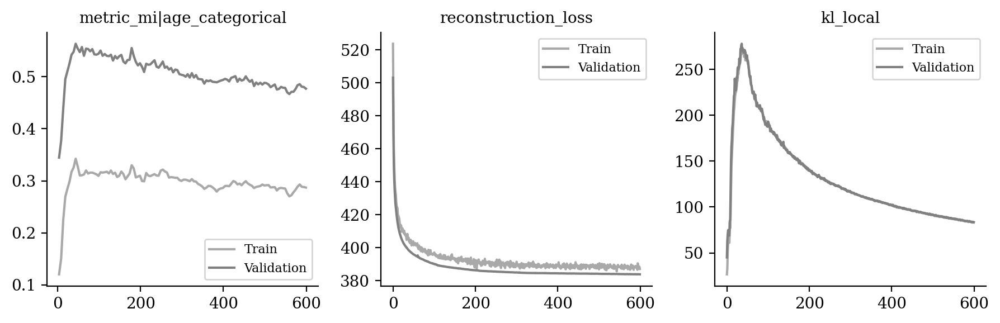

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

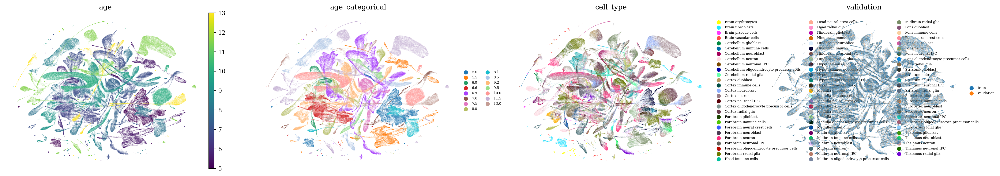

In [13]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

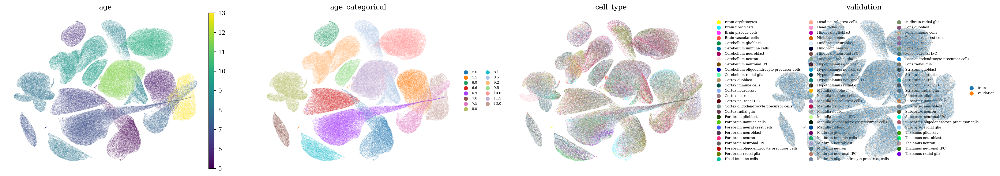

In [14]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

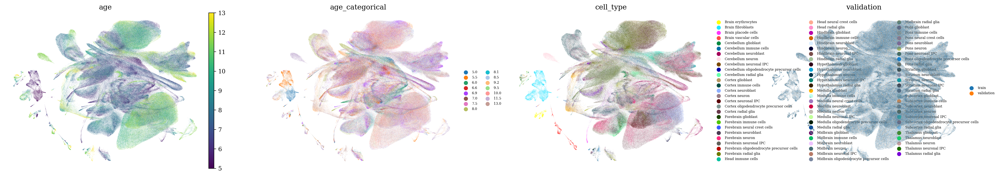

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )